# Data Science Project on Fifa 20 file

# Preface
The FIFA 20 dataset provides a comprehensive collection of player statistics from the FIFA 20 video game, featuring an extensive array of attributes such as age, nationality, position, and various performance metrics including passing, shooting, dribbling, defending, and overall ratings.   

To gain a deeper understanding of the dataset, the analysis begins with a detailed Exploratory Data Analysis (EDA). During this phase, we visualize the distribution of each attribute, identify any patterns, investigate missing values, and detect outliers that could potentially skew the clustering results.  

Correlations between variables are also assessed to understand how different attributes influence one another. Based on these insights, we perform feature engineering, which involves addressing missing data using imputation techniques, scaling numerical features for better performance in machine learning algorithms, and encoding categorical features for compatibility with clustering models. This process also includes creating new features where necessary to capture more relevant information that could enhance the clustering performance.

After refining the dataset, we proceed with clustering to group players based on their attributes. Techniques like K-Means, DBSCAN, and Gaussian Mixture Models (GMM) are applied to identify distinct clusters within the dataset. The goal is to categorize players into meaningful roles such as attackers, midfielders, defenders, and goalkeepers based on their performance profiles. These clusters provide insights into player specialization, helping to identify patterns in the data that are otherwise hard to detect.

 Furthermore, we evaluate the performance of the clustering models using metrics such as the Silhouette Score to assess the quality of the cluster separation and cohesion. Through this analysis, we aim to provide a more nuanced understanding of how different player attributes correlate and how they can be used to effectively group players in a football context.





## Problem statment
- Prepare a complete data analysis report on the given data.
- Explore football skills and cluster football players based on their attributes.
- Explore the data and attempt all the below asked questions in a
step by step manner:
     - Prepare a rank ordered list of top 10 countries with most players. Which countries are producing the most footballers that play at this level?
     - Plot the distribution of overall rating vs. age of players. Interpret what is the age after which a player stops improving?
     - Which type of offensive players tends to get paid the most: the striker, the right-winger, or the left-winger?


## Import required libraries

In [ ]:
import pandas as pd
import sklearn
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings

warnings.filterwarnings('ignore')

## Domain Analysis

##### Fifa 20 - It is FIFA 20 is a football simulation video game published by Electronic Arts as part of the FIFA series. It is the 27th installment in the series and was released on 27 September 2019 for Microsoft Windows, PlayStation 4, Xbox One and Nintendo Switch.

**SOFIFA-ID:**  
Id of fifa20 player

__PLAYER URL:__  
A URL (Uniform Resource Locator) is a unique identifier used to locate a resource on the Internet. It is also referred to as a web address.

__SHORT NAME:__  
Short or nick name name of player

__LONG NAME:__  
Full name of player

__AGE:__  
Age in years

__DOB:__  
Date of birth of player

__HEIGHT CM:__  
Player height in centimeter

__WEIGHT KG:__  
Player body weight

__NATIONALITY:__  
Nationality is the legal status, which represents the country from which an individual belongs.

__CLUB:__  
A group of people formed for the purpose of playing sports.

__OVERALL:__  
The OVR (Overall) is made up of all the player's ingame stats.

__POTENTIAL:__  
The potential rating, is the rating they will achieve for sure during the FIFA 20 career mode.

__VALUE EUR:__  
The value of palyer in Euro.

__WAGE EUR:__  
weekly salary a player earns in Euros.

__PLAYER POSITIONS:__  
Positions indicate approximately where each player should be lined up prior to the start of a play.

__PREFEERED FOOT:__  
Footedness may refer to the foot a player uses to kick with the greatest force and skill.

__INTERNATIONAL REPUTATION:__  
International reputation is rated with 1-5 stars.

__WEAK FOOT:__  
A player's foot (left or right) that is weaker than their preferred foot. A player's attribute rated between 1 to 5 which specifies the shot power and ball control for the other foot of that player than his preferred foot's.

__SKILL MOVES:__  
skill moves, it is assigned a number between 1 (least complex) and 5 (most complex). Players with higher skills are able to perform more complex moves.

__WORK RATE:__  
work rates are how hard the player works on each end of the field.

__BODY-TYPE:__  
A custom body type and character of football payer.

__REAL FACE:__  
Face scan of real football palyer if it 'yes' then the character is look super realistic.

__RELEASE CLAUSE EUR:__  
A release clause is the minimum amount of money you're willing to accept for that player.

__PLAYER TAGS:__  
The tages of player is identified the palyer skills,like [Dribbler, Distance shooter, Crosser, Speedster]

__TEAM POSITION:__  
The player’s positioning on the field

__TEAM JERSEY NUMBER:__  
The number on the back of a football player's jersey is to identify a specific player.

__LONED FROM:__  
It's a temporary restriction placed on player due to their club being short of players.

__JOINED:__  
Joining date of club

__CONTRACT VALID UNTIL:__  
The end year of contract of players.

__NATION POSITION:__  
Nation position is similar to the team position of players.

__NATION JERSEY NUMBER:__  
Jersey number of player.

__PACE:__  
Fastest pace of player,striker or winger

__SHOOTING:__  
shooting is hitting the ball in an attempt to score a goal. It is usually done using the feet or head.

__PASSING:__  
The purpose of passing is to keep possession of the ball by maneuvering it on the ground between different players with the objective of advancing it up the playing field.

__DRIBLING:__  
Dribbling Is Maneuvering A Ball By One Player While Moving In A Given Direction, Avoiding Problems’ Attempts To Intercept The Ball.

__DEFENDING:__  
Defending is most relate to the defender to stop the attack

__PHYSIC:__  
physic in player means intensity and their effort.

__GK DIVING:__  
Goal keeper diving to save a shot.

__GK HANDLING:__  
As a goalkeeper, you are allowed to handle the ball with your hands within your penalty area.

__GK KICKING:__  
The goalkeeper is the player who usually kicks the ball to resume play, and they either kick it short to a teammate or it is kicked extremely hard to travel a long distance.

__GK REFLEX:__  
Ability to react quickly.

__GK SPEED:__  
Spped of goal keeper.

__GK POSITIONING:__  
Position of goal keeper is around only goal posts.

__PLAYER TRAITS:__  
A player’s traits are actions that he will be more likely to perform in matches.

__ATTACKING CROSSING:__  
The aim of a cross is to create the easiest possible scenario for the attacking player to score a goal.

__ATTACKING FINISHING:__  
Create a attack on field to score a goal

__ATTACKING HEADING ACCURACY:__  
One of the fundamental principles of the attacking header is to head the ball downwards.

__ATTACKING SHORT PASSING:__  
Short passes of ball to score a goal

__ATTACKING VOLLEYS:__  
A volley is an air-borne strike in association football, where a player's foot meets and directs the ball in an angled direction before it has time to reach the ground.

__SKILL DRIBBLING:__  
The score of dribbling skill with football

__SKILL CURVE:__  
The curve of football at the time of goal

__SKILL FK ACCURACY:__  
It stands for field goal. It is when a player kicks a ball through the uprights from a set distance.

__SKILL LONG PASSING:__  
The long passing skill score of the player

__SKILL BALL CONTROL:__  
The ball control of the player at playing time

__MOVEMENT ACCERLATION:__  
how quickly player can increase your velocity towards maximum speed.

__MOVEMENT SPRINT SPPED:__  
Sprinting speed score of the player.

__MOVEMENT AGILITY:__  
Agility is the ability to move quickly and easily, including moving in different directions without losing balance

__MOVEMENT REACTION:__  
The score of the quick reation of player.

__MOVEMENT BALANCE:__  
Balance is the ability to control your body in its own space.

__SHOT POWER:__  
power generate to score a goal.

__POWER JUMPING:__  
The jumping ability of the player on field.

__POWER STAMINA:__  
Stamina of player on filed.

__POWER STRENGTH:__  
Strength of player on field.

__POWER LONG SHOT:__  
Total no of power long shot of football.

__MENTAILITY AGGRESSION:__   
aggression is a characteristic that can have many negative as well as positive effects on performance of player.

__MENTALITY INTERCEPTION:__    
interception is thrown the possession of the ball is given to the other team.

__MENTALITY POSITIONING:__   
The mentality positioning of player determines how defensive or attacking your players set out to play.

__MENTALITY VISION:__  
The vision/mindset of player on filed.

__MENTALITIES PENALTIES:__  
when a player commits an infraction against the rules of the game a foul will be called and a penalty will be assessed.

__MENTALITY COMPOSURE:__  
composure stand for: Recognize–Regroup–Refocus. The first step is to Recognize that you are dwelling on the mistake, which limits your ability focus on the next play.

__DEFENDING MAKING:__  
when your team is defending, you want to make the field small and the options of the other team limited.

__DEFENDING STANDING TACKLE:__  
Defending standing Tackle of the player to get a ball on filed.

__DEFENDING SLIDING TACKLE:__
Defending sliding tackle of player to get a ball.

__GOALKEEPING DIVING:__   
Goal keeper diving to save a goal.

__GOALKEEPING HANDLING:__  
handle the ball with your hands within your penalty area.

__GOALKEEPING KICKING:__  
A kick taken by the goalkeeper when the attacking team has kicked the ball over the goal line.

__GOALKEEPING POSITIONING:__  
A Positioning of player to save the goal.

__GOALKEEPING REFLEX:__  
The reflex of goalkeeper and players.

## THE REMAINING FEATURE IS THE ABBREVATION OF FOOTBALL POSITION SCORE:
__LS:__   
Long snapper or left striker.

__ST:__  
Striker

__RS:__  
Right striker

__LW:__  
Left sided wingers.

__LF:__  
Left forword

__CF:__  
Center forword

__RF:__  
Right forword

__RW:__  
The RW is usually on the right end of the attacking trident, with the Striker and Left Winger, which mainly contributes to the team in terms of goals and assists.

__LAM:__  
Left attacking midfield

__CAM:__  
Center attacking midfield

__RAM:__  
Right attacking midfield

__LM:__  
Left midfield

__LCM:__  
Left center midfield

__CM:__  
Center Midfield

__RCM:__  
Right center midfield

__RM:__  
Right midfield

__LWB:__  
Left Wing Back

__LDM:__  
Left defensive midfield

__CDM:__  
Center defensive midfield

__RDM:__  
Right defensive midfield

__RWB:__  
Right wing back

__LB:__   
Left back

__LCB:__   
Left center back

__CB:__   
Center back

__RCB:__   
Right center back

__RB:__   
Right Back

## Basic Checks

In [ ]:
df=pd.read_csv('players_20.csv')



In [ ]:
df

,sofifa_id,player_url,short_name,long_name,age,dob,height_cm,weight_kg,nationality,club,...,lwb,ldm,cdm,rdm,rwb,lb,lcb,cb,rcb,rb
0,158023,https://sofifa.com/player/158023/lionel-messi/...,L. Messi,Lionel Andrés Messi Cuccittini,32,1987-06-24,170,72,Argentina,FC Barcelona,...,68+2,66+2,66+2,66+2,68+2,63+2,52+2,52+2,52+2,63+2
1,20801,https://sofifa.com/player/20801/c-ronaldo-dos-...,Cristiano Ronaldo,Cristiano Ronaldo dos Santos Aveiro,34,1985-02-05,187,83,Portugal,Juventus,...,65+3,61+3,61+3,61+3,65+3,61+3,53+3,53+3,53+3,61+3
2,190871,https://sofifa.com/player/190871/neymar-da-sil...,Neymar Jr,Neymar da Silva Santos Junior,27,1992-02-05,175,68,Brazil,Paris Saint-Germain,...,66+3,61+3,61+3,61+3,66+3,61+3,46+3,46+3,46+3,61+3
3,200389,https://sofifa.com/player/200389/jan-oblak/20/...,J. Oblak,Jan Oblak,26,1993-01-07,188,87,Slovenia,Atlético Madrid,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,183277,https://sofifa.com/player/183277/eden-hazard/2...,E. Hazard,Eden Hazard,28,1991-01-07,175,74,Belgium,Real Madrid,...,66+3,63+3,63+3,63+3,66+3,61+3,49+3,49+3,49+3,61+3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
18273,245006,https://sofifa.com/player/245006/shuai-shao/20...,Shao Shuai,邵帅,22,1997-03-10,186,79,China PR,Beijing Renhe FC,...,43+2,42+2,42+2,42+2,43+2,45+2,46+2,46+2,46+2,45+2
18274,250995,https://sofifa.com/player/250995/mingjie-xiao/...,Xiao Mingjie,Mingjie Xiao,22,1997-01-01,177,66,China PR,Shanghai SIPG FC,...,44+2,43+2,43+2,43+2,44+2,46+2,47+2,47+2,47+2,46+2
18275,252332,https://sofifa.com/player/252332/wei-zhang/20/...,Zhang Wei,张威,19,2000-05-16,186,75,China PR,Hebei China Fortune FC,...,47+2,49+2,49+2,49+2,47+2,47+2,49+2,49+2,49+2,47+2
18276,251110,https://sofifa.com/player/251110/haijian-wang/...,Wang Haijian,汪海健,18,2000-08-02,185,74,China PR,Shanghai Greenland Shenhua FC,...,48+2,48+2,48+2,48+2,48+2,48+2,49+2,49+2,49+2,48+2


In [ ]:
df.head()

,sofifa_id,player_url,short_name,long_name,age,dob,height_cm,weight_kg,nationality,club,...,lwb,ldm,cdm,rdm,rwb,lb,lcb,cb,rcb,rb
0,158023,https://sofifa.com/player/158023/lionel-messi/...,L. Messi,Lionel Andrés Messi Cuccittini,32,1987-06-24,170,72,Argentina,FC Barcelona,...,68+2,66+2,66+2,66+2,68+2,63+2,52+2,52+2,52+2,63+2
1,20801,https://sofifa.com/player/20801/c-ronaldo-dos-...,Cristiano Ronaldo,Cristiano Ronaldo dos Santos Aveiro,34,1985-02-05,187,83,Portugal,Juventus,...,65+3,61+3,61+3,61+3,65+3,61+3,53+3,53+3,53+3,61+3
2,190871,https://sofifa.com/player/190871/neymar-da-sil...,Neymar Jr,Neymar da Silva Santos Junior,27,1992-02-05,175,68,Brazil,Paris Saint-Germain,...,66+3,61+3,61+3,61+3,66+3,61+3,46+3,46+3,46+3,61+3
3,200389,https://sofifa.com/player/200389/jan-oblak/20/...,J. Oblak,Jan Oblak,26,1993-01-07,188,87,Slovenia,Atlético Madrid,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,183277,https://sofifa.com/player/183277/eden-hazard/2...,E. Hazard,Eden Hazard,28,1991-01-07,175,74,Belgium,Real Madrid,...,66+3,63+3,63+3,63+3,66+3,61+3,49+3,49+3,49+3,61+3


In [ ]:
df.tail()

,sofifa_id,player_url,short_name,long_name,age,dob,height_cm,weight_kg,nationality,club,overall,potential,value_eur,wage_eur,player_positions,preferred_foot,international_reputation,weak_foot,skill_moves,work_rate,body_type,real_face,release_clause_eur,player_tags,team_position,team_jersey_number,loaned_from,joined,contract_valid_until,nation_position,nation_jersey_number,pace,shooting,passing,dribbling,defending,physic,gk_diving,gk_handling,gk_kicking,gk_reflexes,gk_speed,gk_positioning,player_traits,attacking_crossing,attacking_finishing,attacking_heading_accuracy,attacking_short_passing,attacking_volleys,skill_dribbling,skill_curve,skill_fk_accuracy,skill_long_passing,skill_ball_control,movement_acceleration,movement_sprint_speed,movement_agility,movement_reactions,movement_balance,power_shot_power,power_jumping,power_stamina,power_strength,power_long_shots,mentality_aggression,mentality_interceptions,mentality_positioning,mentality_vision,mentality_penalties,mentality_composure,defending_marking,defending_standing_tackle,defending_sliding_tackle,goalkeeping_diving,goalkeeping_handling,goalkeeping_kicking,goalkeeping_positioning,goalkeeping_reflexes,ls,st,rs,lw,lf,cf,rf,rw,lam,cam,ram,lm,lcm,cm,rcm,rm,lwb,ldm,cdm,rdm,rwb,lb,lcb,cb,rcb,rb
18273,245006,https://sofifa.com/player/245006/shuai-shao/20...,Shao Shuai,邵帅,22,1997-03-10,186,79,China PR,Beijing Renhe FC,48,56,40000,2000,CB,Right,1,3,2,Medium/High,Normal,No,70000.0,NaN,RES,36.0,NaN,2018-07-13,2019.0,NaN,NaN,57.0,23.0,28.0,33.0,47.0,51.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,21,17,40,35,27,24,23,21,28,35,56,58,45,40,73,36,70,60,47,16,46,48,28,25,39,41,45,50,52,5,5,13,5,14,32+2,32+2,32+2,31+2,31+2,31+2,31+2,31+2,31+2,31+2,31+2,33+2,33+2,33+2,33+2,33+2,43+2,42+2,42+2,42+2,43+2,45+2,46+2,46+2,46+2,45+2
18274,250995,https://sofifa.com/player/250995/mingjie-xiao/...,Xiao Mingjie,Mingjie Xiao,22,1997-01-01,177,66,China PR,Shanghai SIPG FC,48,56,40000,2000,CB,Right,1,2,2,Medium/Medium,Normal,No,72000.0,NaN,SUB,31.0,NaN,2019-02-01,2022.0,NaN,NaN,58.0,24.0,33.0,35.0,48.0,48.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,24,20,42,43,28,32,24,29,39,31,55,61,43,41,76,33,72,55,44,20,42,49,23,25,37,35,42,53,57,13,6,14,11,9,33+2,33+2,33+2,33+2,32+2,32+2,32+2,33+2,33+2,33+2,33+2,35+2,36+2,36+2,36+2,35+2,44+2,43+2,43+2,43+2,44+2,46+2,47+2,47+2,47+2,46+2
18275,252332,https://sofifa.com/player/252332/wei-zhang/20/...,Zhang Wei,张威,19,2000-05-16,186,75,China PR,Hebei China Fortune FC,48,56,40000,1000,CM,Right,1,2,2,Low/Medium,Lean,No,70000.0,NaN,SUB,38.0,NaN,2019-01-01,2019.0,NaN,NaN,54.0,35.0,44.0,45.0,48.0,51.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,32,33,49,53,32,40,32,32,55,49,55,54,52,52,57,48,60,50,51,26,50,45,38,38,36,39,46,52,46,7,8,10,6,14,43+2,43+2,43+2,43+2,43+2,43+2,43+2,43+2,44+2,44+2,44+2,45+2,46+2,46+2,46+2,45+2,47+2,49+2,49+2,49+2,47+2,47+2,49+2,49+2,49+2,47+2
18276,251110,https://sofifa.com/player/251110/haijian-wang/...,Wang Haijian,汪海健,18,2000-08-02,185,74,China PR,Shanghai Greenland Shenhua FC,48,54,40000,1000,CM,Right,1,2,2,Low/Low,Lean,No,70000.0,NaN,SUB,33.0,NaN,2019-02-01,2022.0,NaN,NaN,59.0,35.0,47.0,47.0,45.0,52.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,39,34,47,54,28,42,37,39,48,49,55,63,55,54,59,46,61,42,55,28,57,49,31,48,36,40,39,44,54,14,9,13,13,13,43+2,43+2,43+2,45+2,44+2,44+2,44+2,45+2,46+2,46+2,46+2,46+2,46+2,46+2,46+2,46+2,48+2,48+2,48+2,48+2,48+2,48+2,49+2,49+2,49+2,48+2
18277,233449,https://sofifa.com/player/233449/ximing-pan/20...,Pan Ximing,潘喜明,26,1993-01-11,182,78,China PR,Hebei China Fortune FC,48,51,40000,2000,CM,Right,1,3,2,Medium/Medium,Normal,No,NaN,NaN,SUB,37.0,Tianjin TEDA FC,NaN,2019.0,NaN,NaN,60.0,32.0,51.0,45.0,47.0,55.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,44,30,48,58,25,40,34,35,52,46,54,64,52,49,71,41,64,40,61,30,54,47,29,52,38,42,52,42,48,8,12,14,9,10,42+2,42+2,42+2,44+2,43+2,43+2,43+2,44+2,46+2,46+2,46+2,46+2,46+2,46+2,46+2,46+2,48+2,49+2,49+2,49+2,48+2,48+2,50+2,50+2,50+2,48+2


In [ ]:
df.describe()

,sofifa_id,age,height_cm,weight_kg,overall,potential,value_eur,wage_eur,international_reputation,weak_foot,skill_moves,release_clause_eur,team_jersey_number,contract_valid_until,nation_jersey_number,pace,shooting,passing,dribbling,defending,physic,gk_diving,gk_handling,gk_kicking,gk_reflexes,gk_speed,gk_positioning,attacking_crossing,attacking_finishing,attacking_heading_accuracy,attacking_short_passing,attacking_volleys,skill_dribbling,skill_curve,skill_fk_accuracy,skill_long_passing,skill_ball_control,movement_acceleration,movement_sprint_speed,movement_agility,movement_reactions,movement_balance,power_shot_power,power_jumping,power_stamina,power_strength,power_long_shots,mentality_aggression,mentality_interceptions,mentality_positioning,mentality_vision,mentality_penalties,mentality_composure,defending_marking,defending_standing_tackle,defending_sliding_tackle,goalkeeping_diving,goalkeeping_handling,goalkeeping_kicking,goalkeeping_positioning,goalkeeping_reflexes
count,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,1.827800e+04,18278.000000,18278.000000,18278.000000,18278.000000,1.698000e+04,18038.000000,18038.000000,1126.000000,16242.000000,16242.000000,16242.000000,16242.000000,16242.000000,16242.000000,2036.000000,2036.000000,2036.000000,2036.000000,2036.000000,2036.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000
mean,219738.864482,25.283291,181.362184,75.276343,66.244994,71.546887,2.484038e+06,9456.942773,1.103184,2.944250,2.368038,4.740717e+06,20.103892,2021.114591,12.114565,67.700899,52.298301,57.233777,62.531585,51.553503,64.876678,65.422397,63.146365,61.832515,66.390472,37.798625,63.374754,49.718405,45.590218,52.221468,58.748003,42.809388,55.596509,47.325692,42.708885,52.768848,58.461976,64.299923,64.415746,63.504924,61.752544,63.856439,58.181694,64.928165,62.889485,65.234763,46.812945,55.742149,46.380239,50.072163,53.609749,48.383357,58.528778,46.848889,47.640333,45.606631,16.572765,16.354853,16.212934,16.368038,16.709924
std,27960.200461,4.656964,6.756961,7.047744,6.949953,6.139669,5.585481e+06,21351.714095,0.378861,0.664656,0.765038,1.103002e+07,16.603639,1.289888,6.735922,11.297656,14.029418,10.407844,10.284950,16.419528,9.760162,7.736278,7.244023,7.510709,8.154062,10.634038,8.447876,18.325403,19.594609,17.428429,14.679653,17.701815,18.929118,18.422991,17.433612,15.246454,16.741878,15.042232,14.847763,14.808380,9.135613,14.201559,13.326083,11.934059,16.017954,12.534811,19.322343,17.318157,20.775812,19.594022,13.955626,15.708099,11.880840,20.091287,21.585641,21.217734,17.738069,16.996925,16.613665,17.136497,18.038125
min,768.000000,16.000000,156.000000,50.000000,48.000000,49.000000,0.000000e+00,0.000000,1.000000,1.000000,1.000000,1.300000e+04,1.000000,2019.000000,1.000000,24.000000,15.000000,24.000000,23.000000,15.000000,27.000000,44.000000,42.000000,35.000000,45.000000,12.000000,41.000000,5.000000,2.000000,5.000000,7.000000,3.000000,4.000000,6.000000,4.000000,8.000000,5.000000,12.000000,11.000000,11.000000,21.000000,12.000000,14.000000,19.000000,12.000000,20.000000,4.000000,9.000000,3.000000,2.000000,9.000000,7.000000,12.000000,1.000000,5.000000,3.000000,1.000000,1.000000,1.000000,1.000000,1.000000
25%,204445.500000,22.000000,177.000000,70.000000,62.000000,67.000000,3.250000e+05,1000.000000,1.000000,3.000000,2.000000,5.630000e+05,9.000000,2020.000000,6.000000,61.000000,42.000000,50.000000,57.000000,36.000000,59.000000,60.000000,58.000000,57.000000,60.750000,29.000000,58.000000,38.000000,30.000000,44.000000,54.000000,30.000000,50.000000,34.000000,31.000000,43.000000,54.000000,56.000000,57.

In [ ]:
df.loc[df['height_cm']<200]

,sofifa_id,player_url,short_name,long_name,age,dob,height_cm,weight_kg,nationality,club,...,lwb,ldm,cdm,rdm,rwb,lb,lcb,cb,rcb,rb
0,158023,https://sofifa.com/player/158023/lionel-messi/...,L. Messi,Lionel Andrés Messi Cuccittini,32,1987-06-24,170,72,Argentina,FC Barcelona,...,68+2,66+2,66+2,66+2,68+2,63+2,52+2,52+2,52+2,63+2
1,20801,https://sofifa.com/player/20801/c-ronaldo-dos-...,Cristiano Ronaldo,Cristiano Ronaldo dos Santos Aveiro,34,1985-02-05,187,83,Portugal,Juventus,...,65+3,61+3,61+3,61+3,65+3,61+3,53+3,53+3,53+3,61+3
2,190871,https://sofifa.com/player/190871/neymar-da-sil...,Neymar Jr,Neymar da Silva Santos Junior,27,1992-02-05,175,68,Brazil,Paris Saint-Germain,...,66+3,61+3,61+3,61+3,66+3,61+3,46+3,46+3,46+3,61+3
3,200389,https://sofifa.com/player/200389/jan-oblak/20/...,J. Oblak,Jan Oblak,26,1993-01-07,188,87,Slovenia,Atlético Madrid,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,183277,https://sofifa.com/player/183277/eden-hazard/2...,E. Hazard,Eden Hazard,28,1991-01-07,175,74,Belgium,Real Madrid,...,66+3,63+3,63+3,63+3,66+3,61+3,49+3,49+3,49+3,61+3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
18273,245006,https://sofifa.com/player/245006/shuai-shao/20...,Shao Shuai,邵帅,22,1997-03-10,186,79,China PR,Beijing Renhe FC,...,43+2,42+2,42+2,42+2,43+2,45+2,46+2,46+2,46+2,45+2
18274,250995,https://sofifa.com/player/250995/mingjie-xiao/...,Xiao Mingjie,Mingjie Xiao,22,1997-01-01,177,66,China PR,Shanghai SIPG FC,...,44+2,43+2,43+2,43+2,44+2,46+2,47+2,47+2,47+2,46+2
18275,252332,https://sofifa.com/player/252332/wei-zhang/20/...,Zhang Wei,张威,19,2000-05-16,186,75,China PR,Hebei China Fortune FC,...,47+2,49+2,49+2,49+2,47+2,47+2,49+2,49+2,49+2,47+2
18276,251110,https://sofifa.com/player/251110/haijian-wang/...,Wang Haijian,汪海健,18,2000-08-02,185,74,China PR,Shanghai Greenland Shenhua FC,...,48+2,48+2,48+2,48+2,48+2,48+2,49+2,49+2,49+2,48+2


In [ ]:
df.describe(include='O')

,player_url,short_name,long_name,dob,nationality,club,player_positions,preferred_foot,work_rate,body_type,...,lwb,ldm,cdm,rdm,rwb,lb,lcb,cb,rcb,rb
count,18278,18278,18278,18278,18278,18278,18278,18278,18278,18278,...,16242,16242,16242,16242,16242,16242,16242,16242,16242,16242
unique,18278,17354,18218,6142,162,698,643,2,9,10,...,98,98,98,98,98,96,110,110,110,96
top,https://sofifa.com/player/158023/lionel-messi/...,J. Rodríguez,Liam Kelly,1992-02-29,England,FC Barcelona,CB,Right,Medium/Medium,Normal,...,59+2,59+2,59+2,59+2,59+2,61+2,63+2,63+2,63+2,61+2
freq,1,11,3,113,1667,33,2322,13960,9875,10750,...,682,636,636,636,682,667,621,621,621,667


In [ ]:
for column,unique in df.nunique().items():
    print(f"the column {column} has {unique} unique values")

the column sofifa_id has 18278 unique values
the column player_url has 18278 unique values
the column short_name has 17354 unique values
the column long_name has 18218 unique values
the column age has 27 unique values
the column dob has 6142 unique values
the column height_cm has 49 unique values
the column weight_kg has 56 unique values
the column nationality has 162 unique values
the column club has 698 unique values
the column overall has 47 unique values
the column potential has 47 unique values
the column value_eur has 214 unique values
the column wage_eur has 141 unique values
the column player_positions has 643 unique values
the column preferred_foot has 2 unique values
the column international_reputation has 5 unique values
the column weak_foot has 5 unique values
the column skill_moves has 5 unique values
the column work_rate has 9 unique values
the column body_type has 10 unique values
the column real_face has 2 unique values
the column release_clause_eur has 1224 unique valu

In [ ]:
df.shape

(18278, 104)

- It has 18278 rows and 104 columns

In [ ]:
df.info(verbose=True, show_counts=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 18278 entries, 0 to 18277
Data columns (total 104 columns):
 #    Column                      Non-Null Count  Dtype  
---   ------                      --------------  -----  
 0    sofifa_id                   18278 non-null  int64  
 1    player_url                  18278 non-null  object 
 2    short_name                  18278 non-null  object 
 3    long_name                   18278 non-null  object 
 4    age                         18278 non-null  int64  
 5    dob                         18278 non-null  object 
 6    height_cm                   18278 non-null  int64  
 7    weight_kg                   18278 non-null  int64  
 8    nationality                 18278 non-null  object 
 9    club                        18278 non-null  object 
 10   overall                     18278 non-null  int64  
 11   potential                   18278 non-null  int64  
 12   value_eur                   18278 non-null  int64  
 13   wage_eur      

- We found there are some null values in the dataset
- There are 16 float columns, 45 integer columns,43 object columns

## Exploratory Data Analyis

In [ ]:
df['rf']

,rf
0,93+2
1,90+3
2,89+3
3,NaN
4,88+3
...,...
18273,31+2
18274,32+2
18275,43+2
18276,44+2


- To remove + temporary boost (eg : +2) in order to convert string into integer

In [ ]:
df.columns.tolist()


['sofifa_id',
 'player_url',
 'short_name',
 'long_name',
 'age',
 'dob',
 'height_cm',
 'weight_kg',
 'nationality',
 'club',
 'overall',
 'potential',
 'value_eur',
 'wage_eur',
 'player_positions',
 'preferred_foot',
 'international_reputation',
 'weak_foot',
 'skill_moves',
 'work_rate',
 'body_type',
 'real_face',
 'release_clause_eur',
 'player_tags',
 'team_position',
 'team_jersey_number',
 'loaned_from',
 'joined',
 'contract_valid_until',
 'nation_position',
 'nation_jersey_number',
 'pace',
 'shooting',
 'passing',
 'dribbling',
 'defending',
 'physic',
 'gk_diving',
 'gk_handling',
 'gk_kicking',
 'gk_reflexes',
 'gk_speed',
 'gk_positioning',
 'player_traits',
 'attacking_crossing',
 'attacking_finishing',
 'attacking_heading_accuracy',
 'attacking_short_passing',
 'attacking_volleys',
 'skill_dribbling',
 'skill_curve',
 'skill_fk_accuracy',
 'skill_long_passing',
 'skill_ball_control',
 'movement_acceleration',
 'movement_sprint_speed',
 'movement_agility',
 'movement_re

In [ ]:
columns = ['ls', 'st', 'rs', 'lw', 'lf', 'cf', 'rf', 'rw', 'lam', 'cam', 'ram', 'lm', 'lcm', 'cm', 'rcm', 'rm', 'lwb', 'ldm', 'cdm', 'rdm', 'rwb', 'lb', 'lcb', 'cb', 'rcb', 'rb']


In [ ]:
for i in columns:
        df[i] = df[i].str.split('+').str[0]

In [ ]:
df=df.replace('[#]','',regex=True)

- It helps to remove # from the dataset

In [ ]:
for i in columns:
    df[i]=pd.to_numeric(df[i], errors='coerce').astype('Int64')

#### Observation:
- we are converting columns like ls,st,rs,lw,lf from object to int

In [ ]:
df.info(verbose=True,show_counts=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 18278 entries, 0 to 18277
Data columns (total 104 columns):
 #    Column                      Non-Null Count  Dtype  
---   ------                      --------------  -----  
 0    sofifa_id                   18278 non-null  int64  
 1    player_url                  18278 non-null  object 
 2    short_name                  18278 non-null  object 
 3    long_name                   18278 non-null  object 
 4    age                         18278 non-null  int64  
 5    dob                         18278 non-null  object 
 6    height_cm                   18278 non-null  int64  
 7    weight_kg                   18278 non-null  int64  
 8    nationality                 18278 non-null  object 
 9    club                        18278 non-null  object 
 10   overall                     18278 non-null  int64  
 11   potential                   18278 non-null  int64  
 12   value_eur                   18278 non-null  int64  
 13   wage_eur      

In [ ]:
df['player_tags']

,player_tags
0,"#Dribbler, #Distance Shooter, #Crosser, #FK Sp..."
1,"#Speedster, #Dribbler, #Distance Shooter, #Acr..."
2,"#Speedster, #Dribbler, #Playmaker , #Crosser,..."
3,NaN
4,"#Speedster, #Dribbler, #Acrobat"
...,...
18273,NaN
18274,NaN
18275,NaN
18276,NaN


In [ ]:
df

,sofifa_id,player_url,short_name,long_name,age,dob,height_cm,weight_kg,nationality,club,...,lwb,ldm,cdm,rdm,rwb,lb,lcb,cb,rcb,rb
0,158023,https://sofifa.com/player/158023/lionel-messi/...,L. Messi,Lionel Andrés Messi Cuccittini,32,1987-06-24,170,72,Argentina,FC Barcelona,...,68,66,66,66,68,63,52,52,52,63
1,20801,https://sofifa.com/player/20801/c-ronaldo-dos-...,Cristiano Ronaldo,Cristiano Ronaldo dos Santos Aveiro,34,1985-02-05,187,83,Portugal,Juventus,...,65,61,61,61,65,61,53,53,53,61
2,190871,https://sofifa.com/player/190871/neymar-da-sil...,Neymar Jr,Neymar da Silva Santos Junior,27,1992-02-05,175,68,Brazil,Paris Saint-Germain,...,66,61,61,61,66,61,46,46,46,61
3,200389,https://sofifa.com/player/200389/jan-oblak/20/...,J. Oblak,Jan Oblak,26,1993-01-07,188,87,Slovenia,Atlético Madrid,...,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>
4,183277,https://sofifa.com/player/183277/eden-hazard/2...,E. Hazard,Eden Hazard,28,1991-01-07,175,74,Belgium,Real Madrid,...,66,63,63,63,66,61,49,49,49,61
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
18273,245006,https://sofifa.com/player/245006/shuai-shao/20...,Shao Shuai,邵帅,22,1997-03-10,186,79,China PR,Beijing Renhe FC,...,43,42,42,42,43,45,46,46,46,45
18274,250995,https://sofifa.com/player/250995/mingjie-xiao/...,Xiao Mingjie,Mingjie Xiao,22,1997-01-01,177,66,China PR,Shanghai SIPG FC,...,44,43,43,43,44,46,47,47,47,46
18275,252332,https://sofifa.com/player/252332/wei-zhang/20/...,Zhang Wei,张威,19,2000-05-16,186,75,China PR,Hebei China Fortune FC,...,47,49,49,49,47,47,49,49,49,47
18276,251110,https://sofifa.com/player/251110/haijian-wang/...,Wang Haijian,汪海健,18,2000-08-02,185,74,China PR,Shanghai Greenland Shenhua FC,...,48,48,48,48,48,48,49,49,49,48


## Univariate Analysis

### Age columns:

In [ ]:
df['age'].describe()

,age
count,18278.000000
mean,25.283291
std,4.656964
min,16.000000
25%,22.000000
50%,25.000000
75%,29.000000
max,42.000000


<Axes: xlabel='age', ylabel='Count'>

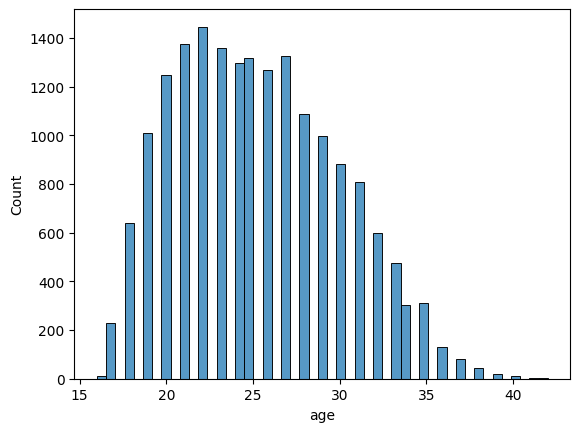

In [ ]:
sns.histplot(df['age'])

<Axes: xlabel='age', ylabel='Density'>

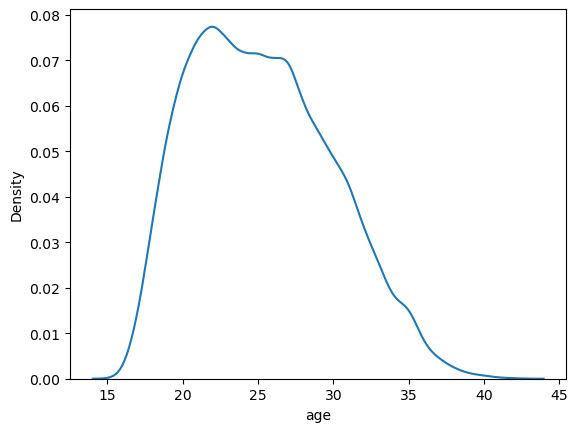

In [ ]:
sns.kdeplot(df['age'])

In [ ]:
df['age'].skew()

0.38061976075931975

In [ ]:
df['age'].isna().sum()

0

### Height column

In [ ]:
df['height_cm']

0        170
1        187
2        175
3        188
4        175
        ... 
18273    186
18274    177
18275    186
18276    185
18277    182
Name: height_cm, Length: 18278, dtype: int64

In [ ]:
df['height_cm'].describe()

count    18278.000000
mean       181.362184
std          6.756961
min        156.000000
25%        177.000000
50%        181.000000
75%        186.000000
max        205.000000
Name: height_cm, dtype: float64

In [ ]:
df['height_cm'].isna().sum()

0

<Axes: xlabel='height_cm', ylabel='Count'>

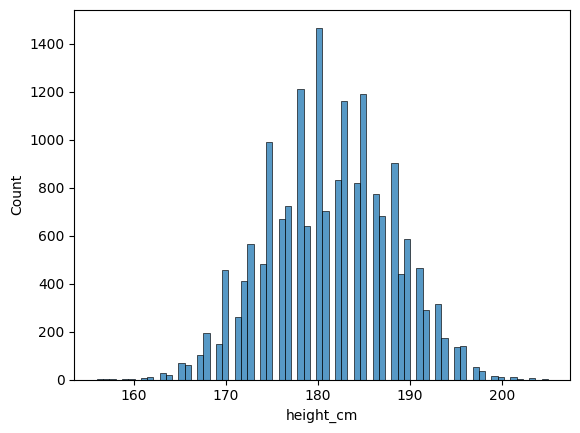

In [ ]:
sns.histplot(df['height_cm'])

<Axes: xlabel='height_cm', ylabel='Density'>

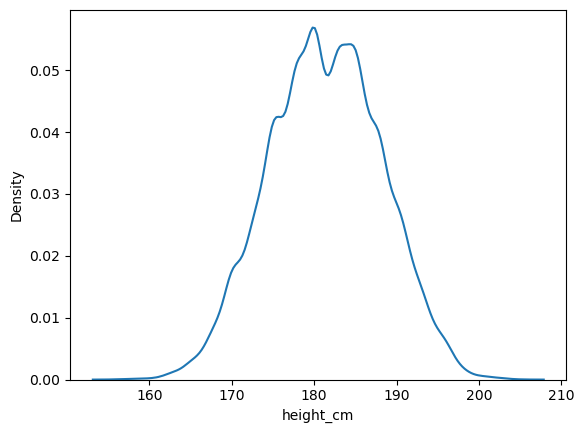

In [ ]:
sns.kdeplot(df['height_cm'])

In [ ]:
df['height_cm'].skew()

-0.03819688576323108

<Axes: xlabel='weight_kg', ylabel='Density'>

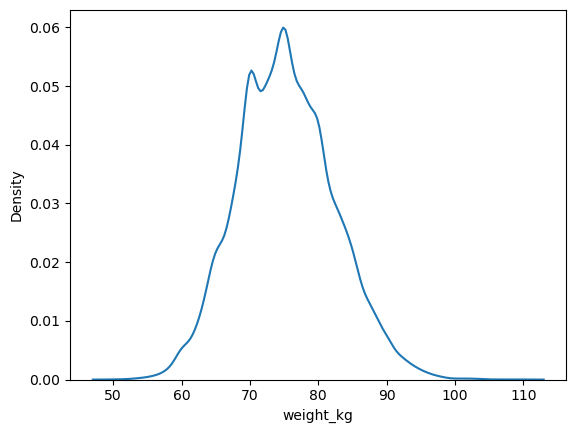

In [ ]:
### Weight
sns.kdeplot(df['weight_kg'])

In [ ]:
df['weight_kg'].skew()

0.22080235007640786

#### Nationality

In [ ]:
df['nationality'].describe()

,nationality
count,18278
unique,162
top,England
freq,1667


#### value_eur

<Axes: xlabel='value_eur', ylabel='Density'>

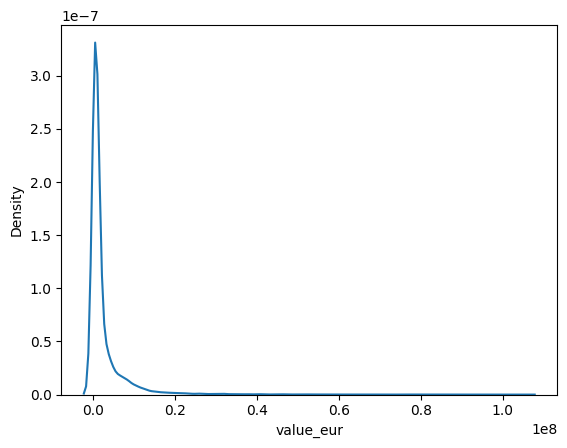

In [ ]:
sns.kdeplot(df['value_eur'])

In [ ]:


zero_value_players = df[df['value_eur'] == 0]
zero_value_players

,sofifa_id,player_url,short_name,long_name,age,dob,height_cm,weight_kg,nationality,club,...,lwb,ldm,cdm,rdm,rwb,lb,lcb,cb,rcb,rb
327,245309,https://sofifa.com/player/245309/egidio-maestr...,E. Schetino,Egidio Maestre Schetino,27,1992-02-29,185,80,Uruguay,Uruguay,...,73,76,76,76,73,76,80,80,80,76
328,245313,https://sofifa.com/player/245313/jose-maria-si...,J. Sildero,José María Sildero,27,1992-02-29,177,75,Uruguay,Uruguay,...,63,62,62,62,63,59,52,52,52,59
407,245299,https://sofifa.com/player/245299/jaime-nicolas...,J. Frendado,Jaime Nicolás Frendado,35,1984-02-29,181,82,Uruguay,Uruguay,...,69,72,72,72,69,72,80,80,80,72
408,245304,https://sofifa.com/player/245304/saul-marcelo-...,S. Ardero,Saúl Marcelo Ardero,31,1988-02-29,171,63,Uruguay,Uruguay,...,57,53,53,53,57,51,39,39,39,51
409,245305,https://sofifa.com/player/245305/luis-roberto-...,L. Dálves,Luis Roberto Dálves,27,1992-02-29,188,83,Uruguay,Uruguay,...,53,51,51,51,53,51,51,51,51,51
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16354,251745,https://sofifa.com/player/251745/chapal-palan/...,C. Palan,Chapal Palan,28,1991-06-20,181,69,India,India,...,60,59,59,59,60,61,61,61,61,61
16356,252735,https://sofifa.com/player/252735/hristo-ivanov...,H. Ivanov,Hristo Ivanov,37,1982-04-06,176,65,Bulgaria,Bulgaria,...,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>
16600,252359,https://sofifa.com/player/252359/eliezer-ira-t...,E. Ira Tape,Eliezer Ira Tape,21,1997-08-31,192,85,Ivory Coast,Côte d'Ivoire,...,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>
16714,251750,https://sofifa.com/player/251750/dhwanil-singh...,D. Singhal,Dhwanil Singhal,34,1984-11-09,177,71,India,India,...,57,56,56,56,57,57,57,57,57,57


### preferred_foot

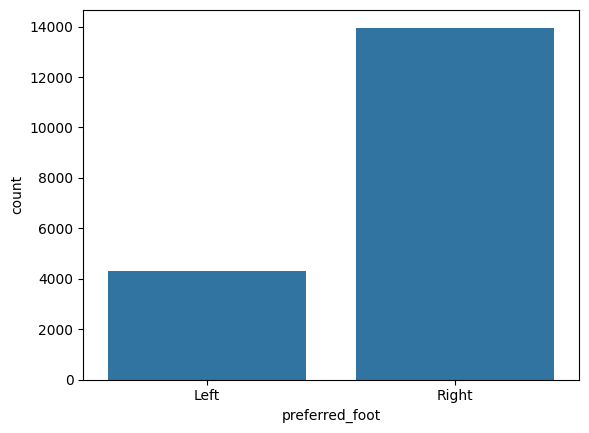

In [ ]:
sns.countplot(data=df,x='preferred_foot')
value=df['preferred_foot'].value_counts()


In [ ]:
label=['right','left']

([<matplotlib.patches.Wedge at 0x7b9fdac999c0>,
 [Text(-0.8107034653207654, 0.7434782386303601, 'right'),
  Text(0.810703500125493, -0.7434782006785909, 'left')],
 [Text(-0.4422018901749629, 0.4055335847074691, '76%'),
  Text(0.4422019091593598, -0.4055335640065041, '24%')])

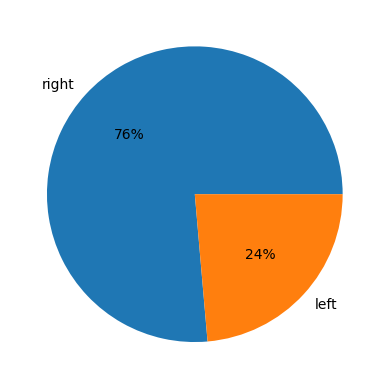

In [ ]:
plt.pie(value,labels=label,autopct='%1.0f%%')

#### International repuatation

([<matplotlib.patches.Wedge at 0x7839dcf3c340>,
 [Text(-0.30277294186631554, -1.1611755016678644, '1'),
  Text(0.43266976723930467, 1.3314641837154637, '2'),
  Text(0.10201716419669826, 1.496526811724155, '3'),
  Text(0.01595029091018952, 1.5999204943433536, '4'),
  Text(0.0017534176768650399, 1.6999990957428333, '5')],
 [Text(-0.17661754942201738, -0.677352375972921, '92%'),
  Text(0.27814485036812436, 0.8559412609599408, '6%'),
  Text(0.06801144279779883, 0.9976845411494366, '2%'),
  Text(0.010965825000755294, 1.0999453398610555, '0%'),
  Text(0.0012377065954341457, 1.1999993617008233, '0%')])

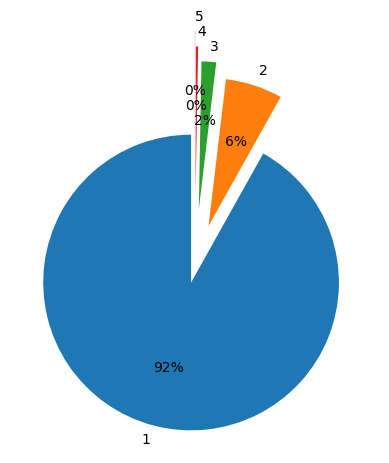

In [ ]:
reputecount=df['international_reputation'].value_counts()
explode = (0.1, 0.3, 0.4, 0.5, 0.6)
plt.pie(reputecount,labels=reputecount.index,autopct='%1.0f%%',startangle=90,explode=explode)


In [ ]:
reputecount

,count
international_reputation,
1,16794
2,1140
3,292
4,46
5,6


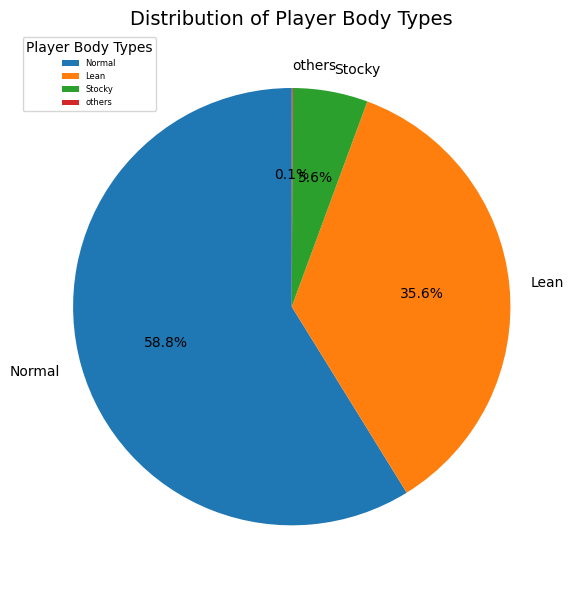

In [ ]:
import matplotlib.pyplot as plt

# Example data
labels = ['Normal', 'Lean', 'Stocky','others']
sizes = [58.81, 35.571,5.55, 0.069]


# Create the figure
plt.figure(figsize=(8, 6))
plt.pie(
    sizes,
    labels=labels,
    autopct='%1.1f%%',

    startangle=90,
    textprops={'fontsize': 10}
)

plt.legend(labels, loc='upper left', fontsize=6, title="Player Body Types")


plt.title('Distribution of Player Body Types', fontsize=14)

plt.tight_layout()
plt.show()


In [ ]:
df['body_type'].value_counts()

,count
body_type,
Normal,10750
Lean,6505
Stocky,1016
Messi,1
C. Ronaldo,1
Neymar,1
PLAYER_BODY_TYPE_25,1
Courtois,1
Shaqiri,1


In [ ]:
df.loc[(df['goalkeeping_diving']>20) & (df['goalkeeping_diving']<40)]

,sofifa_id,player_url,short_name,long_name,age,dob,height_cm,weight_kg,nationality,club,...,lwb,ldm,cdm,rdm,rwb,lb,lcb,cb,rcb,rb
19,176580,https://sofifa.com/player/176580/luis-suarez/2...,L. Suárez,Luis Alberto Suárez Díaz,32,1987-01-24,182,86,Uruguay,FC Barcelona,...,67,67,67,67,67,64,63,63,63,64
1423,53914,https://sofifa.com/player/53914/phil-jagielka/...,P. Jagielka,Phil Jagielka,36,1982-08-17,180,87,England,Sheffield United,...,62,68,68,68,62,64,74,74,74,64
4441,152567,https://sofifa.com/player/152567/alexander-tet...,A. Tettey,Alexander Banor Tettey,33,1986-04-04,180,68,Norway,Norwich City,...,67,70,70,70,67,67,71,71,71,67
6178,208153,https://sofifa.com/player/208153/lars-veldwijk...,L. Veldwijk,Lars Veldwijk,27,1991-08-21,196,95,South Africa,Sparta Rotterdam,...,44,44,44,44,44,42,46,46,46,42
8324,221179,https://sofifa.com/player/221179/sebastian-cor...,Sebas Coris,Sebastián Coris Cardeñosa,26,1993-05-31,182,72,Spain,Girona FC,...,64,60,60,60,64,63,56,56,56,63
10930,221488,https://sofifa.com/player/221488/ryan-hollings...,R. Hollingshead,Ryan Hollingshead,28,1991-04-16,185,82,United States,FC Dallas,...,64,65,65,65,64,64,67,67,67,64
15254,185165,https://sofifa.com/player/185165/peter-vincent...,P. Vincenti,Peter Vincenti,32,1986-07-07,193,76,England,Macclesfield Town,...,57,58,58,58,57,57,60,60,60,57


we are  use sweetviz library for univariatre analysis because we could not plot for every features in the dataset

In [ ]:
sv = sweetviz.analyze(df)
sv.show_html()

                                             |          | [  0%]   00:00 -> (? left)


KeyboardInterrupt



### Observation:   
#### Age:
- It does not follow normal distribution it was less rightly skewed
- Most of players age falls between 20 to 30 and thier average is 25
- There is no null values

#### Height_cm
- Most of the players height falls between 175 to 190 cm and their average is
  180
- maximum height is 205 and minimum height is 165
- There is no null values
- it does not follow normal distribution it was left skewed but close to normal

#### Weight
- Most of the Players weight range between 70 and 80 and average  weight is 75
- Maximum weight is 110 and minimum weight is 50
- There is no missing values
- it does not follow normal distribution and it was right skewed

#### Nationality
-  There is 162 unique values and england has higher frequency
-  There is no null values

#### overall
- Most of the Players overall performance range between 65 to 75  average  weight is 66
- Minimum is 48 and Maximum is 94
- There is no missing values

#### Potential
- Most of the Players overall performance range between 65 to 75  average  weight is 66
- Minimum is 49 and Maximum is 95
- There is no missing values

#### value_eur
- It is extremely right skewed
- Maximum salary is 105 million euros and average salary is 2.5m
- there are payers with zero wage, it si not possible there is an error

#### preferred foot
- 76 % players prefer right foot and 24 prefer left foot
- There is no missing values

#### International reputation
- International repuation ranges between 1 to 5
- 92% players are in rating 1,6% players are in rating 2, 2% players are in rating 3,4 and 5

#### Weak Foot
- Weak foot ranges between 1 to 5
- Most of the players rating is 3
- There is no null values

#### skill moves
- The skill moves range between 1 to 5.
- skill moves is maximum in player as well as 36% is 3 and 11% is 1 skill moves.

#### work_rate
-  54 % of players work rate is medium/medium
-  there is no null values.

#### Body type
- 59% players has normal bodytype
- 36% are lean
- 6% are stocky
- 1% others

#### release_clause_eur
- The maximum release clasue of player is 165.8million with the average of 4.7 million

#### Player tags
- 92% are missing values
- around 34% player has strength tag

#### team_position
- Missing value % is 1
- Most if the players are in sub position

#### goal keeper diving
- There are milling values because there are players who are in goal key position will have the koal keeper diving score
- Most of values fall between 60 to 75
- we need to perform some pre processing on this column for missing values.

#### gk_handling
- There are milling values because there are players who are in goal key position will have the gk_handling score
- Most of values fall between 55 to 70
- we need to perform some pre processing on this column for missing values

#### gk_kicking
- There are milling values because there are players who are in goal key position will have the koal keeper diving score
- Most of values fall between 55 to 65
- we need to perform some pre processing on this column for missing values

#### gk_reflexes
- There are milling values because there are players who are in goal key position will have the gk_kicking score
- Most of values fall between 35 to 75
- we need to perform some pre processing on this column for missing value.

#### gk_speed
- There are milling values because there are players who are in goal key position will have the gk_speed score
- Most of values fall between 25 to 45
- we need to perform some pre processing on this column for missing values.

#### gk_postioning
- There are milling values because there are players who are in goal key position will have thegk_postioning score
- Most of values fall between 55 to 70
- we need to perform some pre processing on this column for missing values.

#### goalkeeping_diving
- goalkeeping_diving is extremely right skewed
- There is no missing values
- very less(5 players) scores is between 20 to 40
- Most of the players between 0 to 20.

#### goalkeeping_kicking
- goalkeeping_kicking is extremely right skewed
- There is no missing values
- very less(13 players) scores is between 20 to 40
- Most of the players between 0 to 20.

#### goalkeeping_positioning
- goalkeeping_positioning is extremely right skewed
- There is no missing values
- very less(6 players) scores is between 20 to 40
- Most of the players between 0 to 20.

#### goalkeeping_reflex
- goalkeeping_reflex is extremely right skewed
- There is no missing values
- very less(11 players) scores is between 20 to 40
- Most of the players between 0 to 20

## Bivariate analysis

### Numerical column

In [ ]:
numerical_columns=[x for x in df.columns if df[x].dtypes!='O']

In [ ]:
numerical_columns

['sofifa_id',
 'age',
 'height_cm',
 'weight_kg',
 'overall',
 'potential',
 'value_eur',
 'wage_eur',
 'international_reputation',
 'weak_foot',
 'skill_moves',
 'release_clause_eur',
 'team_jersey_number',
 'contract_valid_until',
 'nation_jersey_number',
 'pace',
 'shooting',
 'passing',
 'dribbling',
 'defending',
 'physic',
 'gk_diving',
 'gk_handling',
 'gk_kicking',
 'gk_reflexes',
 'gk_speed',
 'gk_positioning',
 'attacking_crossing',
 'attacking_finishing',
 'attacking_heading_accuracy',
 'attacking_short_passing',
 'attacking_volleys',
 'skill_dribbling',
 'skill_curve',
 'skill_fk_accuracy',
 'skill_long_passing',
 'skill_ball_control',
 'movement_acceleration',
 'movement_sprint_speed',
 'movement_agility',
 'movement_reactions',
 'movement_balance',
 'power_shot_power',
 'power_jumping',
 'power_stamina',
 'power_strength',
 'power_long_shots',
 'mentality_aggression',
 'mentality_interceptions',
 'mentality_positioning',
 'mentality_vision',
 'mentality_penalties',
 'ment

#### Impact of age to overall

<Axes: xlabel='age', ylabel='overall'>

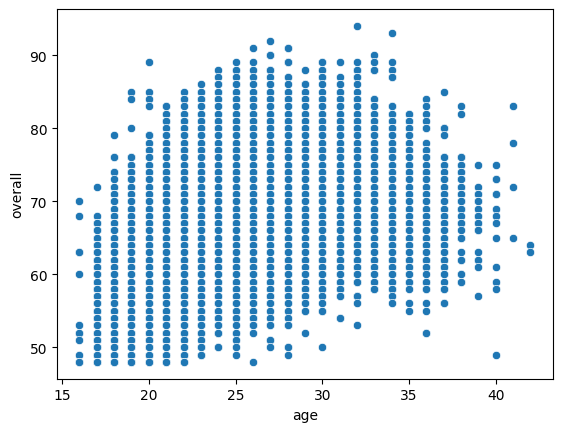

In [ ]:
sns.scatterplot(data=df,x='age',y='overall')

#### Impact of height to weight

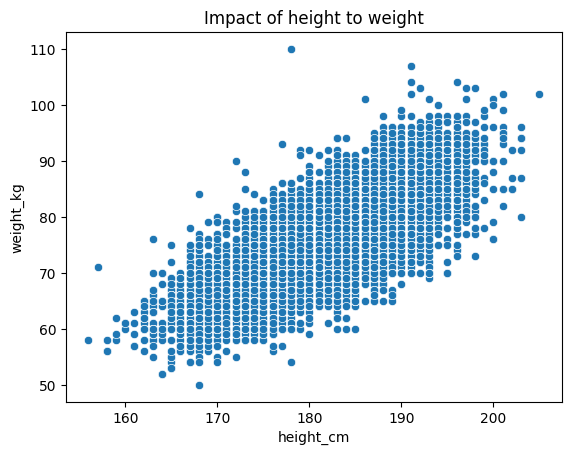

In [ ]:
sns.scatterplot(data=df,x='height_cm',y='weight_kg')
plt.title('Impact of height to weight')

plt.show()

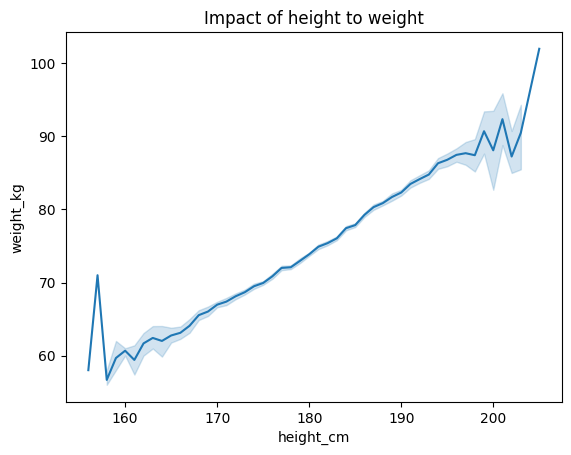

In [ ]:
sns.lineplot(data=df,x='height_cm',y='weight_kg')
plt.title('Impact of height to weight')
plt.show()

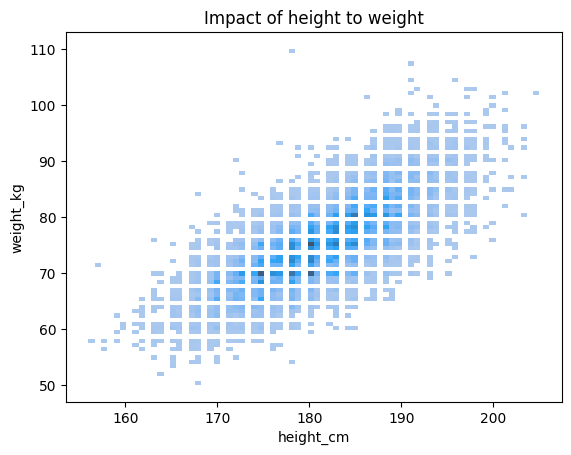

In [ ]:
sns.histplot(data=df,x='height_cm',y='weight_kg')
plt.title('Impact of height to weight')
plt.show()

observation
- when height increases, weight also increases
- Most of the players wieght is between 70 to 80 when the height is 175 to 188

#### Impact of age to value_eur

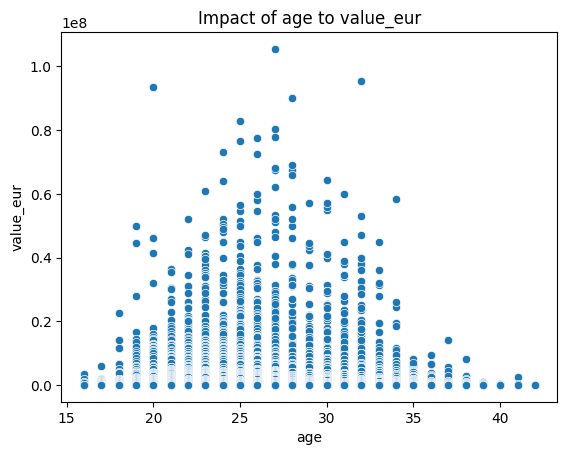

In [ ]:
sns.scatterplot(data=df,x='age',y='value_eur')
plt.title('Impact of age to value_eur')
plt.show()

In [ ]:
corr=df['age'].corr(df['value_eur'])
corr

0.08151289053240601

Observation
- Age from 24 to 30 players ar paid higher, player above 35 and below 20 are paid less
- There is correlation between age and value

#### relation between overall and potential with respect to preferred foot

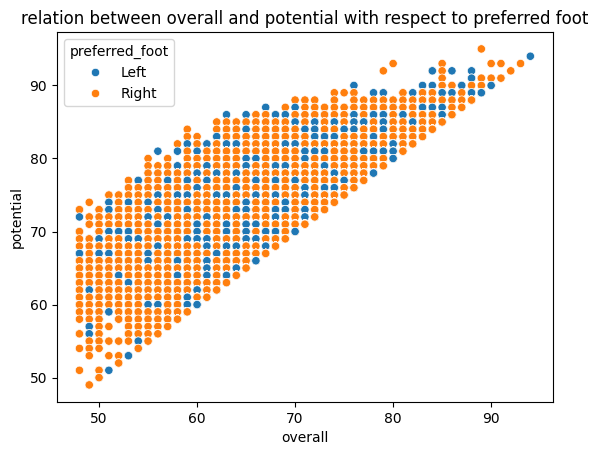

In [ ]:
sns.scatterplot(data=df,x='overall',y='potential',hue='preferred_foot')
plt.title('relation between overall and potential with respect to preferred foot')
plt.show()

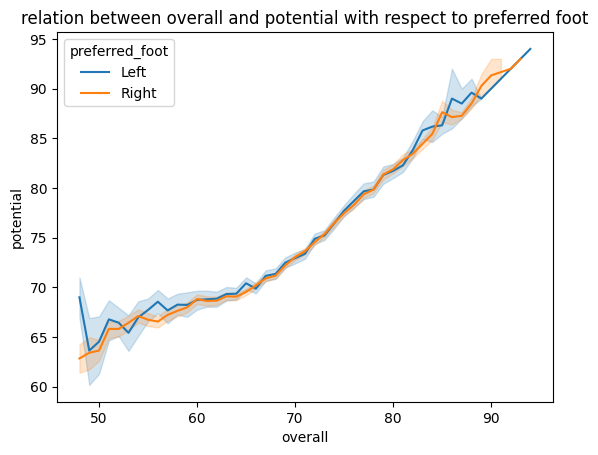

In [ ]:
sns.lineplot(data=df,x='overall',y='potential',hue='preferred_foot')
plt.title('relation between overall and potential with respect to preferred foot')

plt.show()

observation
- when overall is increasing potential also increasing with both foot

In [ ]:
df.head()

#### relation between overall and preferred_foot

In [ ]:
df[df['preferred_foot']=='Right']['overall'].plot(kind='kde',label='right')
df[df['preferred_foot']=='Left']['overall'].plot(kind='kde',label='left')
plt.legend()

observation
- Moreover both right and left players have same overall performance

#### Relation between value_eur and international reputation

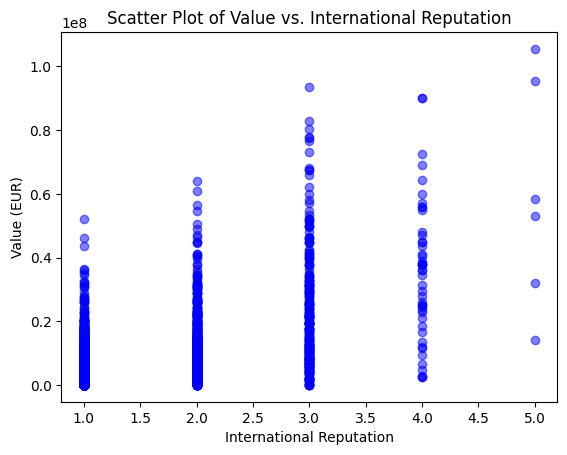

In [ ]:
plt.scatter(df['international_reputation'], df['value_eur'], alpha=0.5, color='blue')
plt.xlabel('International Reputation')
plt.ylabel('Value (EUR)')
plt.title('Scatter Plot of Value vs. International Reputation')
plt.show()


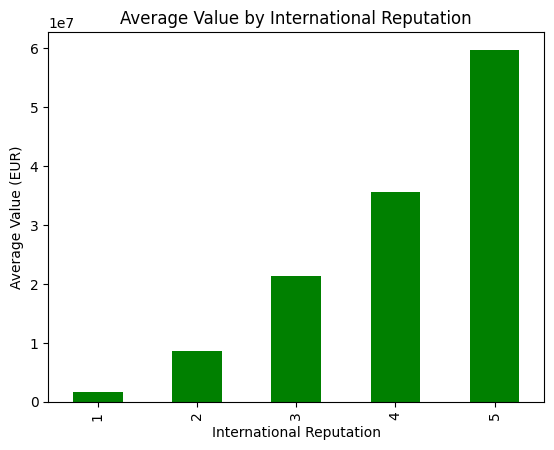

In [ ]:

avg_value = df.groupby('international_reputation')['value_eur'].mean()

avg_value.plot(kind='bar', color='green')
plt.xlabel('International Reputation')
plt.ylabel('Average Value (EUR)')
plt.title('Average Value by International Reputation')
plt.show()


In [ ]:
avg_value

,value_eur
international_reputation,
1,1.631396e+06
2,8.571044e+06
3,2.137428e+07
4,3.553913e+07
5,5.975000e+07


#### observation
- international repuation 5 are higly paid

In [ ]:
df.head()

,sofifa_id,player_url,short_name,long_name,age,dob,height_cm,weight_kg,nationality,club,...,lwb,ldm,cdm,rdm,rwb,lb,lcb,cb,rcb,rb
0,158023,https://sofifa.com/player/158023/lionel-messi/...,L. Messi,Lionel Andrés Messi Cuccittini,32,1987-06-24,170,72,Argentina,FC Barcelona,...,68,66,66,66,68,63,52,52,52,63
1,20801,https://sofifa.com/player/20801/c-ronaldo-dos-...,Cristiano Ronaldo,Cristiano Ronaldo dos Santos Aveiro,34,1985-02-05,187,83,Portugal,Juventus,...,65,61,61,61,65,61,53,53,53,61
2,190871,https://sofifa.com/player/190871/neymar-da-sil...,Neymar Jr,Neymar da Silva Santos Junior,27,1992-02-05,175,68,Brazil,Paris Saint-Germain,...,66,61,61,61,66,61,46,46,46,61
3,200389,https://sofifa.com/player/200389/jan-oblak/20/...,J. Oblak,Jan Oblak,26,1993-01-07,188,87,Slovenia,Atlético Madrid,...,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>
4,183277,https://sofifa.com/player/183277/eden-hazard/2...,E. Hazard,Eden Hazard,28,1991-01-07,175,74,Belgium,Real Madrid,...,66,63,63,63,66,61,49,49,49,61


In [ ]:
df['team_position'].value_counts()

,count
team_position,
SUB,7820
RES,2958
GK,662
RCB,660
LCB,660
RB,560
LB,560
ST,458
RCM,411


#### Relation with passing to dribbling with respect to preferred foot

Text(0.5, 1.0, 'Relation with passing to dribbling with respect to preferred foot')

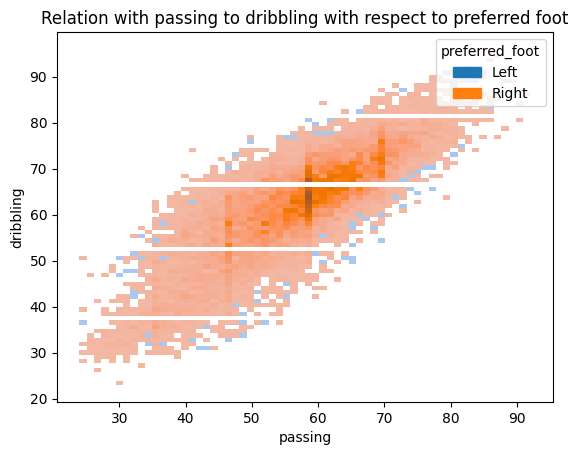

In [ ]:
sns.histplot(data=df,x='passing',y='dribbling',hue='preferred_foot')
plt.title('Relation with passing to dribbling with respect to preferred foot')

Text(0.5, 1.0, 'Relation with passing to dribbling with respect to preferred foot')

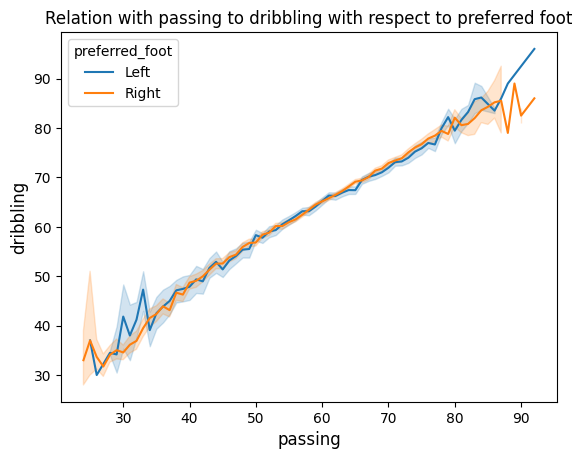

In [ ]:
sns.lineplot(data=df,x='passing',y='dribbling',hue='preferred_foot')
plt.xlabel('passing',size='12')
plt.ylabel('dribbling',size='12')
plt.title('Relation with passing to dribbling with respect to preferred foot')

Observation:
- when passing skills increases dribbling skills also increases with both foot

In [ ]:
df.head()

#### Relation between weak foot foot and work_rate

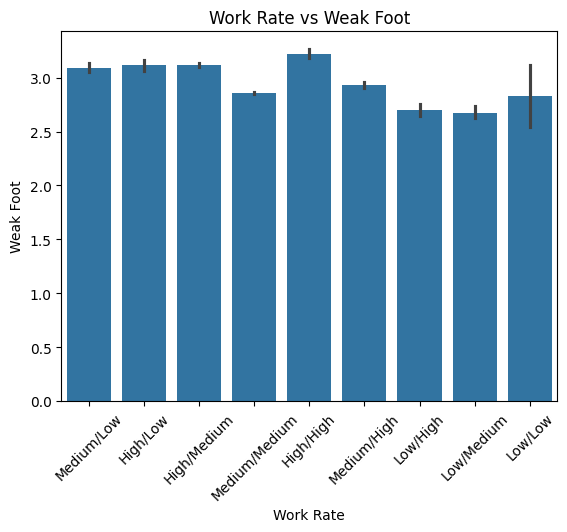

In [ ]:
sns.barplot(data=df,x='work_rate',y='weak_foot')
plt.xticks(rotation=45)
plt.xlabel('Work Rate')
plt.ylabel('Weak Foot')
plt.title('Work Rate vs Weak Foot')
plt.show()


In [ ]:
pd.crosstab(df['work_rate'],df['weak_foot'],normalize='columns')*100

weak_foot,1,2,3,4,5
work_rate,,,,,
High/High,0.000000,2.897801,5.076232,9.939985,13.469388
High/Low,1.935484,2.742561,3.489909,6.264066,4.897959
High/Medium,2.580645,11.824062,17.317353,27.531883,22.857143
Low/High,0.000000,3.906856,2.132722,0.787697,1.224490
Low/Low,1.290323,0.232859,0.158632,0.187547,0.408163
Low/Medium,1.290323,4.553687,2.264916,0.787697,2.040816
Medium/High,1.290323,9.081501,10.055521,7.764441,6.938776
Medium/Low,1.935484,3.725744,4.617961,7.389347,7.346939
Medium/Medium,89.677419,61.034929,54.886754,39.347337,40.816327


observation
- players who has weak_foot 1 have best medium/medium workrate

#### Impact of defending to dribbling

Text(0.5, 1.0, 'Impact of defending to dribbling')

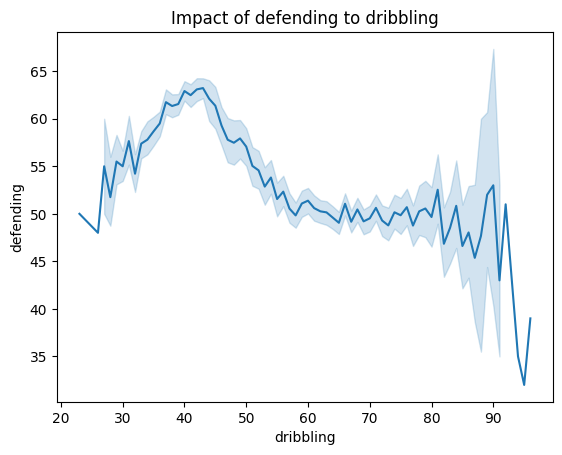

In [ ]:
sns.lineplot(data=df,x='dribbling',y='defending')
plt.xlabel('dribbling')
plt.ylabel('defending')
plt.title('Impact of defending to dribbling')

Observation
- when dribbling scores increases , defending scores decreses
- Reason --->dribbling scores  for attackers,midfields and right and left wing players have high because they usually dribbles ball more to pass ball to other player to put agoal  while center-backs or full-backs, focus more on defending, leading to a higher defending scores

#### Impact of age to movement_sprint_speed

Text(0.5, 1.0, 'Impact of age to movement_sprint_speed')

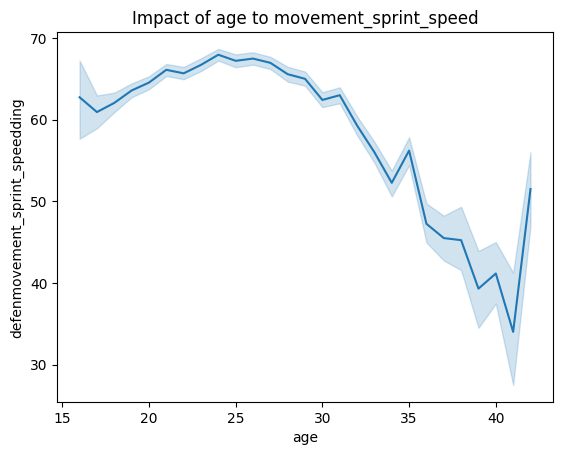

In [ ]:
sns.lineplot(data=df,x='age',y='movement_sprint_speed')
plt.xlabel('age')
plt.ylabel('defenmovement_sprint_speedding')
plt.title('Impact of age to movement_sprint_speed')

Observation:
- when player age increases, sprint speed decreases

In [ ]:
df.head()

#### Relation between team posiiton and value_eur

Text(0.5, 1.0, 'Relation between team posiiton and value_eur')

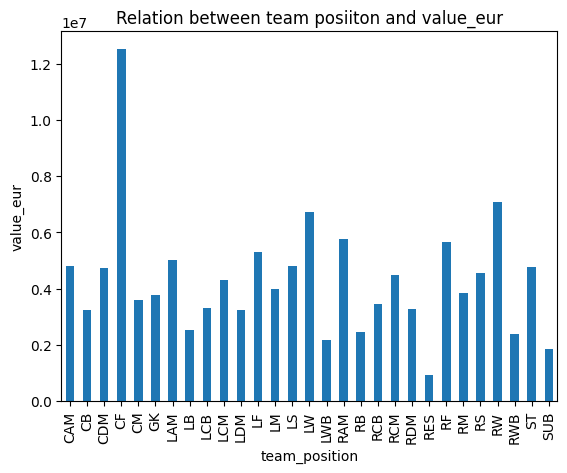

In [ ]:
df.groupby(df['team_position'])['value_eur'].mean().plot(kind='bar')
plt.xlabel('team_position')
plt.ylabel('value_eur')
plt.title('Relation between team posiiton and value_eur')

observation:
- player position CF are highly paid
- least paid position is RES

In [ ]:
df.head()

## Some Intresting questions

### 1. rank ordered list of top 10 countries with most players. Which countries are producing the most footballers that play at this level?

In [ ]:
top_10=df['nationality'].value_counts().head(10)
top_10

,count
nationality,
England,1667
Germany,1216
Spain,1035
France,984
Argentina,886
Brazil,824
Italy,732
Colombia,591
Japan,453


Text(0.5, 1.0, 'top 10 countries with most players')

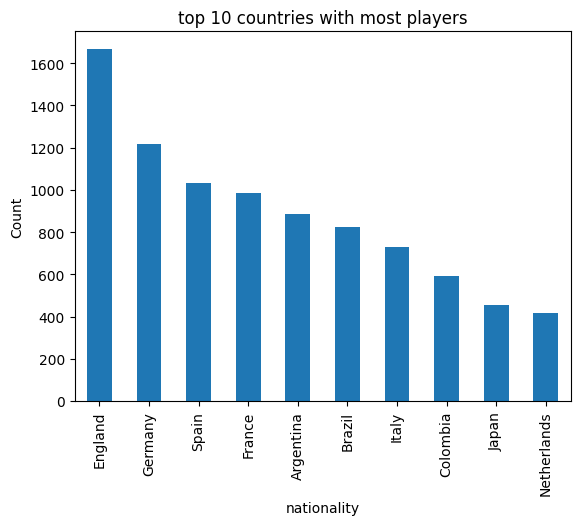

In [ ]:
top_10.plot(kind='bar')
plt.xlabel('nationality')
plt.ylabel('Count')
plt.title('top 10 countries with most players')

Observation:
- England is producing most football players compared to other countries

#### 2.The distribution of overall rating vs. age of players.

In [ ]:
df.head()

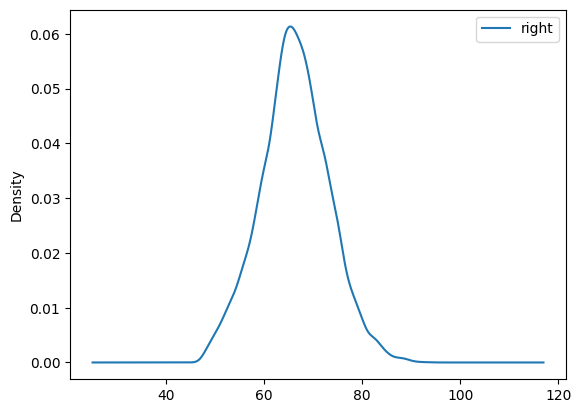

In [ ]:
df['overall'].plot(kind='kde',label='right')
#df['age'].plot(kind='kde',label='left')
plt.legend()

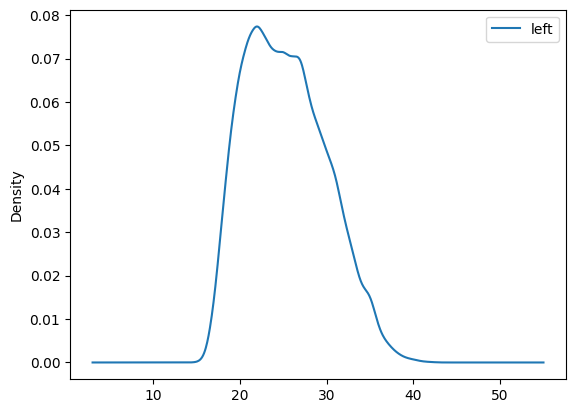

In [ ]:
df['age'].plot(kind='kde',label='left')
plt.legend()

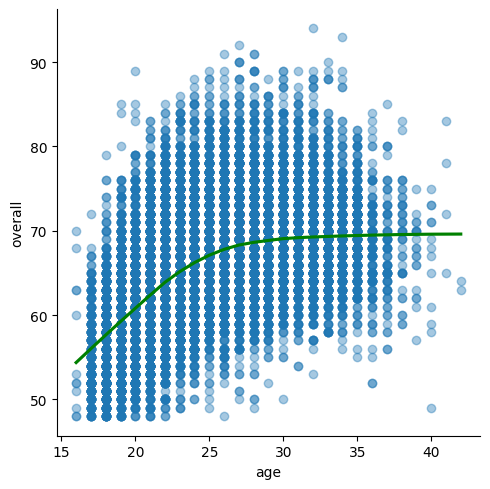

In [ ]:

sns.lmplot(data=df, x='age', y='overall', lowess=True, scatter_kws={'alpha':0.4}, line_kws={'color': 'green'})


Observation
- We found that after 28 age overall rating stops improving

#### 3. Which type of offensive players tends to get paid the most: the striker, the right-winger, or the left-winger?

In [ ]:
df.head(3)

,sofifa_id,player_url,short_name,long_name,age,dob,height_cm,weight_kg,nationality,club,...,lwb,ldm,cdm,rdm,rwb,lb,lcb,cb,rcb,rb
0,158023,https://sofifa.com/player/158023/lionel-messi/...,L. Messi,Lionel Andrés Messi Cuccittini,32,1987-06-24,170,72,Argentina,FC Barcelona,...,68,66,66,66,68,63,52,52,52,63
1,20801,https://sofifa.com/player/20801/c-ronaldo-dos-...,Cristiano Ronaldo,Cristiano Ronaldo dos Santos Aveiro,34,1985-02-05,187,83,Portugal,Juventus,...,65,61,61,61,65,61,53,53,53,61
2,190871,https://sofifa.com/player/190871/neymar-da-sil...,Neymar Jr,Neymar da Silva Santos Junior,27,1992-02-05,175,68,Brazil,Paris Saint-Germain,...,66,61,61,61,66,61,46,46,46,61


In [ ]:
df['team_position'].value_counts()

,count
team_position,
SUB,7820
RES,2958
GK,662
RCB,660
LCB,660
RB,560
LB,560
ST,458
RCM,411


<Axes: xlabel='team_position'>

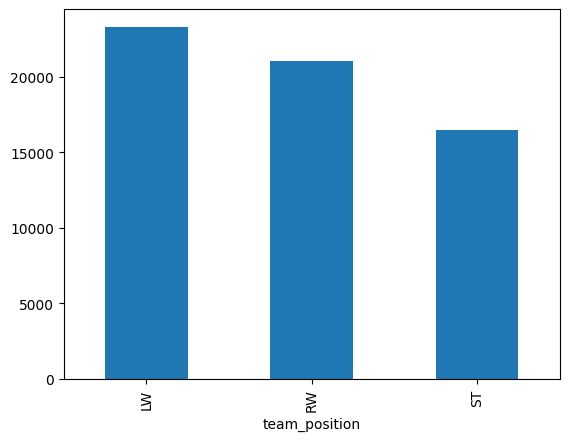

In [ ]:
pos_3=df.loc[df['team_position'].isin(['ST', 'LW', 'RW'])]
df.groupby(pos_3['team_position'])['wage_eur'].mean().plot(kind='bar')

observation
1. In our analysis we found Left wing tends to get paid more than Right wing and Striker
2. But usually striker are paid most when compared to Left wing
- There could be star players or high-profile players playing as Left-wingers who command higher wages due to their marketability, performance, and reputation.

In [ ]:
top_percent=5
total=len(df)

In [ ]:
top_5=round(total*0.05)

In [ ]:
top_5

914

In [ ]:
attributes=['shooting','passing','dribbling']

In [ ]:
top_5_shooting=df.sort_values(by='shooting',ascending=False).head(top_5)

In [ ]:
df.head()

,sofifa_id,player_url,short_name,long_name,age,dob,height_cm,weight_kg,nationality,club,...,lwb,ldm,cdm,rdm,rwb,lb,lcb,cb,rcb,rb
0,158023,https://sofifa.com/player/158023/lionel-messi/...,L. Messi,Lionel Andrés Messi Cuccittini,32,1987-06-24,170,72,Argentina,FC Barcelona,...,68,66,66,66,68,63,52,52,52,63
1,20801,https://sofifa.com/player/20801/c-ronaldo-dos-...,Cristiano Ronaldo,Cristiano Ronaldo dos Santos Aveiro,34,1985-02-05,187,83,Portugal,Juventus,...,65,61,61,61,65,61,53,53,53,61
2,190871,https://sofifa.com/player/190871/neymar-da-sil...,Neymar Jr,Neymar da Silva Santos Junior,27,1992-02-05,175,68,Brazil,Paris Saint-Germain,...,66,61,61,61,66,61,46,46,46,61
3,200389,https://sofifa.com/player/200389/jan-oblak/20/...,J. Oblak,Jan Oblak,26,1993-01-07,188,87,Slovenia,Atlético Madrid,...,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>
4,183277,https://sofifa.com/player/183277/eden-hazard/2...,E. Hazard,Eden Hazard,28,1991-01-07,175,74,Belgium,Real Madrid,...,66,63,63,63,66,61,49,49,49,61


#### 4.Top_5 players attributes

In [ ]:
top_5_percent_threshold = df['shooting'].quantile(0.95)
top_5_players = df[df['shooting'] >= top_5_percent_threshold]

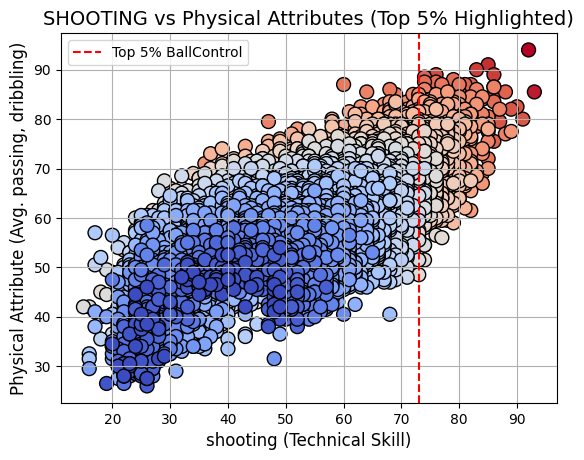

In [ ]:
plt.scatter(df['shooting'], df['Physical'], c=df['overall'], cmap='coolwarm', s=100, edgecolors='k')
plt.axvline(x=top_5_percent_threshold, color='red', linestyle='--', label='Top 5% BallControl')
plt.title("SHOOTING vs Physical Attributes (Top 5% Highlighted)", fontsize=14)
plt.xlabel('shooting (Technical Skill)', fontsize=12)
plt.ylabel('Physical Attribute (Avg. passing, dribbling)', fontsize=12)
plt.grid(True)
plt.legend()

In [ ]:
print(top_5_players[['short_name', 'shooting', 'passing', 'dribbling','team_position']].head())

          short_name  shooting  passing  dribbling team_position
0           L. Messi      92.0     92.0       96.0            RW
1  Cristiano Ronaldo      93.0     82.0       89.0            LW
2          Neymar Jr      85.0     87.0       95.0           CAM
4          E. Hazard      83.0     86.0       94.0            LW
5       K. De Bruyne      86.0     92.0       86.0           RCM


Observation
- Top 5 players who has good shooting rate are tends to have good dribbling and passing rate.

#### 5.Who is best player ronaldo vs messi

In [ ]:
attributes=['short_name','shooting', 'passing', 'dribbling','attacking_crossing','attacking_finishing','attacking_heading_accuracy','attacking_short_passing','attacking_volleys','skill_dribbling','skill_curve','skill_fk_accuracy','skill_long_passing','skill_ball_control','movement_acceleration']
best_df=df[attributes]

In [ ]:
ronaldo=best_df[best_df['short_name']=='Cristiano Ronaldo']
messi=best_df[best_df['short_name']=='L. Messi']

In [ ]:
point_ronaldo=0
point_messi=0
for i in range(1,15):
    if ronaldo.iloc[0,i]>messi.iloc[0,i]:
        point_ronaldo=point_ronaldo+1
    else:
        point_messi=point_messi+1

In [ ]:
print(f'ronaldo point is {point_ronaldo}')
print(f'messi point is {point_messi}')

ronaldo point is 2
messi point is 12


In [ ]:
comparison_df = pd.concat([ronaldo, messi], ignore_index=True)


In [ ]:
comparison_df

,short_name,shooting,passing,dribbling,attacking_crossing,attacking_finishing,attacking_heading_accuracy,attacking_short_passing,attacking_volleys,skill_dribbling,skill_curve,skill_fk_accuracy,skill_long_passing,skill_ball_control,movement_acceleration
0,Cristiano Ronaldo,93.0,82.0,89.0,84,94,89,83,87,89,81,76,77,92,89
1,L. Messi,92.0,92.0,96.0,88,95,70,92,88,97,93,94,92,96,91


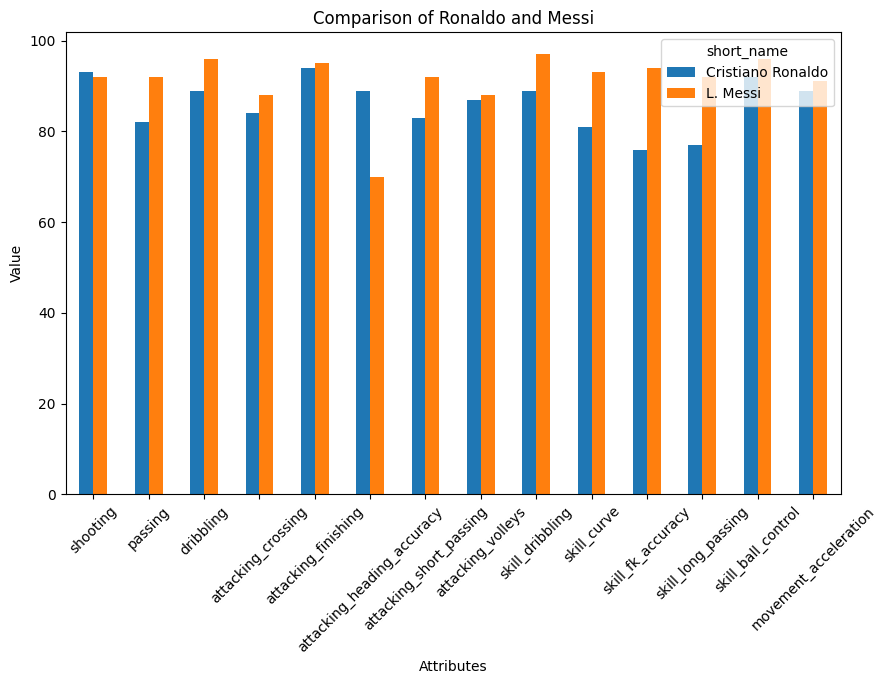

In [ ]:
import matplotlib.pyplot as plt

comparison_df.set_index('short_name', inplace=True)

comparison_df.T.plot(kind='bar', figsize=(10,6)) ## we are performing transpose on th data
plt.title('Comparison of Ronaldo and Messi')
plt.ylabel('Value')
plt.xlabel('Attributes')
plt.xticks(rotation=45)
plt.show()



Observation:
- Messi outperforms ronaldo in 12 skill attributes
- we conclude that messi is best player compared to ronaldo

In [ ]:
comparison_df.T

short_name,Cristiano Ronaldo,L. Messi
shooting,93.0,92.0
passing,82.0,92.0
dribbling,89.0,96.0
attacking_crossing,84.0,88.0
attacking_finishing,94.0,95.0
attacking_heading_accuracy,89.0,70.0
attacking_short_passing,83.0,92.0
attacking_volleys,87.0,88.0
skill_dribbling,89.0,97.0
skill_curve,81.0,93.0


#### 5. Who is top 5 players with overall rarting

In [ ]:
top_5=df.sort_values(by='overall',ascending=False).head(5)

In [ ]:
top_5[['short_name','overall','team_position']]

,short_name,overall,team_position
0,L. Messi,94,RW
1,Cristiano Ronaldo,93,LW
2,Neymar Jr,92,CAM
3,J. Oblak,91,GK
4,E. Hazard,91,LW


Observation:
- Messi	, Cristiano Ronaldo,Neymar Jr, J.Oblak, E. Hazard are top 5 players

#### 6. Who are top 5 highly paid players

In [ ]:
top_5_paid=df.sort_values(by='value_eur',ascending=False,ignore_index=True).head(5)

In [ ]:
top_5[['short_name','value_eur','team_position']]

,short_name,value_eur,team_position
0,L. Messi,95500000,RW
1,Cristiano Ronaldo,58500000,LW
2,Neymar Jr,105500000,CAM
3,J. Oblak,77500000,GK
4,E. Hazard,90000000,LW


Observation:
- Messi	,Neymar Jr, K. Mbappé, K.De Bruyne,E. Hazard are top 5 players

#### 8.Top 5 clubs have the high overall performance rating

<Axes: xlabel='club'>

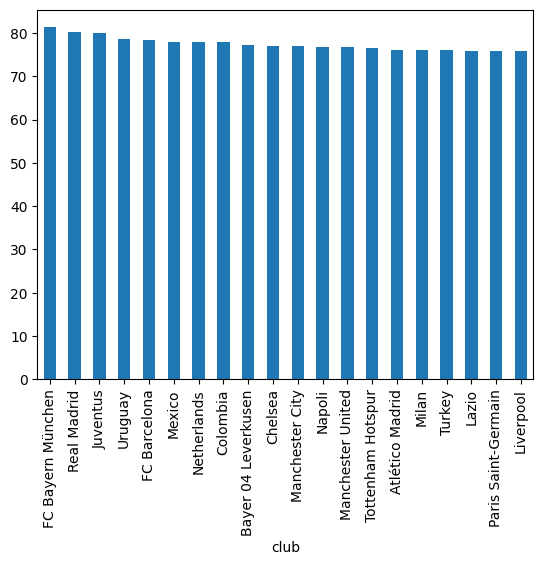

In [ ]:
df.groupby('club')['overall'].mean().sort_values(ascending=False).head(20).plot(kind='bar')


In [ ]:
df.groupby('club')['overall'].mean().sort_values(ascending=False).head(5)

,overall
club,
FC Bayern München,81.304348
Real Madrid,80.121212
Juventus,80.060606
Uruguay,78.608696
FC Barcelona,78.363636


Observation:
- FC Bayern München,Real Madrid,Juventus,Uruguay,FC Barcelona are 5 top clubs with high overall rating

In [ ]:
pd.set_option('display.max_rows', None)


#### 9.How does market value correlate with players' age? Are younger players generally more valuable?

Text(0.5, 1.0, 'Age vs Value')

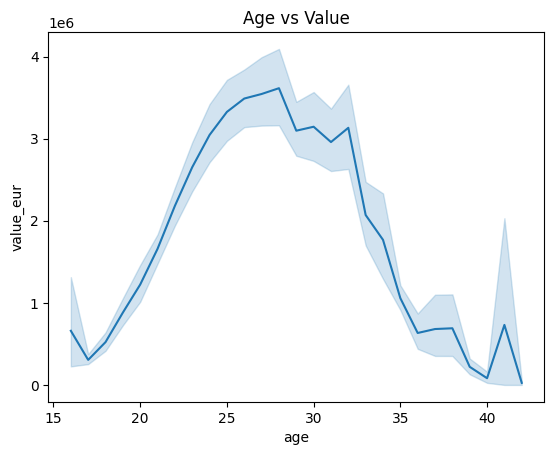

In [ ]:
sns.lineplot(x='age',y='value_eur',data=df)
plt.xlabel('age')
plt.ylabel('value_eur')
plt.title('Age vs Value')

Observation
- we can conclude that young people are tend to get more marekt value

#### 10. Choosing top 100 players and find which club has major players

In [ ]:
top_100=df.sort_values(by='overall',ascending=False).head(100)

Text(0.5, 1.0, 'Club Wise in Top 100 Players list ')

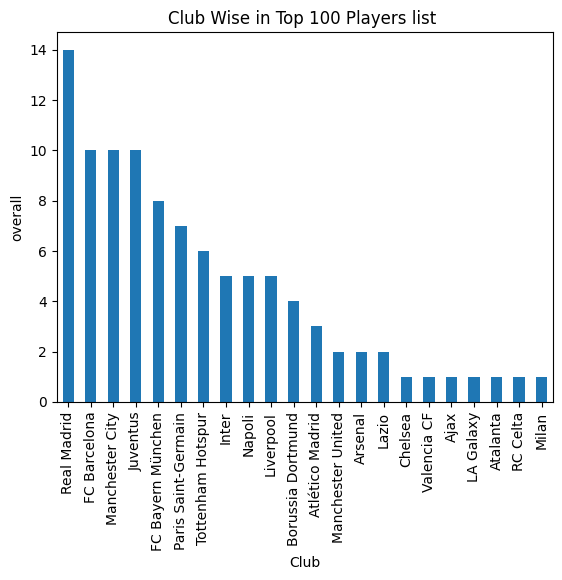

In [ ]:
top_100['club'].value_counts().plot(kind='bar')
plt.xlabel('Club')
plt.ylabel('overall')
plt.title('Club Wise in Top 100 Players list ')

Observation:
- Most of the players are from Real Madrid(14)

#### 11. who is star player in Real Madrid

In [ ]:
sorted_real=df[df['club']=='Real Madrid'].sort_values(by='overall',ascending=False).head(10)

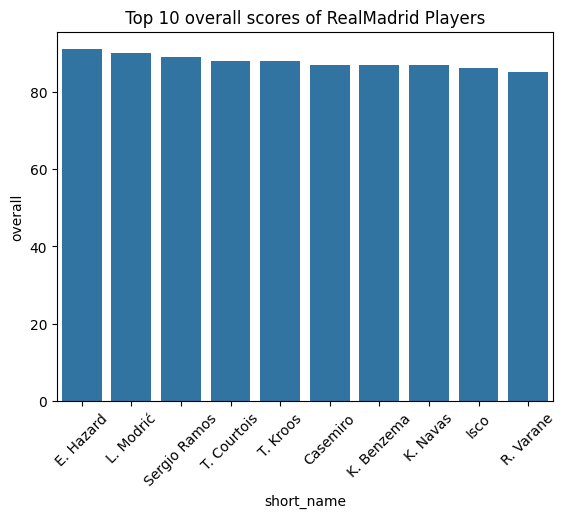

In [ ]:
sns.barplot(x=sorted_real['short_name'],y=df['overall'])
plt.xlabel('short_name')
plt.ylabel('overall')
plt.title(' Top 10 overall scores of RealMadrid Players ')
plt.xticks(rotation=45)
plt.show()

observation:
- Hazard is the star player in real madrid

#### 12.Distibution of release clause vs Overall

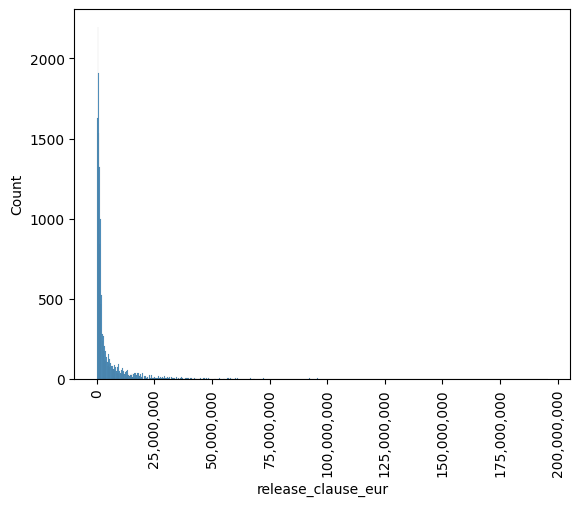

In [ ]:
import matplotlib.ticker as mtick

sns.histplot(x=df['release_clause_eur'])
plt.gca().xaxis.set_major_formatter(mtick.StrMethodFormatter('{x:,.0f}'))
plt.xticks(rotation=90)
plt.show()


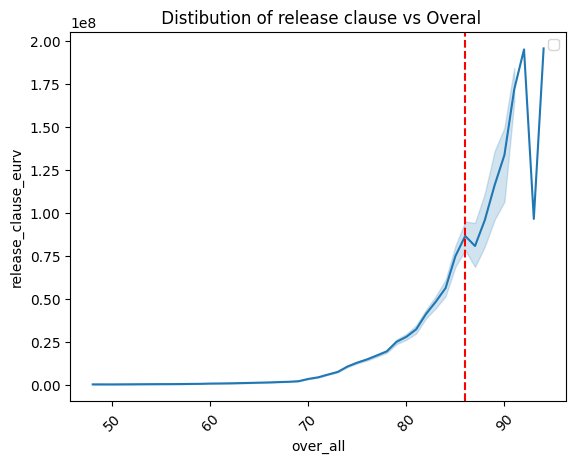

In [ ]:
mod_df=df[df['release_clause_eur']>25000000]
sns.lineplot(x=df['overall'],y=df['release_clause_eur'])
plt.axvline(x=86, color='red', linestyle='--')
plt.xlabel('over_all')
plt.ylabel('release_clause_eurv')
plt.title(' Distibution of release clause vs Overal')
plt.xticks(rotation=45)
plt.legend()

observation:
- players who have overall rating greather than 86 tends to have high release clause

In [ ]:
df.head(1)

,sofifa_id,player_url,short_name,long_name,age,dob,height_cm,weight_kg,nationality,club,overall,potential,value_eur,wage_eur,player_positions,preferred_foot,international_reputation,weak_foot,skill_moves,work_rate,body_type,real_face,release_clause_eur,player_tags,team_position,team_jersey_number,loaned_from,joined,contract_valid_until,nation_position,nation_jersey_number,pace,shooting,passing,dribbling,defending,physic,gk_diving,gk_handling,gk_kicking,gk_reflexes,gk_speed,gk_positioning,player_traits,attacking_crossing,attacking_finishing,attacking_heading_accuracy,attacking_short_passing,attacking_volleys,skill_dribbling,skill_curve,skill_fk_accuracy,skill_long_passing,skill_ball_control,movement_acceleration,movement_sprint_speed,movement_agility,movement_reactions,movement_balance,power_shot_power,power_jumping,power_stamina,power_strength,power_long_shots,mentality_aggression,mentality_interceptions,mentality_positioning,mentality_vision,mentality_penalties,mentality_composure,defending_marking,defending_standing_tackle,defending_sliding_tackle,goalkeeping_diving,goalkeeping_handling,goalkeeping_kicking,goalkeeping_positioning,goalkeeping_reflexes,ls,st,rs,lw,lf,cf,rf,rw,lam,cam,ram,lm,lcm,cm,rcm,rm,lwb,ldm,cdm,rdm,rwb,lb,lcb,cb,rcb,rb
0,158023,https://sofifa.com/player/158023/lionel-messi/...,L. Messi,Lionel Andrés Messi Cuccittini,32,1987-06-24,170,72,Argentina,FC Barcelona,94,94,95500000,565000,"RW, CF, ST",Left,5,4,4,Medium/Low,Messi,Yes,195800000.0,"Dribbler, Distance Shooter, Crosser, FK Specia...",RW,10.0,NaN,2004-07-01,2021.0,NaN,NaN,87.0,92.0,92.0,96.0,39.0,66.0,NaN,NaN,NaN,NaN,NaN,NaN,"Beat Offside Trap, Argues with Officials, Earl...",88,95,70,92,88,97,93,94,92,96,91,84,93,95,95,86,68,75,68,94,48,40,94,94,75,96,33,37,26,6,11,15,14,8,89,89,89,93,93,93,93,93,93,93,93,92,87,87,87,92,68,66,66,66,68,63,52,52,52,63


In [ ]:
df['passing'].max()

92.0

## 5. Data Preprocessing

### Dropping unwanted or irrelevant columns
- columns are sofifa_id	,player_url,long_name,dob,nationality,club,body_type,real_face,team_jersey_number,loaned_from,joined,contract_valid_until,nation_jersey_number

In [ ]:
drop_columns=[ 'sofifa_id','player_url','long_name','dob','nationality','club','body_type','real_face','team_jersey_number','loaned_from','joined','contract_valid_until','nation_jersey_number']

In [ ]:
df.drop(drop_columns,axis=1,inplace=True)

In [ ]:
df.head(1)

,short_name,age,height_cm,weight_kg,overall,potential,value_eur,wage_eur,player_positions,preferred_foot,...,ldm,cdm,rdm,rwb,lb,lcb,cb,rcb,rb,Physical
0,L. Messi,32,170,72,94,94,95500000,565000,"RW, CF, ST",Left,...,66,66,66,68,63,52,52,52,63,94.0


#### 5.1 Missing Value Imputation

### Numerical

In [ ]:
for i in df.columns:
    print(f'column {i} has',df[i].isna().sum(),'Missing values')

column short_name has 0 Missing values
column age has 0 Missing values
column height_cm has 0 Missing values
column weight_kg has 0 Missing values
column overall has 0 Missing values
column potential has 0 Missing values
column value_eur has 0 Missing values
column wage_eur has 0 Missing values
column player_positions has 0 Missing values
column preferred_foot has 0 Missing values
column international_reputation has 0 Missing values
column weak_foot has 0 Missing values
column skill_moves has 0 Missing values
column work_rate has 0 Missing values
column release_clause_eur has 1298 Missing values
column player_tags has 16779 Missing values
column team_position has 240 Missing values
column nation_position has 17152 Missing values
column pace has 2036 Missing values
column shooting has 2036 Missing values
column passing has 2036 Missing values
column dribbling has 2036 Missing values
column defending has 2036 Missing values
column physic has 2036 Missing values
column gk_diving has 16242

In [ ]:
missing_column=[i for i in df.columns if df[i].isna().sum()>1]

In [ ]:
missing_column

['release_clause_eur',
 'player_tags',
 'team_position',
 'nation_position',
 'pace',
 'shooting',
 'passing',
 'dribbling',
 'defending',
 'physic',
 'gk_diving',
 'gk_handling',
 'gk_kicking',
 'gk_reflexes',
 'gk_speed',
 'gk_positioning',
 'player_traits',
 'ls',
 'st',
 'rs',
 'lw',
 'lf',
 'cf',
 'rf',
 'rw',
 'lam',
 'cam',
 'ram',
 'lm',
 'lcm',
 'cm',
 'rcm',
 'rm',
 'lwb',
 'ldm',
 'cdm',
 'rdm',
 'rwb',
 'lb',
 'lcb',
 'cb',
 'rcb',
 'rb']

In [ ]:
for i in missing_column:
    print(f'column {i} has',df[i].isna().sum(),'Missing values')

column release_clause_eur has 1298 Missing values
column player_tags has 16779 Missing values
column team_position has 240 Missing values
column nation_position has 17152 Missing values
column pace has 2036 Missing values
column shooting has 2036 Missing values
column passing has 2036 Missing values
column dribbling has 2036 Missing values
column defending has 2036 Missing values
column physic has 2036 Missing values
column gk_diving has 16242 Missing values
column gk_handling has 16242 Missing values
column gk_kicking has 16242 Missing values
column gk_reflexes has 16242 Missing values
column gk_speed has 16242 Missing values
column gk_positioning has 16242 Missing values
column player_traits has 10712 Missing values
column ls has 2036 Missing values
column st has 2036 Missing values
column rs has 2036 Missing values
column lw has 2036 Missing values
column lf has 2036 Missing values
column cf has 2036 Missing values
column rf has 2036 Missing values
column rw has 2036 Missing values


In [ ]:
for i in missing_column:
    print(f'column {i} has',round(df[i].isna().sum()/len(df),2),'Missing values')

column release_clause_eur has 0.07 Missing values
column player_tags has 0.92 Missing values
column team_position has 0.01 Missing values
column nation_position has 0.94 Missing values
column pace has 0.11 Missing values
column shooting has 0.11 Missing values
column passing has 0.11 Missing values
column dribbling has 0.11 Missing values
column defending has 0.11 Missing values
column physic has 0.11 Missing values
column gk_diving has 0.89 Missing values
column gk_handling has 0.89 Missing values
column gk_kicking has 0.89 Missing values
column gk_reflexes has 0.89 Missing values
column gk_speed has 0.89 Missing values
column gk_positioning has 0.89 Missing values
column player_traits has 0.59 Missing values
column ls has 0.11 Missing values
column st has 0.11 Missing values
column rs has 0.11 Missing values
column lw has 0.11 Missing values
column lf has 0.11 Missing values
column cf has 0.11 Missing values
column rf has 0.11 Missing values
column rw has 0.11 Missing values
column l

In [ ]:
df['nation_position']

,nation_position
0,NaN
1,LS
2,LW
3,GK
4,LF
...,...
18273,NaN
18274,NaN
18275,NaN
18276,NaN


Observation
- we found 9 features have missing values between 50% to 90% so we drop the those features

In [ ]:
column_90=[ 'player_traits','gk_diving','gk_handling','gk_kicking','gk_reflexes','gk_speed','gk_positioning','player_tags','nation_position']

In [ ]:
df.drop(column_90,axis=1,inplace=True)

In [ ]:
pd.set_option('display.max_columns',None)

In [ ]:
missing_column=[i for i in df.columns if df[i].isna().sum()>1]

In [ ]:
missing_column

['release_clause_eur',
 'team_position',
 'pace',
 'shooting',
 'passing',
 'dribbling',
 'defending',
 'physic',
 'ls',
 'st',
 'rs',
 'lw',
 'lf',
 'cf',
 'rf',
 'rw',
 'lam',
 'cam',
 'ram',
 'lm',
 'lcm',
 'cm',
 'rcm',
 'rm',
 'lwb',
 'ldm',
 'cdm',
 'rdm',
 'rwb',
 'lb',
 'lcb',
 'cb',
 'rcb',
 'rb',
 'Physical']

We are creating plot to find the distibution of numerical columns

In [ ]:
num_columns_to_impute=['release_clause_eur','pace','shooting','passing','dribbling','defending','physic','ls','st','rslw','lf','cf','rf','rw','lam','cam','ram','lm','lcm','cm','rcm','rm','lwb', 'ldm','cdm','rdm','rwb', 'lb','lcb','cb','rcb', 'rb']

In [ ]:
num_columns_to_impute=['release_clause_eur','pace','shooting','passing','dribbling','defending','physic']

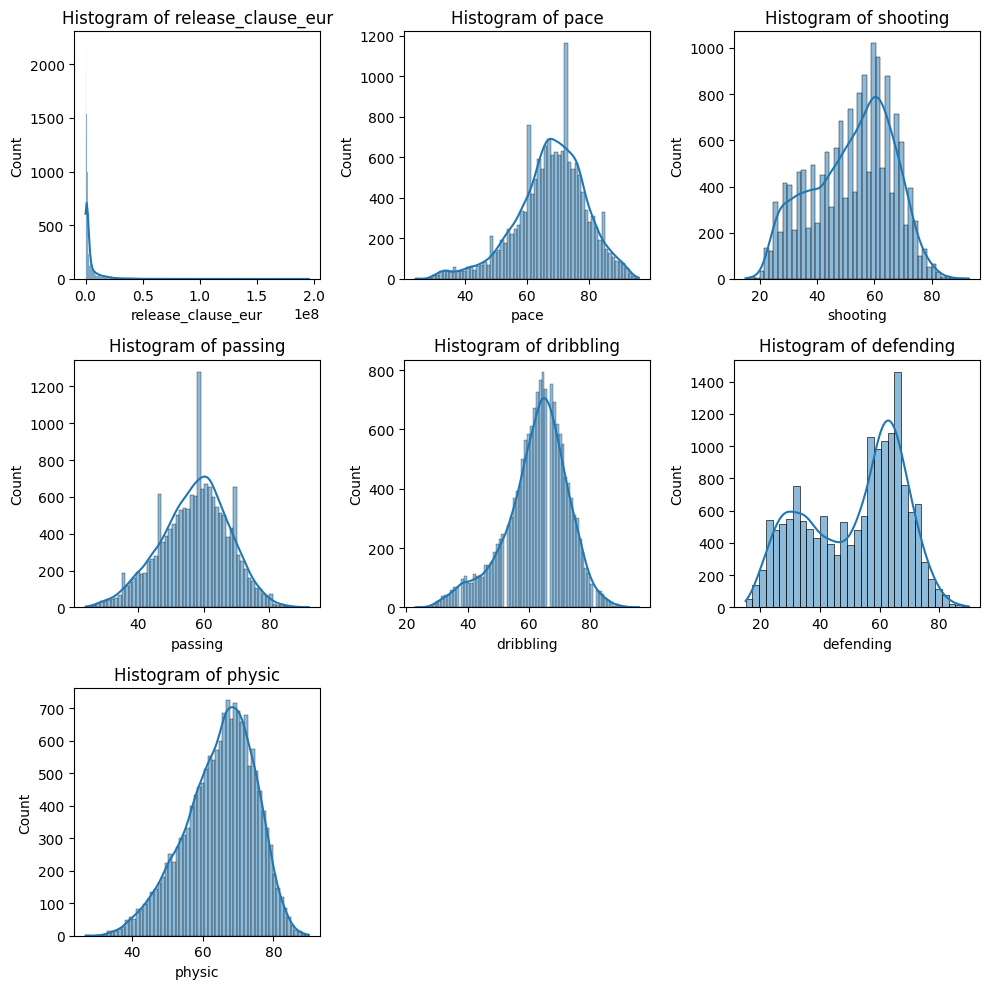

In [ ]:


plt.figure(figsize=(10, 10))

for i, col in enumerate(num_columns_to_impute, start=1):
    ax = plt.subplot(3, 3, i)
    sns.histplot(df[col], kde=True, ax=ax)
    ax.set_title(f'Histogram of {col}')
plt.tight_layout()
plt.show()


Observation
- none of features follows normal distribution

In [ ]:
for i in num_columns_to_impute:
        df[i].fillna(df[i].mean(),inplace=True)

we replaced missing values with mean

In [ ]:
pd.set_option('display.max_rows',None)


In [ ]:
df.isnull().sum()

,0
short_name,0
age,0
height_cm,0
weight_kg,0
overall,0
...,...
lcb,2036
cb,2036
rcb,2036
rb,2036


In [ ]:
columns_with_plus=[ 'ls','st','rs','lw','lf','cf','rf','rw','lam','cam','ram','lm','lcm','cm','rcm','rm','lwb','ldm','cdm','rdm','rwb','lb','lcb','cb','rcb','rb']
len(columns_with_plus)

26

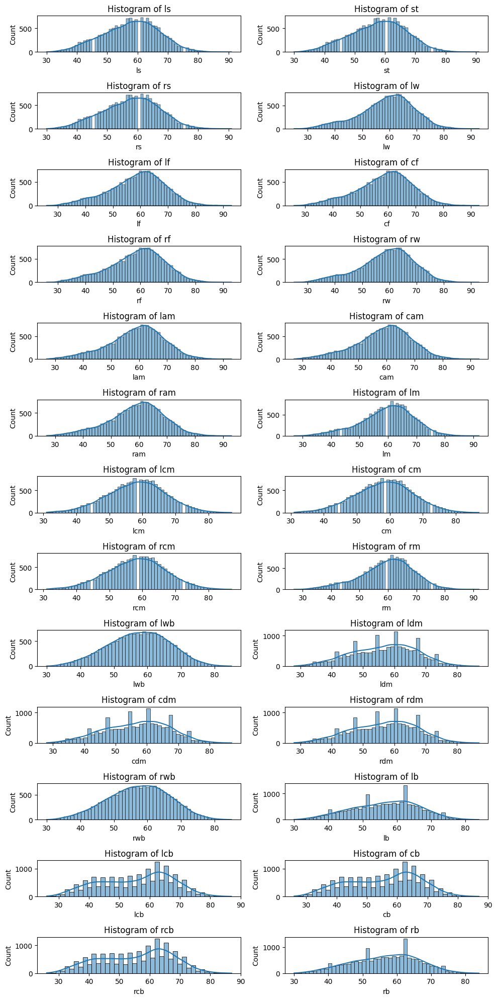

In [ ]:
plt.figure(figsize=(10,20))
for i,column in enumerate(columns_with_plus,start=1):
    ax1=plt.subplot(13,2,i)
    sns.histplot(df[column], kde=True, ax=ax1)
    ax1.set_title(f'Histogram of {column}')
plt.tight_layout()
plt.show()


In [ ]:
import pandas as pd


missing_count = df.isnull().sum(axis=1)

rows_with_many_missing = df[missing_count > 5]


In [ ]:
rows_with_many_missing.head()

,short_name,age,height_cm,weight_kg,overall,potential,value_eur,wage_eur,player_positions,preferred_foot,international_reputation,weak_foot,skill_moves,work_rate,release_clause_eur,player_tags,team_position,nation_position,pace,shooting,passing,dribbling,defending,physic,attacking_crossing,attacking_finishing,attacking_heading_accuracy,attacking_short_passing,attacking_volleys,skill_dribbling,skill_curve,skill_fk_accuracy,skill_long_passing,skill_ball_control,movement_acceleration,movement_sprint_speed,movement_agility,movement_reactions,movement_balance,power_shot_power,power_jumping,power_stamina,power_strength,power_long_shots,mentality_aggression,mentality_interceptions,mentality_positioning,mentality_vision,mentality_penalties,mentality_composure,defending_marking,defending_standing_tackle,defending_sliding_tackle,goalkeeping_diving,goalkeeping_handling,goalkeeping_kicking,goalkeeping_positioning,goalkeeping_reflexes,ls,st,rs,lw,lf,cf,rf,rw,lam,cam,ram,lm,lcm,cm,rcm,rm,lwb,ldm,cdm,rdm,rwb,lb,lcb,cb,rcb,rb
3,J. Oblak,26,188,87,91,93,77500000,125000,GK,Right,3,3,1,Medium/Medium,164700000.0,NaN,GK,GK,67.700899,52.298301,57.233777,62.531585,51.553503,64.876678,13,11,15,43,13,12,13,14,40,30,43,60,67,88,49,59,78,41,78,12,34,19,11,65,11,68,27,12,18,87,92,78,90,89,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>
6,M. ter Stegen,27,187,85,90,93,67500000,250000,GK,Right,3,4,1,Medium/Medium,143400000.0,NaN,GK,SUB,67.700899,52.298301,57.233777,62.531585,51.553503,64.876678,18,14,11,61,14,21,18,12,63,30,38,50,37,86,43,66,79,35,78,10,43,22,11,70,25,70,25,13,10,88,85,88,88,90,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>
13,Alisson,26,191,91,89,91,58000000,155000,GK,Right,3,3,1,Medium/Medium,111700000.0,NaN,GK,NaN,67.700899,52.298301,57.233777,62.531585,51.553503,64.876678,17,13,19,45,20,27,19,18,44,30,56,47,40,88,37,64,52,32,78,14,27,11,13,66,23,65,15,19,16,85,84,85,90,89,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>
14,De Gea,28,192,82,89,90,56000000,205000,GK,Right,4,3,1,Medium/Medium,110600000.0,NaN,GK,GK,67.700899,52.298301,57.233777,62.531585,51.553503,64.876678,17,13,21,50,13,18,21,19,47,38,57,58,63,87,43,61,67,43,60,12,38,30,12,65,29,68,25,21,13,90,84,81,85,92,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>
25,Ederson,25,188,86,88,91,54500000,185000,GK,Left,2,3,1,Medium/Medium,104900000.0,NaN,GK,NaN,67.700899,52.298301,57.233777,62.531585,51.553503,64.876678,20,14,14,56,18,23,15,20,58,40,64,63,60,87,48,70,66,41,68,18,38,27,20,70,17,70,29,15,8,86,82,93,86,88,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>


We use KNN imputer to impute the missing values

In [ ]:
from sklearn.impute import KNNImputer
imputer = KNNImputer(n_neighbors=13)

In [ ]:
imputed_data_plus=imputer.fit_transform(df[columns_with_plus])

In [ ]:
imputed_data_plus=pd.DataFrame(imputed_data_plus,columns=[f'imputed_{col}'for col in columns_with_plus])

In [ ]:
df=pd.concat([df,imputed_data_plus],axis=1)

In [ ]:
df.head()

,short_name,age,height_cm,weight_kg,overall,potential,value_eur,wage_eur,player_positions,preferred_foot,...,imputed_lwb,imputed_ldm,imputed_cdm,imputed_rdm,imputed_rwb,imputed_lb,imputed_lcb,imputed_cb,imputed_rcb,imputed_rb
0,L. Messi,32,170,72,94,94,95500000,565000,"RW, CF, ST",Left,...,68.000000,66.000000,66.000000,66.000000,68.000000,63.000000,52.00000,52.00000,52.00000,63.000000
1,Cristiano Ronaldo,34,187,83,93,93,58500000,405000,"ST, LW",Right,...,65.000000,61.000000,61.000000,61.000000,65.000000,61.000000,53.00000,53.00000,53.00000,61.000000
2,Neymar Jr,27,175,68,92,92,105500000,290000,"LW, CAM",Right,...,66.000000,61.000000,61.000000,61.000000,66.000000,61.000000,46.00000,46.00000,46.00000,61.000000
3,J. Oblak,26,188,87,91,93,77500000,125000,GK,Right,...,57.396318,56.733469,56.733469,56.733469,57.396318,56.672393,55.47568,55.47568,55.47568,56.672393
4,E. Hazard,28,175,74,91,91,90000000,470000,"LW, CF",Right,...,66.000000,63.000000,63.000000,63.000000,66.000000,61.000000,49.00000,49.00000,49.00000,61.000000


In [ ]:
df.drop(columns_with_plus,axis=1,inplace=True)

In [ ]:
df.head(1)

,short_name,age,height_cm,weight_kg,overall,potential,value_eur,wage_eur,player_positions,preferred_foot,...,imputed_lwb,imputed_ldm,imputed_cdm,imputed_rdm,imputed_rwb,imputed_lb,imputed_lcb,imputed_cb,imputed_rcb,imputed_rb
0,L. Messi,32,170,72,94,94,95500000,565000,"RW, CF, ST",Left,...,68.0,66.0,66.0,66.0,68.0,63.0,52.0,52.0,52.0,63.0


In [ ]:
for i in df.columns:
    print(f'column {i} has',round(df[i].isna().sum()/len(df),2),'Missing values')

column short_name has 0.0 Missing values
column age has 0.0 Missing values
column height_cm has 0.0 Missing values
column weight_kg has 0.0 Missing values
column overall has 0.0 Missing values
column potential has 0.0 Missing values
column value_eur has 0.0 Missing values
column wage_eur has 0.0 Missing values
column player_positions has 0.0 Missing values
column preferred_foot has 0.0 Missing values
column international_reputation has 0.0 Missing values
column weak_foot has 0.0 Missing values
column skill_moves has 0.0 Missing values
column work_rate has 0.0 Missing values
column release_clause_eur has 0.0 Missing values
column team_position has 0.01 Missing values
column pace has 0.0 Missing values
column shooting has 0.0 Missing values
column passing has 0.0 Missing values
column dribbling has 0.0 Missing values
column defending has 0.0 Missing values
column physic has 0.0 Missing values
column attacking_crossing has 0.0 Missing values
column attacking_finishing has 0.0 Missing valu

#### Categorical

In [ ]:
df['team_position'].mode()

,team_position
0,SUB


In [ ]:
df.loc[df['team_position'].isna(),'team_position']=df['team_position'].mode()[0]


### 5.2 Outliers

In [ ]:
df.head(2)

Observation
- I am choosing only important features such as age,height_cm,weight_kg,overall,potential,value_eur,wage_eur,release_clause_eur,pace,shooting,passing,
  dribbling,defending,physic,becuase other attributes are unique.

In [ ]:
outlier_list=['age','height_cm','weight_kg','overall','potential','value_eur','wage_eur','release_clause_eur','pace','shooting','passing', 'dribbling','defending','physic']

In [ ]:
len(outlier_list)

14

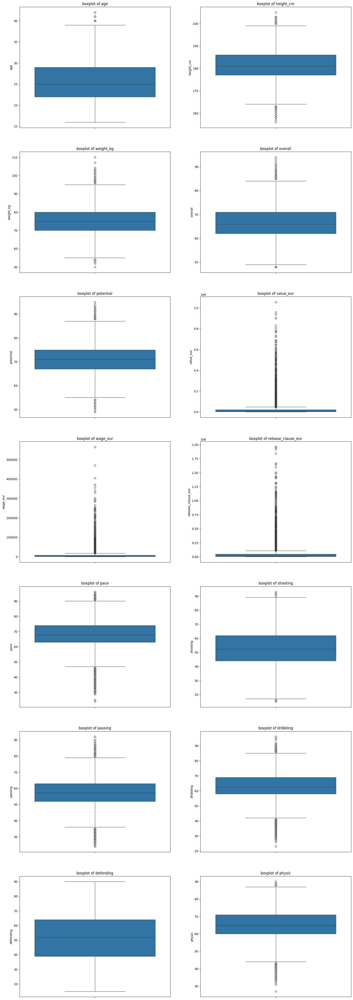

In [ ]:
plt.figure(figsize=(20,60))
for i,column in enumerate(outlier_list,start=1):
    ax=plt.subplot(7,2,i)
    sns.boxplot(df[column],ax=ax)
    plt.title('boxplot of {}'.format(column))
plt.show()

#### Age

<Axes: xlabel='age', ylabel='Count'>

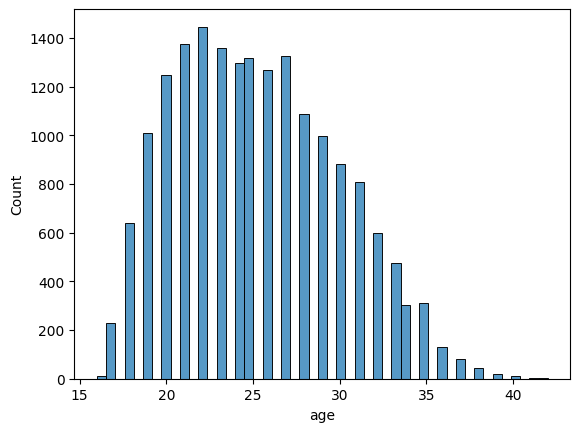

In [ ]:
sns.histplot(df['age'])


Observation:
- we dont need to perform ouliers treatment on age because it is not human error it is real data

#### Height

<Axes: ylabel='height_cm'>

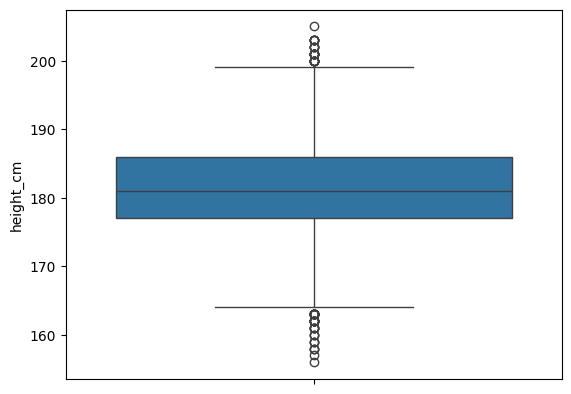

In [ ]:
sns.boxplot(df['height_cm'])

In [ ]:
df['passing'].max()

92.0

<Axes: xlabel='height_cm', ylabel='Count'>

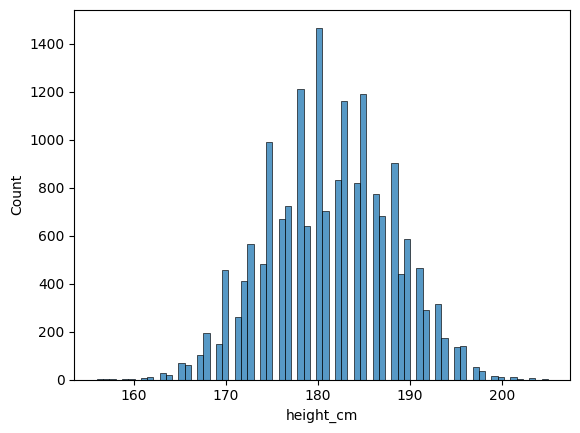

In [ ]:
sns.histplot(df['height_cm'])

Observation:
- we found there is an outlier it is not an human error there are some person who plays football have more height
- we use wisorize method for the  outliers are valid but extreme (e.g., a player’s height being 210 cm, which is rare but real), you can cap them to a reasonable value to prevent them from skewing the analysis.

We are using Winsorization because outlier is genuine but still distorting your analysis. By capping extreme values, Winsorization can help ensure that these values don't excessively affect statistical measures

In [ ]:
from scipy.stats.mstats import winsorize
winsorized=winsorize(df['height_cm'],[0.02,0.02])

In [ ]:
df[df['height_cm']>198]

In [ ]:
df['height_cm']=winsorized

In [ ]:
df['height_cm'].max()

In [ ]:
for i in df.columns:
    print(f'column {i} has',round(df[i].isna().sum()/len(df),2),'Missing values')

column short_name has 0.0 Missing values
column age has 0.0 Missing values
column height_cm has 0.0 Missing values
column weight_kg has 0.0 Missing values
column overall has 0.0 Missing values
column potential has 0.0 Missing values
column value_eur has 0.0 Missing values
column wage_eur has 0.0 Missing values
column player_positions has 0.0 Missing values
column preferred_foot has 0.0 Missing values
column international_reputation has 0.0 Missing values
column weak_foot has 0.0 Missing values
column skill_moves has 0.0 Missing values
column work_rate has 0.0 Missing values
column release_clause_eur has 0.0 Missing values
column team_position has 0.0 Missing values
column pace has 0.0 Missing values
column shooting has 0.0 Missing values
column passing has 0.0 Missing values
column dribbling has 0.0 Missing values
column defending has 0.0 Missing values
column physic has 0.0 Missing values
column attacking_crossing has 0.0 Missing values
column attacking_finishing has 0.0 Missing value

#### Weight kg

<Axes: ylabel='weight_kg'>

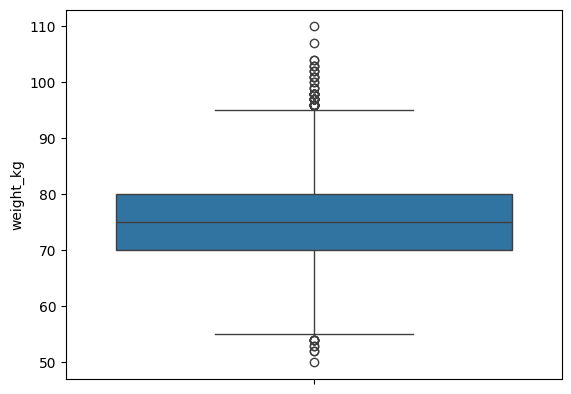

In [ ]:
sns.boxplot(df['weight_kg'])

In [ ]:
df[df['weight_kg']>100]

<Axes: xlabel='weight_kg', ylabel='Count'>

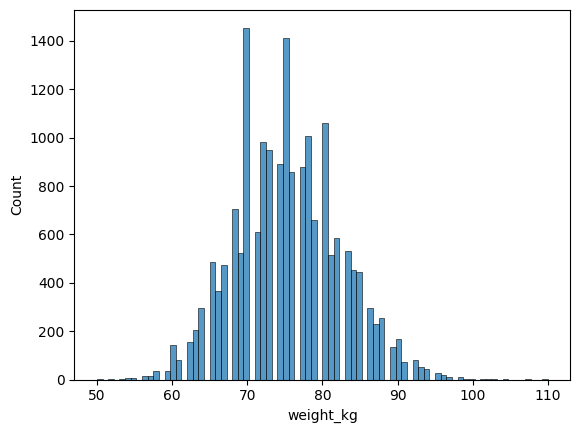

In [ ]:
sns.histplot(df['weight_kg'])

In [ ]:
sns.kdeplot(df['weight_kg'])

In [ ]:
winsorized_weight=winsorize(df['weight_kg'],[0.01,0.01])

In [ ]:
winsorized_weight

masked_array(data=[72, 83, 68, ..., 75, 74, 78],
             mask=False,
       fill_value=999999)

In [ ]:
df['weight_kg']=winsorized

In [ ]:
sns.boxplot(df['weight_kg'])

In [ ]:
for i in df.columns:
    print(f'column {i} has',round(df[i].isna().sum()/len(df),2),'Missing values')

column short_name has 0.0 Missing values
column age has 0.0 Missing values
column height_cm has 0.0 Missing values
column weight_kg has 0.0 Missing values
column overall has 0.0 Missing values
column potential has 0.0 Missing values
column value_eur has 0.0 Missing values
column wage_eur has 0.0 Missing values
column player_positions has 0.0 Missing values
column preferred_foot has 0.0 Missing values
column international_reputation has 0.0 Missing values
column weak_foot has 0.0 Missing values
column skill_moves has 0.0 Missing values
column work_rate has 0.0 Missing values
column release_clause_eur has 0.0 Missing values
column team_position has 0.0 Missing values
column pace has 0.0 Missing values
column shooting has 0.0 Missing values
column passing has 0.0 Missing values
column dribbling has 0.0 Missing values
column defending has 0.0 Missing values
column physic has 0.0 Missing values
column attacking_crossing has 0.0 Missing values
column attacking_finishing has 0.0 Missing value

#### value_eur,wage,release

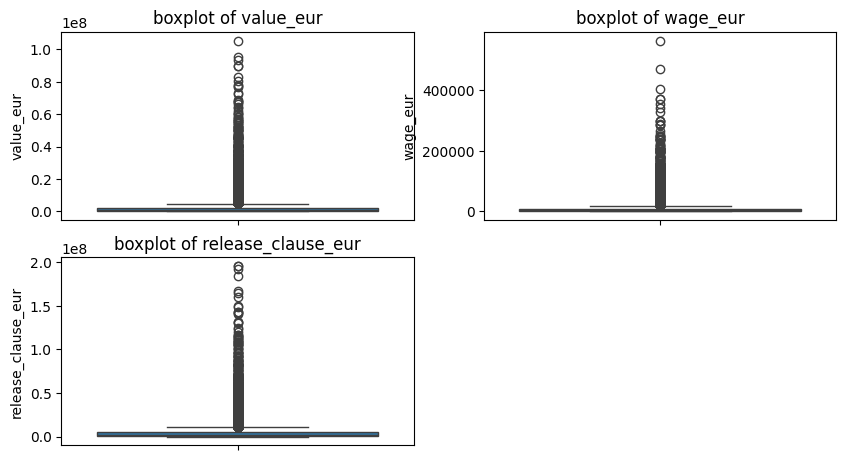

In [ ]:
plt.figure(figsize=(10,20))
for i,column in enumerate(['value_eur','wage_eur','release_clause_eur'],start=1):
    ax=plt.subplot(7,2,i)
    sns.boxplot(df[column],ax=ax)
    plt.title('boxplot of {}'.format(column))
plt.show()

In [ ]:
df.head(2)

In [ ]:
df[df['wage_eur']>8000].head(3)

,short_name,age,height_cm,weight_kg,overall,potential,value_eur,wage_eur,player_positions,preferred_foot,...,imputed_lwb,imputed_ldm,imputed_cdm,imputed_rdm,imputed_rwb,imputed_lb,imputed_lcb,imputed_cb,imputed_rcb,imputed_rb
0,L. Messi,32,170,170,94,94,95500000,565000,"RW, CF, ST",Left,...,68.0,66.0,66.0,66.0,68.0,63.0,52.0,52.0,52.0,63.0
1,Cristiano Ronaldo,34,187,187,93,93,58500000,405000,"ST, LW",Right,...,65.0,61.0,61.0,61.0,65.0,61.0,53.0,53.0,53.0,61.0
2,Neymar Jr,27,175,175,92,92,105500000,290000,"LW, CAM",Right,...,66.0,61.0,61.0,61.0,66.0,61.0,46.0,46.0,46.0,61.0


In [ ]:
len(df[df['wage_eur']>100000])

<Axes: ylabel='wage_eur'>

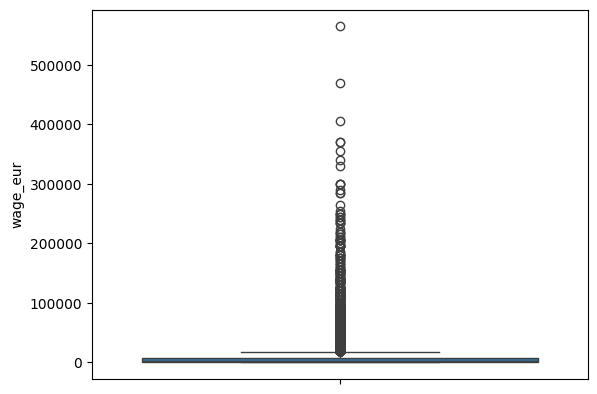

In [ ]:
sns.boxplot(df['wage_eur'])

In [ ]:
sns.kdeplot(df['wage_eur'])

In [ ]:
#### since wage_eur and value_eur has zero values
#### we remove those rows which has zero

In [ ]:
len(df[df['value_eur']==0])

250

In [ ]:
df = df[df['value_eur'] > 0]

In [ ]:
for i in df.columns:
    print(f'column {i} has',round(df[i].isna().sum()/len(df),2),'Missing values')

column short_name has 0.0 Missing values
column age has 0.0 Missing values
column height_cm has 0.0 Missing values
column weight_kg has 0.0 Missing values
column overall has 0.0 Missing values
column potential has 0.0 Missing values
column value_eur has 0.0 Missing values
column wage_eur has 0.0 Missing values
column player_positions has 0.0 Missing values
column preferred_foot has 0.0 Missing values
column international_reputation has 0.0 Missing values
column weak_foot has 0.0 Missing values
column skill_moves has 0.0 Missing values
column work_rate has 0.0 Missing values
column release_clause_eur has 0.0 Missing values
column team_position has 0.0 Missing values
column pace has 0.0 Missing values
column shooting has 0.0 Missing values
column passing has 0.0 Missing values
column dribbling has 0.0 Missing values
column defending has 0.0 Missing values
column physic has 0.0 Missing values
column attacking_crossing has 0.0 Missing values
column attacking_finishing has 0.0 Missing value

In [ ]:
len(df[df['value_eur']==0])

0

we are using log transformation becuase the datas are right skewed

In [ ]:
# Apply log1p transformation (log(x + 1)) to avoid log(0) issues
df['value_eur'] = np.log1p(df['value_eur'])
df['wage_eur'] = np.log1p(df['wage_eur'])
df['release_clause_eur'] = np.log1p(df['release_clause_eur'])




In [ ]:
df.head()


,short_name,age,height_cm,weight_kg,overall,potential,value_eur,wage_eur,player_positions,preferred_foot,...,imputed_lwb,imputed_ldm,imputed_cdm,imputed_rdm,imputed_rwb,imputed_lb,imputed_lcb,imputed_cb,imputed_rcb,imputed_rb
0,L. Messi,32,170,170,94,94,18.374637,13.244583,"RW, CF, ST",Left,...,68.000000,66.000000,66.000000,66.000000,68.000000,63.000000,52.00000,52.00000,52.00000,63.000000
1,Cristiano Ronaldo,34,187,187,93,93,17.884537,12.911645,"ST, LW",Right,...,65.000000,61.000000,61.000000,61.000000,65.000000,61.000000,53.00000,53.00000,53.00000,61.000000
2,Neymar Jr,27,175,175,92,92,18.474222,12.577640,"LW, CAM",Right,...,66.000000,61.000000,61.000000,61.000000,66.000000,61.000000,46.00000,46.00000,46.00000,61.000000
3,J. Oblak,26,188,188,91,93,18.165789,11.736077,GK,Right,...,57.396318,56.733469,56.733469,56.733469,57.396318,56.672393,55.47568,55.47568,55.47568,56.672393
4,E. Hazard,28,175,175,91,91,18.315320,13.060490,"LW, CF",Right,...,66.000000,63.000000,63.000000,63.000000,66.000000,61.000000,49.00000,49.00000,49.00000,61.000000


In [ ]:
sns.kdeplot(df['release_clause_eur'])

In [ ]:
sns.boxplot(df['release_clause_eur'])

#### Pace

In [ ]:
sns.kdeplot(df['pace'])

In [ ]:
sns.boxplot(df['pace'])

In [ ]:
df['weight_kg'].isnull().sum()

In [ ]:
from scipy.stats.mstats import winsorize

In [ ]:
winzorized_pace=winsorize(df['pace'],(0.05,0.02))
winzorized_passing=winsorize(df['passing'],(0.01,0.01))
winzorized_dribbling=winsorize(df['dribbling'],(0.05,0.05))
winzorized_physic=winsorize(df['physic'],(0.01))
df['physic']=winzorized_physic
df['dribbling']=winzorized_dribbling
df['pace']=winzorized_pace
df['passing']=winzorized_passing

<Axes: xlabel='physic', ylabel='Count'>

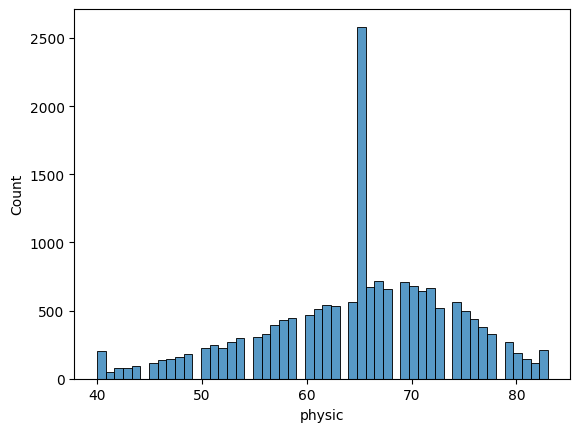

In [ ]:
sns.histplot(df['physic'])

<Axes: ylabel='physic'>

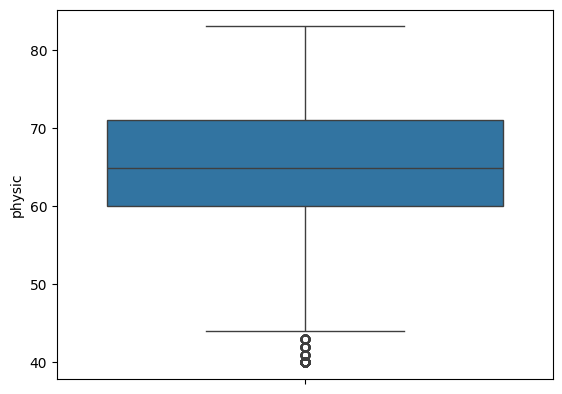

In [ ]:
sns.boxplot(df['physic'])

In [ ]:
sns.boxplot(df['physic'])

In [ ]:
sns.histplot(df['physical'])

In [ ]:
sns.histplot(df['passing'])

In [ ]:
columns_new=['pace','shooting','passing', 'dribbling','defending','physic']

In [ ]:
sns.boxplot(df['pace'])

#### 5.3 Feature scaling

- There many outliers in the dataset we min max sclaer
- Min Max Sclaer converts values between 0 to 1

In [ ]:
numerical_columns=[col for col in df.columns if df[col].dtypes!='O']

In [ ]:
from sklearn.preprocessing import MinMaxScaler
scaler=MinMaxScaler()


In [ ]:
for i in df.columns:
    print(f'column {i} has',round(df[i].isna().sum()/len(df),2),'Missing values')

column short_name has 0.0 Missing values
column age has 0.0 Missing values
column height_cm has 0.0 Missing values
column weight_kg has 0.0 Missing values
column overall has 0.0 Missing values
column potential has 0.0 Missing values
column value_eur has 0.0 Missing values
column wage_eur has 0.0 Missing values
column player_positions has 0.0 Missing values
column preferred_foot has 0.0 Missing values
column international_reputation has 0.0 Missing values
column weak_foot has 0.0 Missing values
column skill_moves has 0.0 Missing values
column work_rate has 0.0 Missing values
column release_clause_eur has 0.0 Missing values
column team_position has 0.0 Missing values
column pace has 0.0 Missing values
column shooting has 0.0 Missing values
column passing has 0.0 Missing values
column dribbling has 0.0 Missing values
column defending has 0.0 Missing values
column physic has 0.0 Missing values
column attacking_crossing has 0.0 Missing values
column attacking_finishing has 0.0 Missing value

In [ ]:
df.shape

(18028, 83)

In [ ]:
df['value_eur'].head(5)

,value_eur
0,18.374637
1,17.884537
2,18.474222
3,18.165789
4,18.315320


In [ ]:
scaled_data=scaler.fit_transform(df[numerical_columns])
scalad_df=pd.DataFrame(scaled_data,columns=numerical_columns)

In [ ]:
scaled_data

array([[0.61538462, 0.07407407, 0.07407407, ..., 0.42622951, 0.42622951,
        0.61111111],
       [0.69230769, 0.7037037 , 0.7037037 , ..., 0.44262295, 0.44262295,
        0.57407407],
       [0.42307692, 0.25925926, 0.25925926, ..., 0.32786885, 0.32786885,
        0.57407407],
       ...,
       [0.11538462, 0.66666667, 0.66666667, ..., 0.37704918, 0.37704918,
        0.31481481],
       [0.07692308, 0.62962963, 0.62962963, ..., 0.37704918, 0.37704918,
        0.33333333],
       [0.38461538, 0.51851852, 0.51851852, ..., 0.39344262, 0.39344262,
        0.33333333]])

In [ ]:
df[numerical_columns]=scaled_data

In [ ]:
df.head(1)

In [ ]:
df['weight_kg']

,weight_kg
0,0.074074
1,0.703704
2,0.259259
3,0.740741
4,0.259259
5,0.481481
6,0.703704
7,0.925926
8,0.148148
9,0.259259


#### 5.4 Feature Encoding
- Feature encoding is an essential step in converting categorical data into a numerical format that machine learning algorithms can process

In [ ]:
categorical_col=[x for x in df.columns if df[x].dtypes=='O']

In [ ]:
categorical_col

['short_name',
 'player_positions',
 'preferred_foot',
 'work_rate',
 'team_position']

In [ ]:
df[categorical_col].head(4)

,short_name,player_positions,preferred_foot,work_rate,team_position
0,L. Messi,"RW, CF, ST",Left,Medium/Low,RW
1,Cristiano Ronaldo,"ST, LW",Right,High/Low,LW
2,Neymar Jr,"LW, CAM",Right,High/Medium,CAM
3,J. Oblak,GK,Right,Medium/Medium,GK


In [ ]:
pd.set_option('display.max_columns',None)

In [ ]:
df.head()

,short_name,age,height_cm,weight_kg,overall,potential,value_eur,wage_eur,player_positions,preferred_foot,international_reputation,weak_foot,skill_moves,work_rate,release_clause_eur,team_position,pace,shooting,passing,dribbling,defending,physic,attacking_crossing,attacking_finishing,attacking_heading_accuracy,attacking_short_passing,attacking_volleys,skill_dribbling,skill_curve,skill_fk_accuracy,skill_long_passing,skill_ball_control,movement_acceleration,movement_sprint_speed,movement_agility,movement_reactions,movement_balance,power_shot_power,power_jumping,power_stamina,power_strength,power_long_shots,mentality_aggression,mentality_interceptions,mentality_positioning,mentality_vision,mentality_penalties,mentality_composure,defending_marking,defending_standing_tackle,defending_sliding_tackle,goalkeeping_diving,goalkeeping_handling,goalkeeping_kicking,goalkeeping_positioning,goalkeeping_reflexes,Physical,imputed_ls,imputed_st,imputed_rs,imputed_lw,imputed_lf,imputed_cf,imputed_rf,imputed_rw,imputed_lam,imputed_cam,imputed_ram,imputed_lm,imputed_lcm,imputed_cm,imputed_rcm,imputed_rm,imputed_lwb,imputed_ldm,imputed_cdm,imputed_rdm,imputed_rwb,imputed_lb,imputed_lcb,imputed_cb,imputed_rcb,imputed_rb
0,L. Messi,32,170,170,94,94,18.374637,13.244583,"RW, CF, ST",Left,5,4,4,Medium/Low,19.092604,RW,87.000000,92.000000,79.000000,77.000000,39.000000,66.000000,88,95,70,92,88,97,93,94,92,96,91,84,93,95,95,86,68,75,68,94,48,40,94,94,75,96,33,37,26,6,11,15,14,8,94.0,89.000000,89.000000,89.000000,93.00000,93.000000,93.000000,93.000000,93.00000,93.000000,93.000000,93.000000,92.000000,87.000000,87.000000,87.000000,92.000000,68.000000,66.000000,66.000000,66.000000,68.000000,63.000000,52.00000,52.00000,52.00000,63.000000
1,Cristiano Ronaldo,34,187,187,93,93,17.884537,12.911645,"ST, LW",Right,5,4,5,High/Low,18.385054,LW,89.000000,93.000000,79.000000,77.000000,35.000000,78.000000,84,94,89,83,87,89,81,76,77,92,89,91,87,96,71,95,95,85,78,93,63,29,95,82,85,95,28,32,24,7,11,15,14,11,85.5,91.000000,91.000000,91.000000,89.00000,90.000000,90.000000,90.000000,89.00000,88.000000,88.000000,88.000000,88.000000,81.000000,81.000000,81.000000,88.000000,65.000000,61.000000,61.000000,61.000000,65.000000,61.000000,53.00000,53.00000,53.00000,61.000000
2,Neymar Jr,27,175,175,92,92,18.474222,12.577640,"LW, CAM",Right,5,5,5,High/Medium,19.089535,CAM,89.000000,85.000000,79.000000,77.000000,32.000000,58.000000,87,87,62,87,87,96,88,87,81,95,94,89,96,92,84,80,61,81,49,84,51,36,87,90,90,94,27,26,29,9,9,15,15,11,91.0,84.000000,84.000000,84.000000,90.00000,89.000000,89.000000,89.000000,90.00000,90.000000,90.000000,90.000000,89.000000,82.000000,82.000000,82.000000,89.000000,66.000000,61.000000,61.000000,61.000000,66.000000,61.000000,46.00000,46.00000,46.00000,61.000000
3,J. Oblak,26,188,188,91,93,18.165789,11.736077,GK,Right,3,3,1,Medium/Medium,18.919636,GK,67.700899,52.298301,57.233777,62.531585,51.553503,64.876678,13,11,15,43,13,12,13,14,40,30,43,60,67,88,49,59,78,41,78,12,34,19,11,65,11,68,27,12,18,87,92,78,90,89,NaN,57.840783,57.840783,57.840783,59.08595,58.776382,58.776382,58.776382,59.08595,59.050302,59.050302,59.050302,59.765608,58.242766,58.242766,58.242766,59.765608,57.396318,56.733469,56.733469,56.733469,57.396318,56.672393,55.47568,55.47568,55.47568,56.672393
4,E. Hazard,28,175,175,91,91,18.315320,13.060490,"LW, CF",Right,4,4,4,High/Medium,19.033160,LW,89.000000,83.000000,79.000000,77.000000,35.000000,66.000000,81,84,61,89,83,95,83,79,83,94,94,88,95,90,94,82,56,84,63,80,54,41,87,89,88,91,34,27,22,11,12,6,8,8,90.0,83.000000,83.000000,83.000000,89.00000,88.000000,88.000000,88.000000,89.00000,89.000000,89.000000,89.000000,89.000000,83.000000,83.000000,83.000000,89.000000,66.000000,63.000000,63.000000,63.000000,66.000000,61.000000,49.00000,49.00000,49.00000,61.000000


In [ ]:
df.drop(['team_position'],axis=1,inplace=True)

In [ ]:
categorical_col=[x for x in df.columns if df[x].dtypes=='O']

In [ ]:
categorical_col

['short_name', 'player_positions', 'preferred_foot', 'work_rate']

In [ ]:
for i  in categorical_col:
    print(f'column {i} has {df[i].nunique()} categories')

column short_name has 17120 categories
column player_positions has 642 categories
column preferred_foot has 2 categories
column work_rate has 9 categories


Observation
- preferred_foot - we can use label encoding
- work_rate  - we can use one hot encoding
- player_position  - we can one hot  encoding

#### Preferred foot

In [ ]:
from sklearn.preprocessing import LabelEncoder
label=LabelEncoder()

In [ ]:
labelled_foot=label.fit_transform(df['preferred_foot'])

In [ ]:
labelled_foot

array([0, 1, 1, ..., 1, 1, 1])

In [ ]:
df['preferred_foot']=labelled_foot

In [ ]:
df.head()

,short_name,age,height_cm,weight_kg,overall,potential,value_eur,wage_eur,player_positions,preferred_foot,international_reputation,weak_foot,skill_moves,work_rate,release_clause_eur,pace,shooting,passing,dribbling,defending,physic,attacking_crossing,attacking_finishing,attacking_heading_accuracy,attacking_short_passing,attacking_volleys,skill_dribbling,skill_curve,skill_fk_accuracy,skill_long_passing,skill_ball_control,movement_acceleration,movement_sprint_speed,movement_agility,movement_reactions,movement_balance,power_shot_power,power_jumping,power_stamina,power_strength,power_long_shots,mentality_aggression,mentality_interceptions,mentality_positioning,mentality_vision,mentality_penalties,mentality_composure,defending_marking,defending_standing_tackle,defending_sliding_tackle,goalkeeping_diving,goalkeeping_handling,goalkeeping_kicking,goalkeeping_positioning,goalkeeping_reflexes,Physical,imputed_ls,imputed_st,imputed_rs,imputed_lw,imputed_lf,imputed_cf,imputed_rf,imputed_rw,imputed_lam,imputed_cam,imputed_ram,imputed_lm,imputed_lcm,imputed_cm,imputed_rcm,imputed_rm,imputed_lwb,imputed_ldm,imputed_cdm,imputed_rdm,imputed_rwb,imputed_lb,imputed_lcb,imputed_cb,imputed_rcb,imputed_rb
0,L. Messi,32,170,170,94,94,18.374637,13.244583,"RW, CF, ST",0,5,4,4,Medium/Low,19.092604,87.000000,92.000000,79.000000,77.000000,39.000000,66.000000,88,95,70,92,88,97,93,94,92,96,91,84,93,95,95,86,68,75,68,94,48,40,94,94,75,96,33,37,26,6,11,15,14,8,94.0,89.000000,89.000000,89.000000,93.00000,93.000000,93.000000,93.000000,93.00000,93.000000,93.000000,93.000000,92.000000,87.000000,87.000000,87.000000,92.000000,68.000000,66.000000,66.000000,66.000000,68.000000,63.000000,52.00000,52.00000,52.00000,63.000000
1,Cristiano Ronaldo,34,187,187,93,93,17.884537,12.911645,"ST, LW",1,5,4,5,High/Low,18.385054,89.000000,93.000000,79.000000,77.000000,35.000000,78.000000,84,94,89,83,87,89,81,76,77,92,89,91,87,96,71,95,95,85,78,93,63,29,95,82,85,95,28,32,24,7,11,15,14,11,85.5,91.000000,91.000000,91.000000,89.00000,90.000000,90.000000,90.000000,89.00000,88.000000,88.000000,88.000000,88.000000,81.000000,81.000000,81.000000,88.000000,65.000000,61.000000,61.000000,61.000000,65.000000,61.000000,53.00000,53.00000,53.00000,61.000000
2,Neymar Jr,27,175,175,92,92,18.474222,12.577640,"LW, CAM",1,5,5,5,High/Medium,19.089535,89.000000,85.000000,79.000000,77.000000,32.000000,58.000000,87,87,62,87,87,96,88,87,81,95,94,89,96,92,84,80,61,81,49,84,51,36,87,90,90,94,27,26,29,9,9,15,15,11,91.0,84.000000,84.000000,84.000000,90.00000,89.000000,89.000000,89.000000,90.00000,90.000000,90.000000,90.000000,89.000000,82.000000,82.000000,82.000000,89.000000,66.000000,61.000000,61.000000,61.000000,66.000000,61.000000,46.00000,46.00000,46.00000,61.000000
3,J. Oblak,26,188,188,91,93,18.165789,11.736077,GK,1,3,3,1,Medium/Medium,18.919636,67.700899,52.298301,57.233777,62.531585,51.553503,64.876678,13,11,15,43,13,12,13,14,40,30,43,60,67,88,49,59,78,41,78,12,34,19,11,65,11,68,27,12,18,87,92,78,90,89,NaN,57.840783,57.840783,57.840783,59.08595,58.776382,58.776382,58.776382,59.08595,59.050302,59.050302,59.050302,59.765608,58.242766,58.242766,58.242766,59.765608,57.396318,56.733469,56.733469,56.733469,57.396318,56.672393,55.47568,55.47568,55.47568,56.672393
4,E. Hazard,28,175,175,91,91,18.315320,13.060490,"LW, CF",1,4,4,4,High/Medium,19.033160,89.000000,83.000000,79.000000,77.000000,35.000000,66.000000,81,84,61,89,83,95,83,79,83,94,94,88,95,90,94,82,56,84,63,80,54,41,87,89,88,91,34,27,22,11,12,6,8,8,90.0,83.000000,83.000000,83.000000,89.00000,88.000000,88.000000,88.000000,89.00000,89.000000,89.000000,89.000000,89.000000,83.000000,83.000000,83.000000,89.000000,66.000000,63.000000,63.000000,63.000000,66.000000,61.000000,49.00000,49.00000,49.00000,61.000000


In [ ]:
df.head(1)

,short_name,age,height_cm,weight_kg,overall,potential,value_eur,wage_eur,player_positions,preferred_foot,international_reputation,weak_foot,skill_moves,work_rate,release_clause_eur,pace,shooting,passing,dribbling,defending,physic,attacking_crossing,attacking_finishing,attacking_heading_accuracy,attacking_short_passing,attacking_volleys,skill_dribbling,skill_curve,skill_fk_accuracy,skill_long_passing,skill_ball_control,movement_acceleration,movement_sprint_speed,movement_agility,movement_reactions,movement_balance,power_shot_power,power_jumping,power_stamina,power_strength,power_long_shots,mentality_aggression,mentality_interceptions,mentality_positioning,mentality_vision,mentality_penalties,mentality_composure,defending_marking,defending_standing_tackle,defending_sliding_tackle,goalkeeping_diving,goalkeeping_handling,goalkeeping_kicking,goalkeeping_positioning,goalkeeping_reflexes,Physical,imputed_ls,imputed_st,imputed_rs,imputed_lw,imputed_lf,imputed_cf,imputed_rf,imputed_rw,imputed_lam,imputed_cam,imputed_ram,imputed_lm,imputed_lcm,imputed_cm,imputed_rcm,imputed_rm,imputed_lwb,imputed_ldm,imputed_cdm,imputed_rdm,imputed_rwb,imputed_lb,imputed_lcb,imputed_cb,imputed_rcb,imputed_rb
0,L. Messi,32,170,170,94,94,18.374637,13.244583,"RW, CF, ST",0,5,4,4,Medium/Low,19.092604,87.0,92.0,79.0,77.0,39.0,66.0,88,95,70,92,88,97,93,94,92,96,91,84,93,95,95,86,68,75,68,94,48,40,94,94,75,96,33,37,26,6,11,15,14,8,94.0,89.0,89.0,89.0,93.0,93.0,93.0,93.0,93.0,93.0,93.0,93.0,92.0,87.0,87.0,87.0,92.0,68.0,66.0,66.0,66.0,68.0,63.0,52.0,52.0,52.0,63.0


#### Player position

In [ ]:
new_player_positions=df['player_positions'].str.get_dummies(sep=',').add_prefix('Position_')

KeyError: 'player_positions'

In [ ]:
new_player_positions.head()

,Position_ CAM,Position_ CB,Position_ CDM,Position_ CF,Position_ CM,Position_ LB,Position_ LM,Position_ LW,Position_ LWB,Position_ RB,Position_ RM,Position_ RW,Position_ RWB,Position_ ST,Position_CAM,Position_CB,Position_CDM,Position_CF,Position_CM,Position_GK,Position_LB,Position_LM,Position_LW,Position_LWB,Position_RB,Position_RM,Position_RW,Position_RWB,Position_ST
0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1
2,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0
4,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0


In [ ]:
df=pd.concat([df,new_player_positions],axis=1)

In [ ]:
df.head(2)

,short_name,age,height_cm,weight_kg,overall,potential,value_eur,wage_eur,preferred_foot,international_reputation,weak_foot,skill_moves,work_rate,release_clause_eur,pace,shooting,passing,dribbling,defending,physic,attacking_crossing,attacking_finishing,attacking_heading_accuracy,attacking_short_passing,attacking_volleys,skill_dribbling,skill_curve,skill_fk_accuracy,skill_long_passing,skill_ball_control,movement_acceleration,movement_sprint_speed,movement_agility,movement_reactions,movement_balance,power_shot_power,power_jumping,power_stamina,power_strength,power_long_shots,mentality_aggression,mentality_interceptions,mentality_positioning,mentality_vision,mentality_penalties,mentality_composure,defending_marking,defending_standing_tackle,defending_sliding_tackle,goalkeeping_diving,goalkeeping_handling,goalkeeping_kicking,goalkeeping_positioning,goalkeeping_reflexes,Physical,imputed_ls,imputed_st,imputed_rs,imputed_lw,imputed_lf,imputed_cf,imputed_rf,imputed_rw,imputed_lam,imputed_cam,imputed_ram,imputed_lm,imputed_lcm,imputed_cm,imputed_rcm,imputed_rm,imputed_lwb,imputed_ldm,imputed_cdm,imputed_rdm,imputed_rwb,imputed_lb,imputed_lcb,imputed_cb,imputed_rcb,imputed_rb,Position_ CAM,Position_ CB,Position_ CDM,Position_ CF,Position_ CM,Position_ LB,Position_ LM,Position_ LW,Position_ LWB,Position_ RB,Position_ RM,Position_ RW,Position_ RWB,Position_ ST,Position_CAM,Position_CB,Position_CDM,Position_CF,Position_CM,Position_GK,Position_LB,Position_LM,Position_LW,Position_LWB,Position_RB,Position_RM,Position_RW,Position_RWB,Position_ST
0,L. Messi,32,170,170,94,94,18.374637,13.244583,0,5,4,4,Medium/Low,19.092604,87.0,92.0,79.0,77.0,39.0,66.0,88,95,70,92,88,97,93,94,92,96,91,84,93,95,95,86,68,75,68,94,48,40,94,94,75,96,33,37,26,6,11,15,14,8,94.0,89.0,89.0,89.0,93.0,93.0,93.0,93.0,93.0,93.0,93.0,93.0,92.0,87.0,87.0,87.0,92.0,68.0,66.0,66.0,66.0,68.0,63.0,52.0,52.0,52.0,63.0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
1,Cristiano Ronaldo,34,187,187,93,93,17.884537,12.911645,1,5,4,5,High/Low,18.385054,89.0,93.0,79.0,77.0,35.0,78.0,84,94,89,83,87,89,81,76,77,92,89,91,87,96,71,95,95,85,78,93,63,29,95,82,85,95,28,32,24,7,11,15,14,11,85.5,91.0,91.0,91.0,89.0,90.0,90.0,90.0,89.0,88.0,88.0,88.0,88.0,81.0,81.0,81.0,88.0,65.0,61.0,61.0,61.0,65.0,61.0,53.0,53.0,53.0,61.0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1


#### Observation
- we had done one hot encoding on player position so we can drop player position

In [ ]:
df.drop(['player_positions'],axis=1,inplace=True)

KeyError: "['player_positions'] not found in axis"

### Work rate

In [ ]:
new_work_rate=df['work_rate'].str.get_dummies(sep='/').add_prefix('work_rate_')

In [ ]:
new_work_rate

,work_rate_High,work_rate_Low,work_rate_Medium
0,0,1,1
1,1,1,0
2,1,0,1
3,0,0,1
4,1,0,1
...,...,...,...
18273,1,0,1
18274,0,0,1
18275,0,1,1
18276,0,1,0


In [ ]:
df=pd.concat([df,new_work_rate],axis=1)

In [ ]:
df.head()

In [ ]:
df.drop(['work_rate'],axis=1,inplace=True)

In [ ]:
df.to_csv('pre_processed_with_onehotteam.csv',index=False)

In [ ]:
import pandas as pd
import sklearn
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings

warnings.filterwarnings('ignore')



In [ ]:
df=pd.read_csv('pre_processed_with_onehotteam.csv')
df.shape

(18278, 111)

In [ ]:
columns=df.columns.to_list()

In [ ]:
columns

['short_name',
 'age',
 'height_cm',
 'weight_kg',
 'overall',
 'potential',
 'value_eur',
 'wage_eur',
 'preferred_foot',
 'international_reputation',
 'weak_foot',
 'skill_moves',
 'release_clause_eur',
 'pace',
 'shooting',
 'passing',
 'dribbling',
 'defending',
 'physic',
 'attacking_crossing',
 'attacking_finishing',
 'attacking_heading_accuracy',
 'attacking_short_passing',
 'attacking_volleys',
 'skill_dribbling',
 'skill_curve',
 'skill_fk_accuracy',
 'skill_long_passing',
 'skill_ball_control',
 'movement_acceleration',
 'movement_sprint_speed',
 'movement_agility',
 'movement_reactions',
 'movement_balance',
 'power_shot_power',
 'power_jumping',
 'power_stamina',
 'power_strength',
 'power_long_shots',
 'mentality_aggression',
 'mentality_interceptions',
 'mentality_positioning',
 'mentality_vision',
 'mentality_penalties',
 'mentality_composure',
 'defending_marking',
 'defending_standing_tackle',
 'defending_sliding_tackle',
 'goalkeeping_diving',
 'goalkeeping_handling',

In [ ]:
data=df.copy()

In [ ]:
list_with_imputed=[x for x in columns if x.startswith('imput')]

In [ ]:
df.drop(list_with_imputed,axis=1,inplace=True)

In [ ]:
df.drop(['short_name'],axis=1,inplace=True)

we are removing the columns which has imputed as prefix because it reduces overall performance of the model

In [ ]:
df.shape

(18278, 84)

### Correlation
-  Correlation is measured using a correlation matrix, which calculates the strength of the linear relationship between pairs of features. Typically, features with a correlation coefficient greater than a specified threshold (such as 0.9) are considered highly correlated and are candidates for removal. The goal is to keep only one feature from each group of highly correlated features, thereby reducing the dimensionality of the dataset without sacrificing crucial information.





In [ ]:
corr_matrix=df.corr()
corr_matrix

,age,height_cm,weight_kg,overall,potential,value_eur,wage_eur,preferred_foot,international_reputation,weak_foot,...,Position_LW,Position_LWB,Position_RB,Position_RM,Position_RW,Position_RWB,Position_ST,work_rate_High,work_rate_Low,work_rate_Medium
age,1.000000,0.082508,0.082508,0.464305,-0.262872,0.049949,0.191452,0.006451,0.259582,0.073988,...,-0.055566,0.001763,0.011678,-0.029458,-0.045320,-0.004511,-0.001297,0.109903,0.059581,-0.085411
height_cm,0.082508,1.000000,1.000000,0.040820,-0.001858,-0.002719,0.017095,0.084061,0.038420,-0.175152,...,-0.107746,-0.032465,-0.119050,-0.164849,-0.101837,-0.025390,0.074641,-0.150914,0.000075,0.059737
weight_kg,0.082508,1.000000,1.000000,0.040820,-0.001858,-0.002719,0.017095,0.084061,0.038420,-0.175152,...,-0.107746,-0.032465,-0.119050,-0.164849,-0.101837,-0.025390,0.074641,-0.150914,0.000075,0.059737
overall,0.464305,0.040820,0.040820,1.000000,0.646650,0.583640,0.602803,-0.034474,0.475557,0.230276,...,0.014681,-0.014401,-0.006946,-0.006369,0.017161,-0.004866,0.011266,0.247924,0.032045,-0.139121
potential,-0.262872,-0.001858,-0.001858,0.646650,1.000000,0.526495,0.454797,-0.030620,0.341221,0.171354,...,0.048671,-0.022052,-0.042972,-0.012493,0.048230,-0.006501,0.007904,0.139376,-0.017424,-0.064552
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Position_RWB,-0.004511,-0.025390,-0.025390,-0.004866,-0.006501,0.002051,0.005793,0.032135,-0.004992,0.002479,...,-0.008945,-0.004330,-0.017132,-0.015197,-0.008836,1.000000,-0.024967,0.033925,-0.019199,0.005600
Position_ST,-0.001297,0.074641,0.074641,0.011266,0.007904,0.030607,0.037904,0.089852,0.025532,0.099488,...,-0.058939,-0.028531,-0.112880,-0.100129,-0.058219,-0.024967,1.000000,0.052382,0.145446,-0.084950
work_rate_High,0.109903,-0.150914,-0.150914,0.247924,0.139376,0.166740,0.168757,-0.033990,0.100219,0.140879,...,0.036992,0.029614,0.088950,0.039480,0.021001,0.033925,0.052382,1.000000,0.048333,-0.446610
work_rate_Low,0.059581,0.000075,0.000075,0.032045,-0.017424,0.008674,0.017419,0.009618,0.021830,0.005148,...,0.014194,-0.021047,-0.075729,0.031128,0.032781,-0.019199,0.145446,0.048333,1.000000,-0.422572


<Axes: >

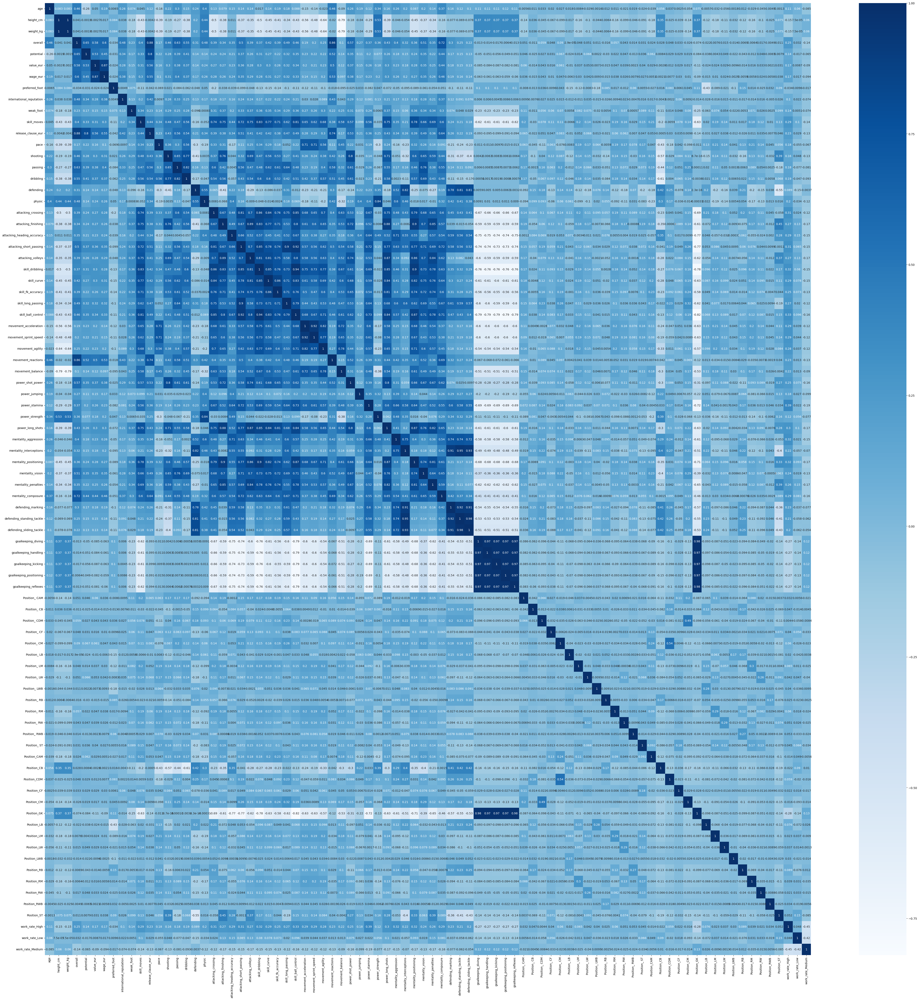

In [ ]:
# Heatmap
plt.figure(figsize=(60,60))
sns.heatmap(corr_matrix,annot=True,cmap='Blues')

In [ ]:
threshold = 0.9

high_corr_pairs = []

for i in range(len(corr_matrix.columns)):
    for j in range(i):
        if abs(corr_matrix.iloc[i, j]) > threshold:
            feature_1=corr_matrix.columns[i]
            feature_2=corr_matrix.columns[j]
            corr_value =  corr_matrix.iloc[i, j]
            high_corr_pairs.append([feature_1, feature_2, corr_value])

high_corr_df = pd.DataFrame(high_corr_pairs, columns=["Feature 1", "Feature 2", "Correlation"])

high_corr_df

,Feature 1,Feature 2,Correlation
0,weight_kg,height_cm,1.000000
1,skill_ball_control,attacking_short_passing,0.917721
2,skill_ball_control,skill_dribbling,0.943461
3,movement_sprint_speed,movement_acceleration,0.923721
4,mentality_positioning,skill_dribbling,0.904501
5,defending_marking,mentality_interceptions,0.907401
6,defending_standing_tackle,mentality_interceptions,0.945287
7,defending_standing_tackle,defending_marking,0.918593
8,defending_sliding_tackle,mentality_interceptions,0.933894
9,defending_sliding_tackle,defending_marking,0.909153


Observation:
- In our analysis, we decided not to remove any columns from the dataset, as all the features are deemed important for capturing the underlying patterns in the data.
- Instead of eliminating features, we chose to apply Principal Component Analysis (PCA) for dimensionality reduction

### Principal Component Analysis
- Principal Component Analysis (PCA) is a powerful statistical technique commonly used in machine learning for dimensionality reduction. It transforms the original features of a dataset into a smaller set of new features, known as principal components, which capture the most important variations in the data. This helps to simplify complex datasets by reducing the number of features while retaining most of the data's original variability.

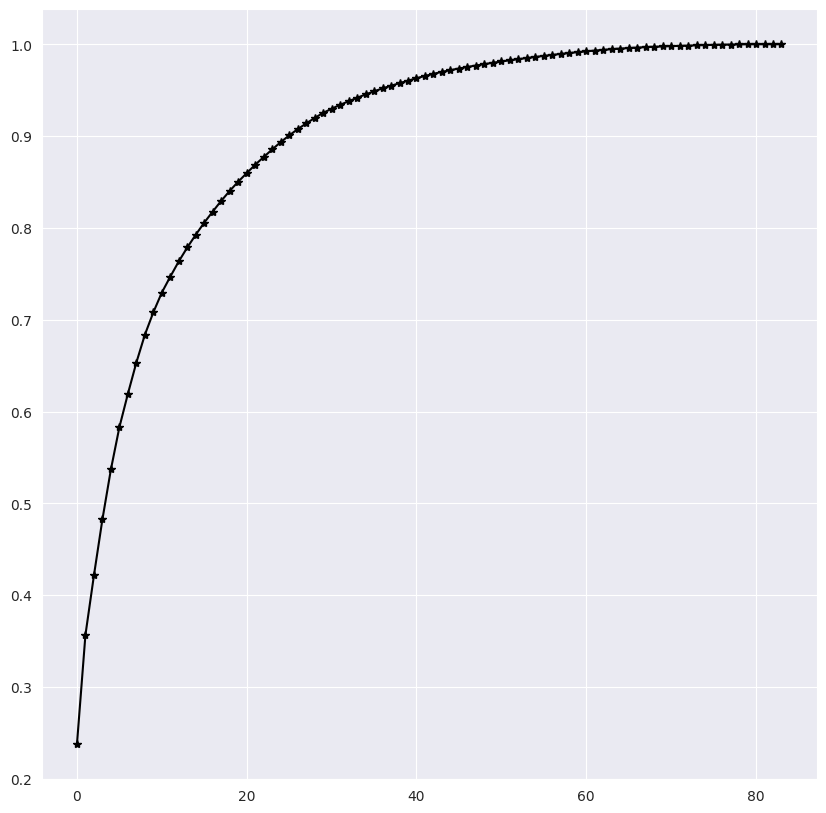

In [ ]:
from sklearn.decomposition import PCA
pca=PCA()
pca_df=pca.fit_transform(df)
plt.figure(figsize=(10,10))
sns.set_style('darkgrid')
plt.plot(np.cumsum(pca.explained_variance_ratio_),c='black',marker='*')

In [ ]:
value=np.cumsum(pca.explained_variance_ratio_)>=0.9
n_components=np.argmax(value)+1
n_components

26

In [ ]:
# We will use pca=26 because it captures 90 % variance

In [ ]:
pca=PCA(n_components=26)
pca_df=pca.fit_transform(df)
pca_df=pd.DataFrame(pca_df,columns=[f'pca{i}' for i in range(1,27)])

In [ ]:
pca_df

,pca1,pca2,pca3,pca4,pca5,pca6,pca7,pca8,pca9,pca10,...,pca17,pca18,pca19,pca20,pca21,pca22,pca23,pca24,pca25,pca26
0,-1.858343,-1.119445,-0.364656,0.081392,0.108260,-1.132016,-0.165972,0.725146,-0.999953,0.104493,...,-0.278434,0.325425,-0.388652,0.031451,0.519356,-0.009656,-0.242403,-0.554742,0.354895,0.528499
1,-1.894258,-1.011999,1.531088,0.646177,0.383866,-0.924074,0.019830,0.297445,-0.628860,0.436842,...,0.074563,-0.031118,-0.115041,-0.289827,-0.105935,-0.115327,0.102619,0.039787,0.556715,-0.217903
2,-1.853678,-1.144087,0.072341,0.660139,0.339939,-0.172287,0.011366,-0.241486,-0.677399,-0.539845,...,0.746725,0.200115,0.069041,0.056252,-0.018782,-0.193606,0.335204,-0.176155,-0.330854,0.362687
3,2.036956,-0.570929,-0.073394,1.232393,0.323701,-0.451387,-0.100429,-0.041295,-0.603355,0.077381,...,0.190488,0.251642,-0.120902,0.003257,0.024094,-0.139535,-0.227157,-0.185614,-0.124496,-0.094070
4,-1.749658,-0.982508,0.148287,0.660716,0.280265,-0.185410,-0.137088,-0.304736,-0.653961,-0.392062,...,0.067890,0.188274,-0.324465,-0.005352,-0.054318,-0.185488,0.134618,-0.032287,-0.391632,0.249233
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
18273,0.934936,0.892999,0.555437,-0.541902,-0.573375,0.797336,0.179318,-0.222451,0.221253,-0.606573,...,0.004735,0.100435,0.003946,-0.032475,0.025561,-0.056439,0.016261,0.091976,0.023659,0.027612
18274,1.058470,0.747876,-0.059166,-1.037206,-0.209925,0.700948,0.067700,0.041244,0.024278,-0.323240,...,-0.019759,-0.109675,-0.026519,-0.028821,0.105465,-0.159753,-0.007568,0.063104,0.016366,0.020259
18275,0.695774,0.306033,-0.016237,-0.770853,0.225470,0.418406,0.689756,0.737954,0.494892,0.302784,...,0.056270,0.316092,-0.339242,-0.050988,-0.069625,0.285809,-0.192153,0.285050,0.036694,0.000657
18276,0.572876,0.221535,0.247472,-0.538409,0.040717,0.507978,0.830712,1.127731,0.441504,0.524694,...,0.185094,-0.283590,-0.298819,-0.063937,-0.008160,0.160430,-0.119565,0.245255,0.016134,-0.006332


### Model Creation

### K means:

#### Use the Elbow function to determine the optimal number of Clusters:

Text(0, 0.5, 'WCSS')

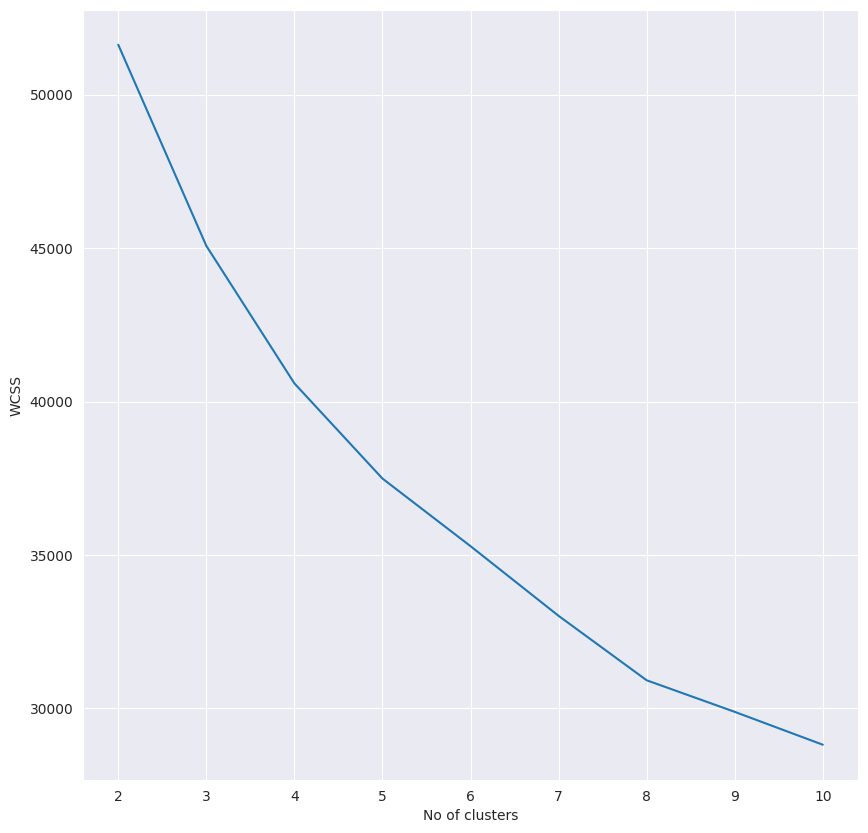

In [ ]:
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score,silhouette_samples
k_means=KMeans()
wcss=[]
for i in range(2,11):
  k_means=KMeans(n_clusters=i)
  k_means.fit(pca_df)
  wcss.append(k_means.inertia_)
plt.figure(figsize=(10,10))
plt.plot(range(2,11),wcss)
plt.xlabel('No of clusters')
plt.ylabel('WCSS')

In [ ]:
df.head()

,age,height_cm,weight_kg,overall,potential,value_eur,wage_eur,preferred_foot,international_reputation,weak_foot,skill_moves,release_clause_eur,team_position,pace,shooting,passing,dribbling,defending,physic,attacking_crossing,attacking_finishing,attacking_heading_accuracy,attacking_short_passing,attacking_volleys,skill_dribbling,skill_curve,skill_fk_accuracy,skill_long_passing,skill_ball_control,movement_acceleration,movement_sprint_speed,movement_agility,movement_reactions,movement_balance,power_shot_power,power_jumping,power_stamina,power_strength,power_long_shots,mentality_aggression,mentality_interceptions,mentality_positioning,mentality_vision,mentality_penalties,mentality_composure,defending_marking,defending_standing_tackle,defending_sliding_tackle,goalkeeping_diving,goalkeeping_handling,goalkeeping_kicking,goalkeeping_positioning,goalkeeping_reflexes,work_rate_High,work_rate_Low,work_rate_Medium
0,0.615385,0.074074,0.074074,1.000000,0.978261,0.989250,1.000000,0,1.00,0.75,0.75,1.000000,0.018839,0.95122,0.987179,1.000000,1.000000,0.320000,0.604651,0.943182,1.000000,0.738636,1.000000,0.977011,1.000000,0.988636,1.000000,1.000000,1.000000,0.929412,0.858824,0.964706,0.986667,0.976471,0.888889,0.644737,0.741176,0.623377,1.000000,0.453488,0.415730,0.989247,1.000000,0.800000,1.000000,0.344086,0.367816,0.264368,0.056180,0.109890,0.152174,0.144444,0.076923,0,1,1
1,0.692308,0.703704,0.703704,0.978261,0.956522,0.936346,0.947460,1,1.00,0.75,1.00,0.926449,0.018967,1.00000,1.000000,1.000000,1.000000,0.266667,0.883721,0.897727,0.989247,0.954545,0.894118,0.965517,0.913978,0.852273,0.800000,0.821429,0.956044,0.905882,0.941176,0.894118,1.000000,0.694118,1.000000,1.000000,0.858824,0.753247,0.988889,0.627907,0.292135,1.000000,0.858824,0.917647,0.988095,0.290323,0.310345,0.241379,0.067416,0.109890,0.152174,0.144444,0.109890,1,1,0
2,0.423077,0.259259,0.259259,0.956522,0.934783,1.000000,0.894751,1,1.00,1.00,1.00,0.999681,0.038062,1.00000,0.897436,1.000000,1.000000,0.226667,0.418605,0.931818,0.913978,0.647727,0.941176,0.965517,0.989247,0.931818,0.922222,0.869048,0.989011,0.964706,0.917647,1.000000,0.946667,0.847059,0.814815,0.552632,0.811765,0.376623,0.888889,0.488372,0.370787,0.913978,0.952941,0.976471,0.976190,0.279570,0.241379,0.298851,0.089888,0.087912,0.152174,0.155556,0.109890,1,0,1
3,0.384615,0.740741,0.740741,0.934783,0.956522,0.966706,0.761945,1,0.50,0.50,0.00,0.982020,0.083045,0.48051,0.478183,0.536889,0.574458,0.487380,0.578527,0.090909,0.096774,0.113636,0.423529,0.114943,0.086022,0.079545,0.111111,0.380952,0.274725,0.364706,0.576471,0.658824,0.893333,0.435294,0.555556,0.776316,0.341176,0.753247,0.088889,0.290698,0.179775,0.096774,0.658824,0.047059,0.666667,0.279570,0.080460,0.172414,0.966292,1.000000,0.836957,0.988889,0.967033,0,0,1
4,0.461538,0.259259,0.259259,0.934783,0.913043,0.982847,0.970949,1,0.75,0.75,0.75,0.993821,0.018967,1.00000,0.871795,1.000000,1.000000,0.266667,0.604651,0.863636,0.881720,0.636364,0.964706,0.919540,0.978495,0.875000,0.833333,0.892857,0.978022,0.964706,0.905882,0.988235,0.920000,0.964706,0.839506,0.486842,0.847059,0.558442,0.844444,0.523256,0.426966,0.913978,0.941176,0.952941,0.940476,0.354839,0.252874,0.218391,0.112360,0.120879,0.054348,0.077778,0.076923,1,0,1


In [ ]:
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_samples,silhouette_score

In [ ]:

pca=PCA(n_components=2)
pca_df=pca.fit_transform(df)
pca_df=pd.DataFrame(pca_df,columns=[f'pca{i}' for i in range(1,3)])

#### After various analysis we found that pca =2 perform well on model

In [ ]:
pd.set_option('display.max_columns',None)

In [ ]:
df.head()

,age,height_cm,weight_kg,overall,potential,value_eur,wage_eur,preferred_foot,international_reputation,weak_foot,...,Position_LW,Position_LWB,Position_RB,Position_RM,Position_RW,Position_RWB,Position_ST,work_rate_High,work_rate_Low,work_rate_Medium
0,0.615385,0.074074,0.074074,1.000000,0.978261,0.994610,1.000000,0,1.00,0.75,...,0,0,0,0,1,0,0,0,1,1
1,0.692308,0.703704,0.703704,0.978261,0.956522,0.968081,0.974862,1,1.00,0.75,...,0,0,0,0,0,0,1,1,1,0
2,0.423077,0.259259,0.259259,0.956522,0.934783,1.000000,0.949644,1,1.00,1.00,...,1,0,0,0,0,0,0,1,0,1
3,0.384615,0.740741,0.740741,0.934783,0.956522,0.983305,0.886104,1,0.50,0.50,...,0,0,0,0,0,0,0,0,0,1
4,0.461538,0.259259,0.259259,0.934783,0.913043,0.991399,0.986101,1,0.75,0.75,...,1,0,0,0,0,0,0,1,0,1


In [ ]:
import matplotlib.cm as cm

#### Creating a function to select parametres for k Means

For n_clusters = 2 The average silhouette_score is : 0.6173268528610482
For n_clusters = 3 The average silhouette_score is : 0.4943347987083567
For n_clusters = 4 The average silhouette_score is : 0.4668760617375205


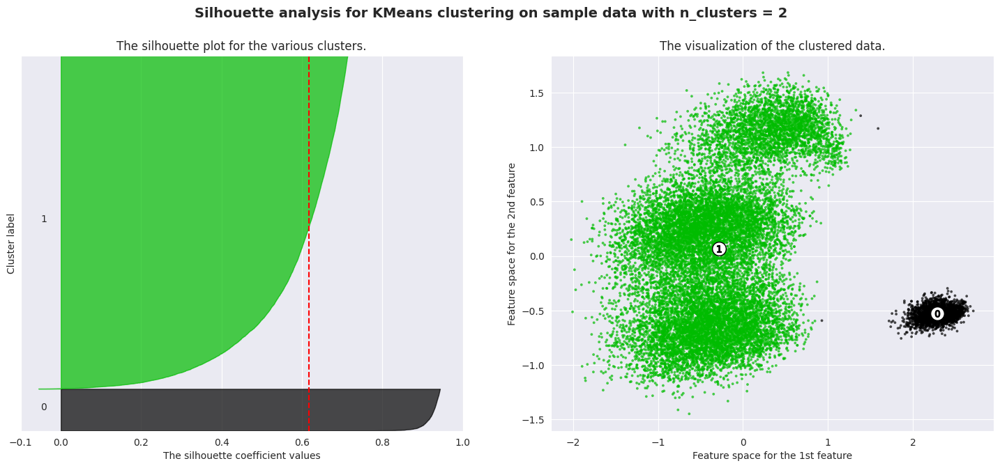

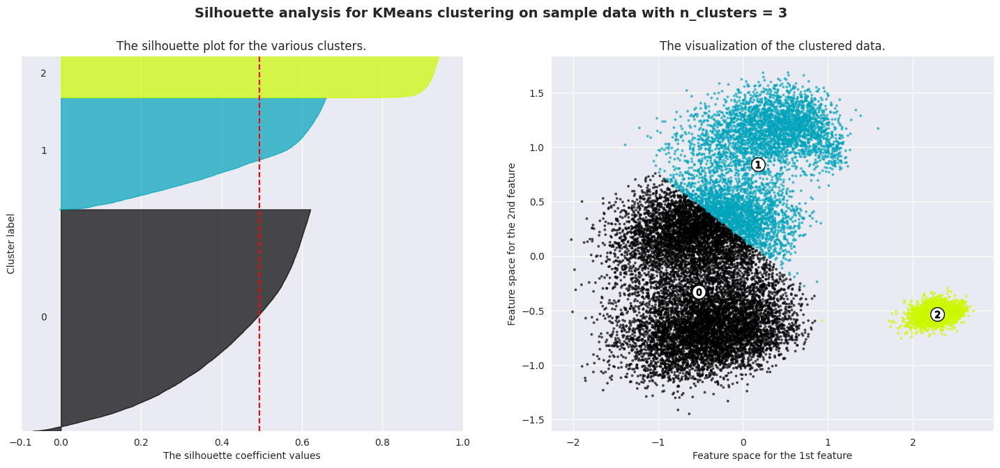

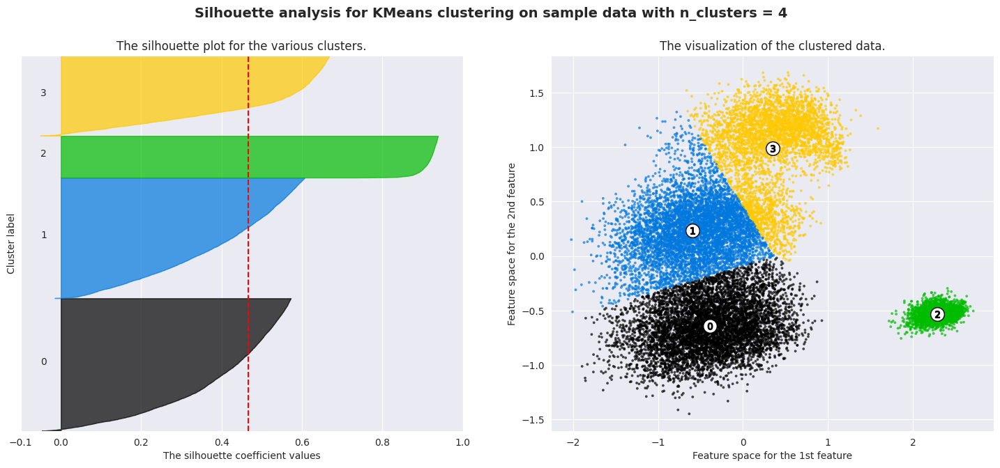

In [ ]:
range_n_clusters = [2,3,4,5,6]

for n_clusters in range_n_clusters:
    # Create a subplot with 1 row and 2 columns
    fig, (ax1, ax2) = plt.subplots(1, 2)
    fig.set_size_inches(18, 7)

    # The 1st subplot is the silhouette plot
    # The silhouette coefficient can range from -1, 1 but in this example all
    # lie within [-0.1, 1]
    ax1.set_xlim([-0.1, 1])
    # The (n_clusters+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    ax1.set_ylim([0, len(pca_df) + (n_clusters + 1) * 10])

    # Initialize the clusterer with n_clusters value and a random generator
    # seed of 10 for reproducibility.
    clusterer = KMeans(n_clusters=n_clusters, n_init="auto", random_state=10)
    cluster_labels = clusterer.fit_predict(pca_df)

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed
    # clusters
    silhouette_avg = silhouette_score(pca_df, cluster_labels)
    print(
        "For n_clusters =",
        n_clusters,
        "The average silhouette_score is :",
        silhouette_avg,
    )

    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(pca_df, cluster_labels)

    y_lower = 10
    for i in range(n_clusters):
        # Aggregate the silhouette scores for samples belonging to
        # cluster i, and sort them
        ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / n_clusters)
        ax1.fill_betweenx(
            np.arange(y_lower, y_upper),
            0,
            ith_cluster_silhouette_values,
            facecolor=color,
            edgecolor=color,
            alpha=0.7,
        )

        # Label the silhouette plots with their cluster numbers at the middle
        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    ax1.set_title("The silhouette plot for the various clusters.")
    ax1.set_xlabel("The silhouette coefficient values")
    ax1.set_ylabel("Cluster label")

    # The vertical line for average silhouette score of all the values
    ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

    ax1.set_yticks([])  # Clear the yaxis labels / ticks
    ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

    # 2nd Plot showing the actual clusters formed
    colors = cm.nipy_spectral(cluster_labels.astype(float) / n_clusters)
    ax2.scatter(
    pca_df['pca1'], pca_df['pca2'], marker=".", s=30, lw=0, alpha=0.7, c=colors, edgecolor="k"
)

    # Labeling the clusters
    centers = clusterer.cluster_centers_
    # Draw white circles at cluster centers
    ax2.scatter(
        centers[:, 0],
        centers[:, 1],
        marker="o",
        c="white",
        alpha=1,
        s=200,
        edgecolor="k",
    )

    for i, c in enumerate(centers):
        ax2.scatter(c[0], c[1], marker="$%d$" % i, alpha=1, s=50, edgecolor="k")

    ax2.set_title("The visualization of the clustered data.")
    ax2.set_xlabel("Feature space for the 1st feature")
    ax2.set_ylabel("Feature space for the 2nd feature")

    plt.suptitle(
        "Silhouette analysis for KMeans clustering on sample data with n_clusters = %d"
        % n_clusters,
        fontsize=14,
        fontweight="bold",
    )

plt.show()

Observation:
- In our analysis of the FIFA dataset, we performed clustering using the K-Means algorithm to group the players into distinct categories. Initially, we found that Cluster 1 had a score of 61%, indicating that it had a reasonable grouping of players. However, we decided to choose Cluster 4 as the optimal cluster for further analysis due to its better separation from the other clusters.
- The reason for selecting Cluster 4 is that it exhibited clearer distinctions between different groups, which is crucial when working with categorical roles in a dataset like the FIFA dataset. The dataset contains four key categories of players: Attackers, Midfielders, Defenders, and Goalkeepers.

In [ ]:
from sklearn.cluster import KMeans

In [ ]:
k_mean_df=pca_df.copy()

In [ ]:
k_means = KMeans(n_clusters=4, random_state=42)
k_mean_df['Cluster'] = k_means.fit_predict(pca_df)

Cluster Centroids (PCA space):
       pca1      pca2
0 -0.389371 -0.641934
1 -0.592572  0.235927
2  2.284099 -0.529830
3  0.352229  0.991787


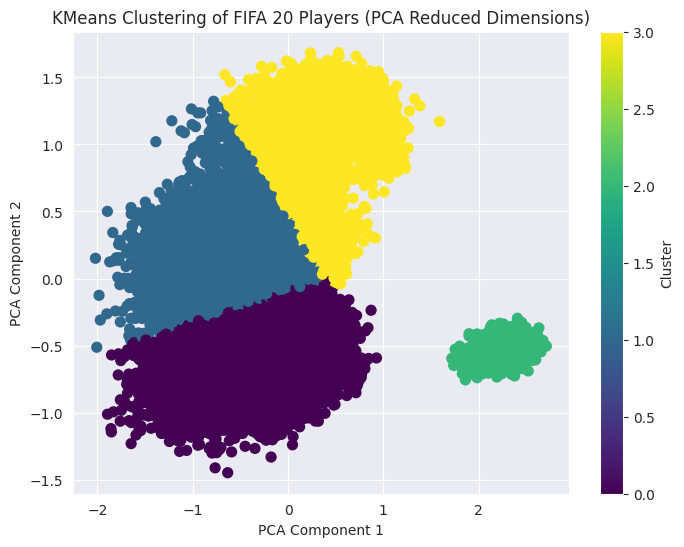

In [ ]:
cluster_centroids = pd.DataFrame(k_means.cluster_centers_, columns=['pca1', 'pca2'])
print("Cluster Centroids (PCA space):")
print(cluster_centroids)

plt.figure(figsize=(8, 6))
plt.scatter(pca_df['pca1'], pca_df['pca2'], c=k_mean_df['Cluster'], cmap='viridis', s=50)
plt.title("KMeans Clustering of FIFA 20 Players (PCA Reduced Dimensions)")
plt.xlabel('PCA Component 1')
plt.ylabel('PCA Component 2')
plt.colorbar(label='Cluster')
plt.show()

In [ ]:
score_kmeans=silhouette_score(k_mean_df,k_mean_df['Cluster'])

In [ ]:
k_mean_df

,pca1,pca2,Cluster
0,-1.858343,-1.119445,0
1,-1.894258,-1.011999,0
2,-1.853678,-1.144087,0
3,2.036956,-0.570929,2
4,-1.749658,-0.982508,0
...,...,...,...
18273,0.934936,0.892999,3
18274,1.058470,0.747876,3
18275,0.695774,0.306033,3
18276,0.572876,0.221535,3


Observation:
- cluster 0 represents likes to play in more attacking players, mostly strikers and attacking mid-fielders.
- cluster 1 represents players likes playing in center part of pitch and create chances throught their passing abilities.
- cluster 2  represents Defenders protecting their goal.
- cluster 3  represents Goalkeepers standing like a wall to nullify any attempt of opposition to score goals.

<Axes: xlabel='pca1', ylabel='pca2'>

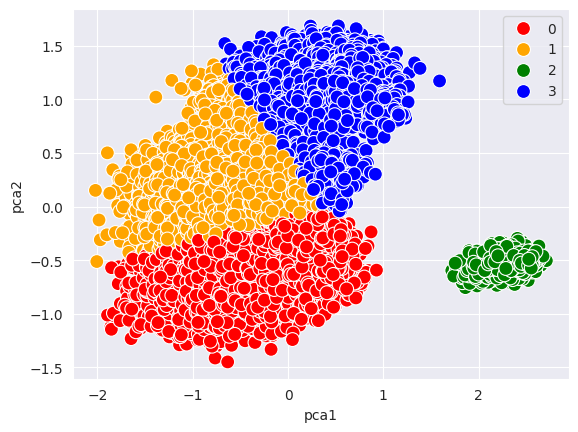

In [ ]:
color = np.array(['red', 'orange', 'green', 'blue'])

# Create the scatter plot with seaborn
sns.scatterplot(x=k_mean_df['pca1'], y=k_mean_df['pca2'], hue=k_means.labels_, palette=color, s=100)


In [ ]:
k_mean_df['name']=data['short_name']

In [ ]:
k_mean_df

,pca1,pca2,Cluster,name
0,-1.858343,-1.119445,0,L. Messi
1,-1.894258,-1.011999,0,Cristiano Ronaldo
2,-1.853678,-1.144087,0,Neymar Jr
3,2.036956,-0.570929,2,J. Oblak
4,-1.749658,-0.982508,0,E. Hazard
...,...,...,...,...
18273,0.934936,0.892999,3,Shao Shuai
18274,1.058470,0.747876,3,Xiao Mingjie
18275,0.695774,0.306033,3,Zhang Wei
18276,0.572876,0.221535,3,Wang Haijian


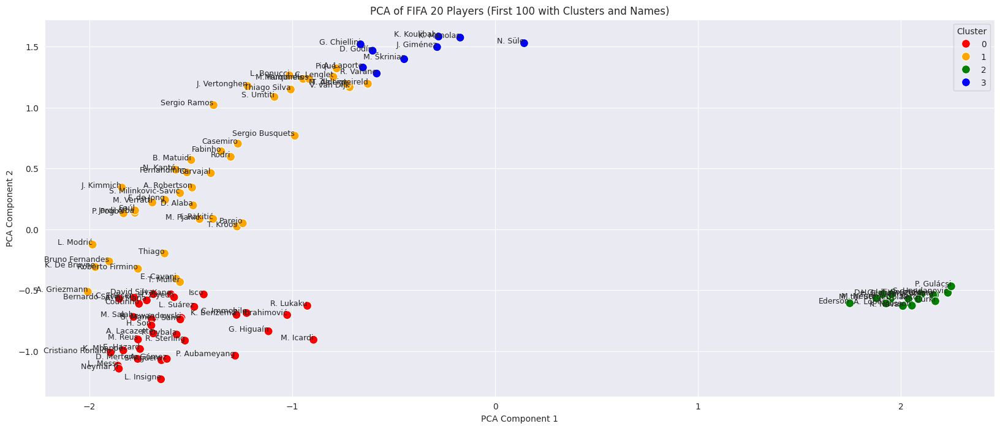

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt


k_mean_df_subset = k_mean_df.iloc[:100]


color = ['red', 'orange', 'green', 'blue']


plt.figure(figsize=(20, 8))

sns.scatterplot(x=k_mean_df_subset['pca1'], y=k_mean_df_subset['pca2'], hue=k_mean_df['Cluster'], palette=color, s=100)

for i in range(len(k_mean_df_subset)):
    plt.text(k_mean_df_subset['pca1'].iloc[i], k_mean_df_subset['pca2'].iloc[i],
             k_mean_df_subset['name'].iloc[i], fontsize=9, ha='right')


plt.title('PCA of FIFA 20 Players (First 100 with Clusters and Names)')
plt.xlabel('PCA Component 1')
plt.ylabel('PCA Component 2')
plt.legend(title="Cluster", loc='upper right')
plt.show()


Observation:
-  cluster 0 or red  represents likes to play in more attacking players, mostly strikers and attacking mid-fielders.
- cluster 1 or yellow represents players likes playing in center part of pitch and create chances throught their passing abilities.
- cluster 3 or blue represents Defenders protecting their goal.
- cluster  2 or green represents Goalkeepers standing like a wall to nullify any attempt of opposition to score goals.

In [ ]:
pca_df


,pca1,pca2
0,-1.858343,-1.119445
1,-1.894258,-1.011999
2,-1.853678,-1.144087
3,2.036956,-0.570929
4,-1.749658,-0.982508
...,...,...
18273,0.934936,0.892999
18274,1.058470,0.747876
18275,0.695774,0.306033
18276,0.572876,0.221535


### Hierarchical clustering

In [ ]:
from scipy.cluster.hierarchy import dendrogram, linkage
from sklearn.cluster import AgglomerativeClustering


In [ ]:
pca_df

,pca1,pca2
0,-1.858343,-1.119445
1,-1.894258,-1.011999
2,-1.853678,-1.144087
3,2.036956,-0.570929
4,-1.749658,-0.982508
...,...,...
18273,0.934936,0.892999
18274,1.058470,0.747876
18275,0.695774,0.306033
18276,0.572876,0.221535


Dendogram
- The dendrogram is a tree-like diagram used to visualize the results of hierarchical clustering, which is an unsupervised learning technique. It represents the arrangement of clusters and their relationships, helping to understand how data points or clusters are grouped at different levels of similarity.

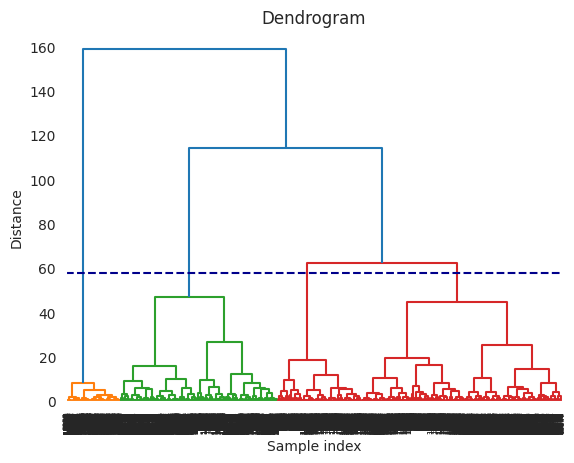

In [ ]:

linked = linkage(pca_df, method='ward')
dendrogram(linked)
plt.axhline(58, linestyle='--', color='darkblue')
plt.title('Dendrogram')
plt.xlabel('Sample index')
plt.ylabel('Distance')
plt.show()

Creating a function to find the best parameters for Hierarchical Clustering

In [ ]:
from sklearn.metrics import silhouette_score
from sklearn.cluster import AgglomerativeClustering

def hier_cluster(data, metrics, linkages, n_clusters=4):
    for metric in metrics:
        for linkage in linkages:
            if linkage == 'ward' and metric != 'euclidean':
                print(f"Skipping combination: metric={metric}, linkage={linkage} (incompatible)")
                continue
            try:

                agglo = AgglomerativeClustering(n_clusters=n_clusters, metric=metric, linkage=linkage)
                cluster_labels = agglo.fit_predict(data)
                score = silhouette_score(data, cluster_labels)
                print(f"Metric: {metric}, Linkage: {linkage}, Silhouette Score: {score:.4f}")
            except Exception as e:
                print(f"Error with combination: metric={metric}, linkage={linkage}. Error: {e}")


In [ ]:
hier_cluster(
    data=pca_df,
    metrics=['euclidean', 'cosine', 'manhattan', 'chebyshev', 'correlation'],
    linkages=['ward', 'average', 'complete', 'single', 'weighted']
)



In [ ]:
agglo=AgglomerativeClustering(n_clusters=4,metric='manhattan',linkage='average')
hier_df=pca_df.copy()
hier_df['Cluster']=agglo.fit_predict(hier_df)
score_agglo=silhouette_score(pca_df,hier_df['Cluster'])

<Axes: xlabel='pca1', ylabel='pca2'>

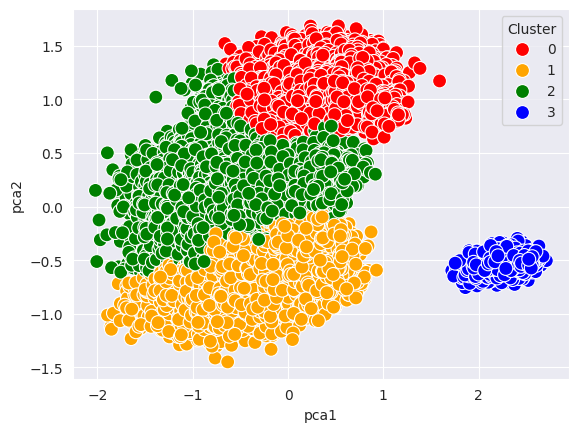

In [ ]:
color = np.array(['red', 'orange', 'green', 'blue'])

sns.scatterplot(x=hier_df['pca1'], y=hier_df['pca2'], hue=hier_df['Cluster'], palette=color, s=100)

- In our analysis, we experimented with different configurations for hierarchical clustering, specifically focusing on the distance metric and linkage criterion. After testing various combinations, we found that using the Manhattan distance metric and the Average linkage method provided the best performance for our dataset.
- When we applied this combination of Manhattan distance and Average linkage, we observed an improvement in clustering performance. Specifically, the Silhouette Score for the clustering model was 45%.

Observation:

- cluster 1 or yellow represents likes to play in more attacking players, mostly strikers and attacking mid-fielders.
- cluster 2 or green represents players likes playing in center part of pitch and create chances throught their passing abilities.
- cluster 0 or red represents Defenders protecting their goal.
- cluster 3  or blue represents Goalkeepers standing like a wall to nullify any attempt of opposition to score goals.

### DBSCAN

In [ ]:
dbs_df=pca_df.copy()

Creating a function to find the best parameters for DBSCAN

In [ ]:
from sklearn.cluster import DBSCAN
from sklearn.metrics import silhouette_score

def dbscan(data, eps_list, min_samples_list):

    for eps_val in eps_list:
        for min_samples_val in min_samples_list:
            try:
                dbs_model = DBSCAN(eps=eps_val, min_samples=min_samples_val)
                cluster_labels = dbs_model.fit_predict(data)

                if len(set(cluster_labels)) > 1:
                    score = silhouette_score(data, cluster_labels)
                    print(f"eps: {eps_val}, min_samples: {min_samples_val}, Silhouette Score: {score:.4f}")
                    print(f'No of cluster is : {len(set(cluster_labels))} ')
                else:
                    print(f"eps: {eps_val}, min_samples: {min_samples_val}, Result: Only one cluster or noise.")
            except Exception as e:
                print(f"Error with combination: eps={eps_val}, min_samples={min_samples_val}. Error: {e}")


In [ ]:
eps = np.arange(0.1, 2.0, 0.1)
eps

array([0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9])

In [ ]:
dbscan(pca_df,eps,[1,2,3,4,5,6,7])

eps: 0.1, min_samples: 1, Silhouette Score: -0.1444
No of cluster is : 21 
eps: 0.1, min_samples: 2, Silhouette Score: 0.1145
No of cluster is : 9 
eps: 0.1, min_samples: 3, Silhouette Score: 0.2761
No of cluster is : 4 
eps: 0.1, min_samples: 4, Silhouette Score: 0.4097
No of cluster is : 3 
eps: 0.1, min_samples: 5, Silhouette Score: 0.4110
No of cluster is : 3 
eps: 0.1, min_samples: 6, Silhouette Score: 0.4070
No of cluster is : 3 
eps: 0.1, min_samples: 7, Silhouette Score: 0.4046
No of cluster is : 3 
eps: 0.2, min_samples: 1, Silhouette Score: 0.2712
No of cluster is : 4 
eps: 0.2, min_samples: 2, Silhouette Score: 0.4541
No of cluster is : 3 
eps: 0.2, min_samples: 3, Silhouette Score: 0.4541
No of cluster is : 3 
eps: 0.2, min_samples: 4, Silhouette Score: 0.4541
No of cluster is : 3 
eps: 0.2, min_samples: 5, Silhouette Score: 0.4541
No of cluster is : 3 
eps: 0.2, min_samples: 6, Silhouette Score: 0.4541
No of cluster is : 3 
eps: 0.2, min_samples: 7, Silhouette Score: 0.460

In [ ]:
from sklearn.cluster import DBSCAN
dbs=DBSCAN(eps=0.2,min_samples=1)
cluster=dbs.fit_predict(dbs_df)
score_dbscan=silhouette_score(pca_df,cluster)

<Axes: xlabel='pca1', ylabel='pca2'>

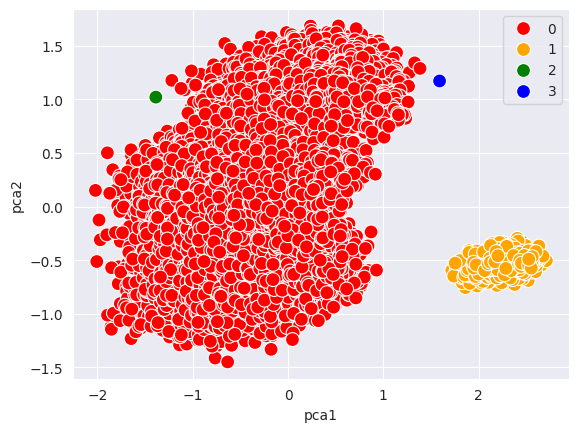

In [ ]:
color = np.array(['red', 'orange', 'green', 'blue'])

sns.scatterplot(x=dbs_df['pca1'], y=dbs_df['pca2'], hue=cluster, palette=color, s=100)

Observation:
In our analysis using DBSCAN, we found that the best parameters were eps = 0.1 and min_samples = 3, but this configuration led to a relatively low Silhouette Score of 27%, indicating poor cluster separation and cohesion. Although using different parameters improved clustering results, it resulted in only 2 clusters, which does not suit our problem, as we need more clusters to properly represent the data. The results also suggest that DBSCAN is highly sensitive to the choice of eps and min_samples, where small changes in these parameters can significantly affect the clustering outcome.

### Gaussian Mixture Models

In [ ]:
gausian_df=pca_df.copy()

In [ ]:
from sklearn.mixture import GaussianMixture
from sklearn.metrics import silhouette_score
import numpy as np
import matplotlib.pyplot as plt

def fit_and_plot_gmm(data, n_components, covariance_types):
    for i in n_components:
        for j in covariance_types:

            gmm = GaussianMixture(n_components=i, covariance_type=j, random_state=42)
            gmm.fit(data)


            labels = gmm.predict(data)

            try:
                silhouette = silhouette_score(data, labels)
                print(f"n_components: {i}, covariance_type: {j}, Silhouette Score: {silhouette:.4f}")
            except ValueError as e:
                print(f"Unable to calculate Silhouette Score: {e}")


In [ ]:
fit_and_plot_gmm(pca_df, [ 2, 3, 4, 5, 6], covariance_types=['full','tied',"spherical","diag"])

n_components: 2, covariance_type: full, Silhouette Score: 0.6175
n_components: 2, covariance_type: tied, Silhouette Score: 0.6175
n_components: 2, covariance_type: spherical, Silhouette Score: 0.6167
n_components: 2, covariance_type: diag, Silhouette Score: 0.6174
n_components: 3, covariance_type: full, Silhouette Score: 0.4985
n_components: 3, covariance_type: tied, Silhouette Score: 0.5125
n_components: 3, covariance_type: spherical, Silhouette Score: 0.5157
n_components: 3, covariance_type: diag, Silhouette Score: 0.5121
n_components: 4, covariance_type: full, Silhouette Score: 0.4572
n_components: 4, covariance_type: tied, Silhouette Score: 0.4559
n_components: 4, covariance_type: spherical, Silhouette Score: 0.4575
n_components: 4, covariance_type: diag, Silhouette Score: 0.4579
n_components: 5, covariance_type: full, Silhouette Score: 0.4405
n_components: 5, covariance_type: tied, Silhouette Score: 0.4400
n_components: 5, covariance_type: spherical, Silhouette Score: 0.4317
n_com

In [ ]:
gmm = GaussianMixture(n_components=4, covariance_type='diag', random_state=42)
gmm.fit(pca_df)
gausian_df['cluster'] = gmm.predict(pca_df)

<Axes: xlabel='pca1', ylabel='pca2'>

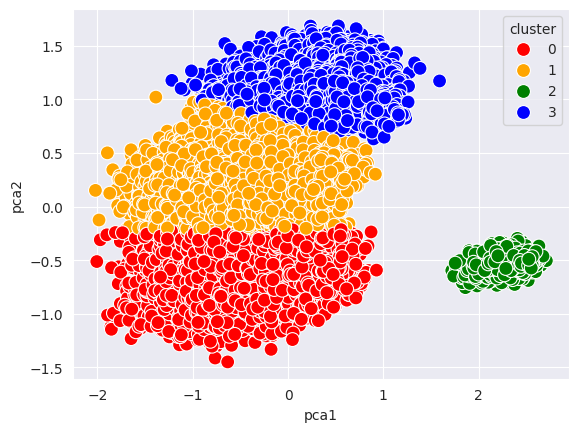

In [ ]:
color = np.array(['red', 'orange', 'green', 'blue'])
sns.scatterplot(x=dbs_df['pca1'], y=dbs_df['pca2'], hue=gausian_df['cluster'], palette=color, s=100)

Observation:
- In our analysis, we found that using n_components = 4 and covariance_type = 'diag' in the Gaussian Mixture Model (GMM) provided good performance. This configuration resulted in a Silhouette Score of 45%, indicating a moderate but reasonable separation between the clusters. The n_components = 4 parameter aligns well with the four distinct categories in our dataset.
- ven though n_components = 2 and n_components = 3 also performed well, we chose n_components = 4 because it closely matches the structure of the dataset, which represents four key categories in football: Attackers, Midfielders, Defenders, and Goalkeepers. Additionally, the covariance_type = 'diag' allows for each cluster to have its own covariance structure, helping the model better capture the underlying patterns in the data

In [ ]:
score_gaussian=silhouette_score(pca_df,gausian_df['cluster'])

In [ ]:
score_data={'Algorithm Name':['Kmeans','Hierarchical','DBSCAN','Gaussian mixture'],
            'Silhoutte Scores':[score_kmeans,score_agglo,score_dbscan,score_gaussian],
            'Distribution':['cluster are overlapping , but okay','Distribution of cluster is okay','Distribution of cluster is not good','It provides better cluster seperation when compared to others']

            }

In [ ]:
score_df=pd.DataFrame(score_data)

In [ ]:
score_df

,Algorithm Name,Silhoutte Scores,Distribution
0,Kmeans,0.651172,"cluster are overlapping , but okay"
1,Hierarchical,0.450875,Distribution of cluster is okay
2,DBSCAN,0.271235,Distribution of cluster is not good
3,Gaussian mixture,0.457870,It provides better cluster seperation when com...


# Model Comparison Report




## Dataset: FIFA 20 Dataset
- This report evaluates the performance of multiple clustering algorithms applied to the FIFA 20 dataset.
- The objective is to identify the best algorithm based on silhouette scores and cluster distribution quality for production use.

## Evaluation Metrics
- The primary metric used for model evaluation is the Silhouette Score, which measures how well-separated clusters are.
- Higher scores indicate better-defined clusters. Observations of cluster distribution are also included to provide qualitative insights.

## Performance Summary
__1. KMeans:__
- Silhouette Score: 0.651172

- Cluster Distribution:
     - Clusters show some overlap but remain reasonably well-defined.
     - Provides a balance between simplicity, efficiency, and performance.
- Remarks:
     Best-performing model based on silhouette score.

__2. Hierarchical Clustering:__
- Silhouette Score: 0.651172
- Cluster Distribution:
    - Acceptable cluster separation but lacks the clarity seen in KMeans.
    - More prone to cluster instability as data complexity increases.
- Remarks:
    - Best-performing model based on silhouette score.

__3. DBSCAN (Density-Based Spatial Clustering)__
- Silhouette Score: 0.271235
- Cluster Distribution:
    - Clusters are poorly separated and difficult to interpret.
    - Struggles with this dataset due to its density variations.
-Remarks:
   - Not suitable for the FIFA 20 dataset.

__4. Gaussian Mixture Model (GMM)__
- Silhouette Score: 0.457870
- Cluster Distribution:
    - Provides better separation than DBSCAN and Hierarchical Clustering.
    - Assumes data is generated from a Gaussian distribution, which may not fit the dataset perfectly.
- Remarks:
    - GMM scores is less than K merans but the seperation of cluster is good in gmm

# Project Challenges

During the data analysis phase of this project, we faced several challenges that required different techniques to overcome. Some of the challenges are listed below along with the techniques we used to tackle them:

__Exploratory Data Analysis:__

When dealing with a dataset that contains a large number of columns (like 104), manually plotting a graph for each column can be time-consuming and impractical. In such cases, tools like Sweetviz are incredibly helpful for quickly generating insightful visualizations and summaries of the data.
Sweetviz is a Python library that provides an easy-to-use interface for creating visualizations, performing exploratory data analysis (EDA), and generating comprehensive reports.

__Missing Data:__

In our dataset there many missing columns some columns have 50% to 90% missing values, So we drop those columns.And some columns have less missing values, we replaced the null values with mean.

__Handling Ouliers:__

There are many outlier in the dataset, but outliers are genuine so we could not replace  with mean or median.So we used Winsorization for outiers.Winsorization involves capping extreme values at a certain percentile (e.g., the 1st and 99th percentiles) instead of completely removing or modifying them. Example In value eur some players are tend to recieve high slary comapred to average salary of the players.

__High Dimensionality:__

After performing correlation analysis on your dataset, I identified that some features are highly correlated with others. In such cases, removing these features could result in the loss of valuable information, especially are those features are crucial rfor my analysis. To address this issue without discarding important features, I opted to use Principal Component Analysis (PCA).

__Clustering:__  

Another challenge was selecting the optimal number of clusters for the model. Although the Elbow method can be used to determine the number of clusters, it can be subjective and inconclusive. The Silhouette score was used to evaluate the quality of the clustering, but even with this metric, it was challenging to determine the optimal number of clusters since the scores were not consistent across different cluster sizes.
